In [30]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np
from copy import deepcopy as cdc

from datetime import datetime as dt
import re
def extract_timestamps(series:pd.Series) -> pd.Series:
    timestamp = series.str.extract('_(\d{4}-[\-\d_T]*)DLC', expand=False)
    return pd.to_datetime(timestamp, format="%Y-%m-%dT%H_%M_%S")
##need to have filename column as type str in order for datetime extraction to be used, won't run on Posix type

import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy import stats

import prey_capture_python as preycap
# import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [31]:
h5_newmice="/Users/mollyshallow/Desktop/opto_metrics_result/20230530_newcohort_LD_test.h5"
h5_oldmice="/Users/mollyshallow/Desktop/opto_metrics_result/20230530_oldcohorts_LD_test.h5"

In [3]:
df_old=pd.read_hdf(h5_oldmice, key='df')
with open('folderlist.txt', 'w') as f_out:
    f_out.write('\n'.join(df_old['folder_path'].astype('str')))
df_old['filename']=df_old['filename'].astype('str')
# type(df_all['filename'][0])
df_old=df_old[df_old['filename'].str.contains('0896|0897|0898|0893|0895')]
df_old['capduration']=df_old['captureT']-df_old['timetointercept']

df_new=pd.read_hdf(h5_newmice, key='df')
with open('folderlist.txt', 'w') as f_out:
    f_out.write('\n'.join(df_new['folder_path'].astype('str')))
df_new['filename']=df_new['filename'].astype('str')
# type(df_all['filename'][0])
df_new=df_new[df_new['filename'].str.contains('1337|1429|1430')]
df_new['capduration']=df_new['captureT']-df_new['timetointercept']

df_all=pd.concat([df_old, df_new], ignore_index=True)

nandf=cdc(df_all)
nans=np.where(nandf['captureT']>=120)
nanvals=nandf['captureT'].iloc[nans[0]]
nandf=nandf.replace({'captureT':nanvals.values}, np.nan)

nan_attacks=np.where(nandf['timetointercept']>=120)
nan_attackvals=nandf['timetointercept'].iloc[nan_attacks[0]]
nandf=nandf.replace({'timetointercept':nan_attackvals.values}, np.nan)

nan_approach=np.where(nandf['timetoapproach']>=120)
nan_approachvals=nandf['timetoapproach'].iloc[nan_approach[0]]
nandf=nandf.replace({'timetoapproach':nan_approachvals.values}, np.nan)

nandf['capduration']=nandf['captureT']-nandf['timetointercept']

test_nandf=cdc(nandf)
test_nandf= test_nandf.drop(test_nandf[test_nandf.trials_to_drop == 'both'].index)
        

In [4]:
drops=np.where(nandf['trials_to_drop']=='both')[0]
drops

array([1704, 1705, 1706, 1711, 1713, 1717, 1718, 1723, 1725, 1726, 1729,
       1730, 1731, 1754, 1756, 1768, 1770, 1780, 1811, 1840, 1845, 1846,
       1848, 1849, 1851, 1858, 1863, 1878, 1883, 1884, 1885, 1891, 1896,
       1898, 1900, 1920, 1942, 1959, 1966, 1970, 1971, 1983, 1984, 1994,
       2005, 2007, 2031, 2035, 2037, 2038, 2056, 2094, 2135, 2137, 2183,
       2184, 2189, 2191, 2215, 2222, 2230, 2239, 2260, 2270, 2271, 2275,
       2281, 2284, 2286, 2287, 2288, 2289, 2290, 2314, 2315, 2318, 2319,
       2320, 2323, 2325, 2341, 2346, 2347, 2348, 2349, 2350, 2351, 2352,
       2353, 2354, 2355, 2356, 2365, 2374, 2377, 2378, 2379, 2380, 2382,
       2384, 2385, 2386, 2400, 2404, 2406, 2410, 2411, 2412, 2413, 2414,
       2416, 2417])

In [32]:
test_nandf=cdc(nandf)
test_nandf= test_nandf.drop(test_nandf[test_nandf.trials_to_drop == 'both'].index)
        

In [33]:
test_nandf


,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,captureframe,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-35-15_mouse-0896,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.8795219943601467, 2.442993623570855, 1.0383...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,23677.0,117120.0,0.002539,104.710,1.000000,0.500000,105.110,21022.0,5.44500,NaN,NaN
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-48-30_mouse-0897,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.198352308904875, 9.166484098923334, 9.41997...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",99.920,45034.0,65018.0,0.002763,61.860,0.500000,1.000000,62.520,12504.0,4.10750,37.400,NaN
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_10-34-40_mouse-0897,test,NaN,"[46.392508377380324, 47.23411538032969, 47.337...","[3.9652614660669916, 4.119093399691461, 4.1241...","[50.618691414766595, 50.71237504843739, 50.828...","[nan, 111.63212588755803, 104.85524437232709, ...",NaN,0.0,122683.0,0.052167,9.405,0.062500,0.500000,NaN,54497.0,259.39575,NaN,NaN
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_9-56-15_mouse-0896,test,NaN,"[40.04921463768118, 40.035394536679895, 40.026...","[1.2688213867795146, 1.3035432250095929, 1.311...","[3.0117482064091323, 3.2035749056084173, 3.922...","[81.05892397374892, 80.5885024990399, 77.60461...",NaN,0.0,119897.0,0.055047,36.030,0.030303,1.000000,NaN,114748.0,47.50325,NaN,NaN
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-07_13-59-24_mouse-0898,5,NaN,"[40.89803428142533, 41.589963686138944, 41.583...","[12.590891895604264, 12.590891895604264, 12.58...","[1.2404139363968412, 1.216827476662106, 1.4645...","[139.4622072253276, 140.52615233536343, 140.77...",NaN,0.0,97617.0,0.016390,1.110,0.125000,1.000000,NaN,87863.0,39.82925,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,9,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,6310.0,0.141276,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,9,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,3938.0,0.197472,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,9,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,3114.0,0.040080,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,9,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,43611.0,0.163335,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only


In [7]:
nandf

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,captureframe,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-35-15_mouse-0896,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.8795219943601467, 2.442993623570855, 1.0383...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,23677.0,117120.0,0.002539,104.710,1.000000,0.500000,105.110,21022.0,5.44500,NaN,NaN
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-48-30_mouse-0897,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.198352308904875, 9.166484098923334, 9.41997...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",99.920,45034.0,65018.0,0.002763,61.860,0.500000,1.000000,62.520,12504.0,4.10750,37.400,NaN
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_10-34-40_mouse-0897,test,NaN,"[46.392508377380324, 47.23411538032969, 47.337...","[3.9652614660669916, 4.119093399691461, 4.1241...","[50.618691414766595, 50.71237504843739, 50.828...","[nan, 111.63212588755803, 104.85524437232709, ...",NaN,0.0,122683.0,0.052167,9.405,0.062500,0.500000,NaN,54497.0,259.39575,NaN,NaN
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_9-56-15_mouse-0896,test,NaN,"[40.04921463768118, 40.035394536679895, 40.026...","[1.2688213867795146, 1.3035432250095929, 1.311...","[3.0117482064091323, 3.2035749056084173, 3.922...","[81.05892397374892, 80.5885024990399, 77.60461...",NaN,0.0,119897.0,0.055047,36.030,0.030303,1.000000,NaN,114748.0,47.50325,NaN,NaN
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-07_13-59-24_mouse-0898,5,NaN,"[40.89803428142533, 41.589963686138944, 41.583...","[12.590891895604264, 12.590891895604264, 12.58...","[1.2404139363968412, 1.216827476662106, 1.4645...","[139.4622072253276, 140.52615233536343, 140.77...",NaN,0.0,97617.0,0.016390,1.110,0.125000,1.000000,NaN,87863.0,39.82925,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,9,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,6310.0,0.141276,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,9,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,3938.0,0.197472,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,9,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,3114.0,0.040080,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,9,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,43611.0,0.163335,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only


In [34]:
from datetime import datetime as dt
import re
def extract_timestamps(series:pd.Series) -> pd.Series:
    timestamp = series.str.extract('_(\d{4}-[\-\d_T]*)DLC', expand=False)
    return pd.to_datetime(timestamp, format="%Y-%m-%dT%H_%M_%S")

In [35]:
test=extract_timestamps(test_nandf["filename"])

test=test.to_list()
test_nandf['timestamps']=test

In [36]:
test_nandf

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-35-15_mouse-0896,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.8795219943601467, 2.442993623570855, 1.0383...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,23677.0,...,0.002539,104.710,1.000000,0.500000,105.110,21022.0,5.44500,NaN,NaN,2022-02-03 10:35:16
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-48-30_mouse-0897,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.198352308904875, 9.166484098923334, 9.41997...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",99.920,45034.0,...,0.002763,61.860,0.500000,1.000000,62.520,12504.0,4.10750,37.400,NaN,2022-02-03 10:48:30
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_10-34-40_mouse-0897,test,NaN,"[46.392508377380324, 47.23411538032969, 47.337...","[3.9652614660669916, 4.119093399691461, 4.1241...","[50.618691414766595, 50.71237504843739, 50.828...","[nan, 111.63212588755803, 104.85524437232709, ...",NaN,0.0,...,0.052167,9.405,0.062500,0.500000,NaN,54497.0,259.39575,NaN,NaN,2022-02-04 10:34:40
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_9-56-15_mouse-0896,test,NaN,"[40.04921463768118, 40.035394536679895, 40.026...","[1.2688213867795146, 1.3035432250095929, 1.311...","[3.0117482064091323, 3.2035749056084173, 3.922...","[81.05892397374892, 80.5885024990399, 77.60461...",NaN,0.0,...,0.055047,36.030,0.030303,1.000000,NaN,114748.0,47.50325,NaN,NaN,2022-02-04 09:56:15
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-07_13-59-24_mouse-0898,5,NaN,"[40.89803428142533, 41.589963686138944, 41.583...","[12.590891895604264, 12.590891895604264, 12.58...","[1.2404139363968412, 1.216827476662106, 1.4645...","[139.4622072253276, 140.52615233536343, 140.77...",NaN,0.0,...,0.016390,1.110,0.125000,1.000000,NaN,87863.0,39.82925,NaN,NaN,2022-02-07 13:59:24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,9,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,...,0.141276,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only,2023-01-29 13:25:16
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,9,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,...,0.197472,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only,2023-01-29 13:27:15
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,9,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,...,0.040080,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only,2023-01-29 13:29:34
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,9,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,...,0.163335,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only,2023-01-29 13:30:57


In [29]:
df_1430=test_nandf[test_nandf['filename'].str.contains('1430')]
df_1430[df_1430['folder_path'].str.contains('12_54_54')]

KeyError: "None of [Float64Index([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,\n              ...\n              nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],\n             dtype='float64', length=221)] are in the [columns]"

In [18]:
test_nandf[test_nandf['folder_path'].str.contains('2023-01-29_12_54_54')]

KeyError: "None of [Float64Index([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,\n              ...\n              nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],\n             dtype='float64', length=2328)] are in the [columns]"

In [15]:
test_nandf['filename'][2327]

'/Volumes/Projects/PreyCapture/ZIActivation/2023-01-26_11-38-01_mouse-1430/Sky_mouse-1430_2023-01-26T11_38_01DLC_resnet50_optopreycapFeb16shuffle1_300000_el_filtered.csv'

In [37]:
start_cohort1_l = dt.strptime('2022-02-10', "%Y-%m-%d")
end_cohort1_l = dt.strptime('2022-02-15', "%Y-%m-%d")

start_cohort1_d = dt.strptime('2022-02-16', "%Y-%m-%d")
end_cohort1_d = dt.strptime('2022-02-21', "%Y-%m-%d")

start_cohort2_l = dt.strptime('2022-07-11', "%Y-%m-%d")
end_cohort2_l = dt.strptime('2022-07-14', "%Y-%m-%d")

start_cohort2_d = dt.strptime('2022-07-15', "%Y-%m-%d")
end_cohort2_d = dt.strptime('2022-07-22', "%Y-%m-%d")


start_cohort3_l = dt.strptime('2022-12-07', "%Y-%m-%d")
end_cohort3_l = dt.strptime('2022-12-13', "%Y-%m-%d")

start_cohort3_d = dt.strptime('2023-01-05', "%Y-%m-%d")
end_cohort3_d = dt.strptime('2023-01-11', "%Y-%m-%d")

indices=np.asarray(test_nandf.index)

for i in indices:
    if start_cohort1_l<=test_nandf['timestamps'][i]<=end_cohort1_l:
        if test_nandf['condition'][i]!=[5,6]:
            test_nandf.at[i, 'condition']='baseline_l'
  
    elif start_cohort1_d<=test_nandf['timestamps'][i]<=end_cohort1_d:
        if test_nandf['condition'][i]!=[5,6]:
            test_nandf.at[i, 'condition']='baseline_d'
        
    elif start_cohort2_l<=test_nandf['timestamps'][i]<=end_cohort2_l:
        if test_nandf['condition'][i]!=[5,6]:
            test_nandf.at[i, 'condition']='baseline_l'
        
    elif start_cohort2_d<=test_nandf['timestamps'][i]<=end_cohort2_d:
        if test_nandf['condition'][i]!=[5,6]:
            test_nandf.at[i, 'condition']='baseline_d'
        
    elif start_cohort3_l<=test_nandf['timestamps'][i]<=end_cohort3_l:
        if test_nandf['condition'][i]!=[7,8]:
            test_nandf.at[i, 'condition']='baseline_l'
        
    elif start_cohort3_d<=test_nandf['timestamps'][i]<=end_cohort3_d:
        if test_nandf['condition'][i]!=[7,8]:
            test_nandf.at[i, 'condition']='baseline_d'
    

In [38]:
indices=np.asarray(test_nandf.index)
for i in indices:
    if test_nandf['condition'][i]=='9':
        test_nandf.at[i, 'condition']='2'

In [39]:
test_nandf

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-35-15_mouse-0896,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.8795219943601467, 2.442993623570855, 1.0383...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,23677.0,...,0.002539,104.710,1.000000,0.500000,105.110,21022.0,5.44500,NaN,NaN,2022-02-03 10:35:16
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-48-30_mouse-0897,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.198352308904875, 9.166484098923334, 9.41997...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",99.920,45034.0,...,0.002763,61.860,0.500000,1.000000,62.520,12504.0,4.10750,37.400,NaN,2022-02-03 10:48:30
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_10-34-40_mouse-0897,test,NaN,"[46.392508377380324, 47.23411538032969, 47.337...","[3.9652614660669916, 4.119093399691461, 4.1241...","[50.618691414766595, 50.71237504843739, 50.828...","[nan, 111.63212588755803, 104.85524437232709, ...",NaN,0.0,...,0.052167,9.405,0.062500,0.500000,NaN,54497.0,259.39575,NaN,NaN,2022-02-04 10:34:40
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_9-56-15_mouse-0896,test,NaN,"[40.04921463768118, 40.035394536679895, 40.026...","[1.2688213867795146, 1.3035432250095929, 1.311...","[3.0117482064091323, 3.2035749056084173, 3.922...","[81.05892397374892, 80.5885024990399, 77.60461...",NaN,0.0,...,0.055047,36.030,0.030303,1.000000,NaN,114748.0,47.50325,NaN,NaN,2022-02-04 09:56:15
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-07_13-59-24_mouse-0898,5,NaN,"[40.89803428142533, 41.589963686138944, 41.583...","[12.590891895604264, 12.590891895604264, 12.58...","[1.2404139363968412, 1.216827476662106, 1.4645...","[139.4622072253276, 140.52615233536343, 140.77...",NaN,0.0,...,0.016390,1.110,0.125000,1.000000,NaN,87863.0,39.82925,NaN,NaN,2022-02-07 13:59:24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,...,0.141276,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only,2023-01-29 13:25:16
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,...,0.197472,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only,2023-01-29 13:27:15
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,...,0.040080,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only,2023-01-29 13:29:34
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,...,0.163335,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only,2023-01-29 13:30:57


In [14]:
idk=np.where(test_nandf['condition']=='test')
idk
np.size(idk)

98

In [16]:
test=np.where(test_nandf['condition']=='baseline_d')
test

(array([ 153,  154,  155,  156,  157,  158,  159,  160,  161,  162,  163,
         164,  165,  166,  167,  168,  169,  170,  171,  172,  173,  174,
         175,  176,  177,  178,  179,  180,  181,  182,  183,  184,  185,
         186,  187,  188,  189,  190,  191,  192,  193,  194,  195,  196,
         197,  198,  199,  200,  201,  202,  203,  204,  205,  206,  207,
         208,  209,  210,  211,  212,  213,  214,  215,  216,  217,  218,
         219,  220,  221,  222,  223, 1358, 1359, 1360, 1361, 1362, 1363,
        1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1373, 1374,
        1375, 1376, 1377, 1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385,
        1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396,
        1397, 1398, 1399, 1400, 1401, 1402, 1403, 1404, 1405, 1406, 1407,
        1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418,
        1419, 1420, 1421, 1422, 1423, 1424, 1425, 1426, 1427, 1428, 1429,
        1430, 1431, 1432, 1433, 1434, 

In [40]:
test_nandf.groupby(['condition', 'laser_value']).mean()

captureT   cricketdrop  captureframe  freqapproach  \
condition  laser_value                                                        
1          0.0          21.730095   1602.200692   9730.522491      0.142955   
           1.0          19.905583   1986.183594  12599.335938      0.115350   
2          0.0          24.519648   1581.815972   8734.902778      0.127150   
           1.0          20.173574   1902.738007   7360.837638      0.117017   
3          0.0           9.620180   1650.017391   5353.600000      0.097758   
           1.0          10.978230   1783.860870   4851.278261      0.104313   
4          0.0          13.169815   1737.514493   5256.731884      0.100367   
           1.0          13.123241   2367.166667   4991.814815      0.100328   
5          0.0          23.987500  12313.296296  49510.777778      0.107698   
           1.0          41.990000   4439.142857  75013.666667      0.066597   
6          0.0          63.653333   5245.625000  47704.750000      0.135973   
7          0.0                NaN     30.500000  50261.500000      0.108480   
8          0.0          70.085000   3306.400000  43390.200000      0.125625   
baseline_d 0.0          31.542751   1207.242063  14579.825397      0.135932   
baseline_l 0.0          33.458427   1641.554217  18874.963855      0.157372   
test       0.0          52.923750   1230.507692  31784.615385      0.136568   

                        timetoapproach  prob_inter  prob_capture  \
condition  laser_value                                             
1          0.0                4.186869    0.587328      0.452531   
           1.0                5.297891    0.609347      0.495688   
2          0.0                3.400104    0.553028      0.571345   
           1.0                3.508745    0.555120      0.590823   
3          0.0                1.604174    0.781442      0.552380   
           1.0                1.377174    0.765739      0.463947   
4          0.0                3.063043    0.719031      0.558011   
           1.0                1.882037    0.645381      0.562897   
5          0.0               16.010926    0.479879      0.375279   
           1.0               26.966842    0.224558      0.575794   
6          0.0                3.990000    0.334410      0.400897   
7          0.0               12.165000    0.261696      0.229167   
8          0.0                7.029000    0.215051      0.283333   
baseline_d 0.0                5.458214    0.493764      0.500987   
baseline_l 0.0                6.867843    0.499805      0.352699   
test       0.0                7.474154    0.329523      0.333168   

                        timetointercept  interceptframe   c_length  \
condition  laser_value                                               
1          0.0                11.433018     2762.605536  12.212932   
           1.0                10.671837     3880.582031  14.995685   
2          0.0                11.958807     2653.291667   9.625181   
           1.0                10.100260     2272.494465   9.502850   
3          0.0                 4.014079     1212.591304   9.953624   
           1.0                 4.030132     1021.773913  10.395467   
4          0.0                 5.111898     1193.137681   9.061239   
           1.0                 5.666713     1133.342593  10.165933   
5          0.0                17.185750    13805.037037   8.708833   
           1.0                41.860455    35457.285714  52.811786   
6          0.0                21.542143    11351.500000   6.175031   
7          0.0                21.235000     4247.000000   2.093000   
8          0.0                32.883000     6576.600000   6.804650   
baseline_d 0.0                18.267185     5396.623016   9.865330   
baseline_l 0.0                18.486743     4657.943775  10.892346   
test       0.0                28.744828     9547.092308   9.596919   

                        capduration  
condition  laser_value               
1          0.0            11.316780  
  

In [17]:
test_nandf.groupby(['condition', 'laser_value']).median()

captureT  cricketdrop  captureframe  freqapproach  \
condition  laser_value                                                      
1          0.0           15.8100       1501.0        5179.0      0.134488   
           1.0           13.2200       1801.0        5451.0      0.107009   
2          0.0           15.2625       1426.5        4927.5      0.120290   
           1.0           12.8200       1733.0        4770.0      0.111173   
3          0.0            6.8950       1562.0        3111.0      0.086071   
           1.0            9.1400       1744.0        3698.0      0.094708   
4          0.0            8.8050       1494.0        3436.5      0.080581   
           1.0            9.2600       2069.5        4192.0      0.084476   
5          0.0           18.2800       2928.0       61168.0      0.054616   
           1.0           29.4325          0.0       97338.0      0.036984   
6          0.0           74.9200        883.5       59873.5      0.112686   
7          0.0               NaN         30.5       50261.5      0.108480   
8          0.0           70.0850       1556.0       61821.0      0.121200   
baseline_d 0.0           20.2100        802.0        6708.5      0.129067   
baseline_l 0.0           25.2150        889.0       10067.0      0.148056   
test       0.0           46.5675        514.0       29761.0      0.129786   

                        timetoapproach  prob_inter  prob_capture  \
condition  laser_value                                             
1          0.0                  1.6250    0.555556      0.333333   
           1.0                  2.8025    0.600000      0.333333   
2          0.0                  1.9625    0.500000      0.500000   
           1.0                  1.8550    0.500000      0.500000   
3          0.0                  0.7900    1.000000      0.500000   
           1.0                  0.5600    0.833333      0.333333   
4          0.0                  1.0000    0.732143      0.500000   
           1.0                  0.8700    0.633929      0.500000   
5          0.0                 12.3050    0.250000      0.333333   
           1.0                 10.2450    0.133333      0.500000   
6          0.0                  2.3925    0.143056      0.250000   
7          0.0                 12.1650    0.261696      0.229167   
8          0.0                  5.8950    0.136364      0.333333   
baseline_d 0.0                  2.3550    0.400000      0.333333   
baseline_l 0.0                  2.8300    0.461538      0.250000   
test       0.0                  4.7100    0.285714      0.250000   

                        timetointercept  interceptframe   c_length  \
condition  laser_value                                               
1          0.0                   6.7150          1351.0  10.353500   
           1.0                   5.9800          1312.5  10.352625   
2          0.0                   6.3750          1277.5   9.562875   
           1.0                   6.2650          1253.0   9.396750   
3          0.0                   2.5875           522.0   9.874500   
           1.0                   2.2650           458.0   9.441500   
4          0.0                   3.2000           643.0   9.428250   
           1.0                   4.4525           890.5  10.433250   
5          0.0                  15.5925          4615.0   6.296750   
           1.0                  21.3900         21140.0  12.117000   
6          0.0                   8.8800          2311.5   5.411250   
7          0.0                  21.2350          4247.0   2.093000   
8          0.0                  32.9650          6593.0   6.392000   
baseline_d 0.0                   8.8475          1876.0   9.992250   
baseline_l 0.0                  10.4650          2153.0  10.615500   
test       0.0                  15.4250          4475.0   9.753500   

                        capduration  
condition  laser_value               
1          0.0               5.9825  
           1.0               5.9200  

In [18]:
cricket_sizes=test_nandf['c_length']
cricket_sizes

0         5.44500
1         4.10750
2       259.39575
3        47.50325
4        39.82925
          ...    
2435      9.36850
2436     10.74700
2437     10.24200
2438      7.58625
2439      9.02675
Name: c_length, Length: 2328, dtype: float64

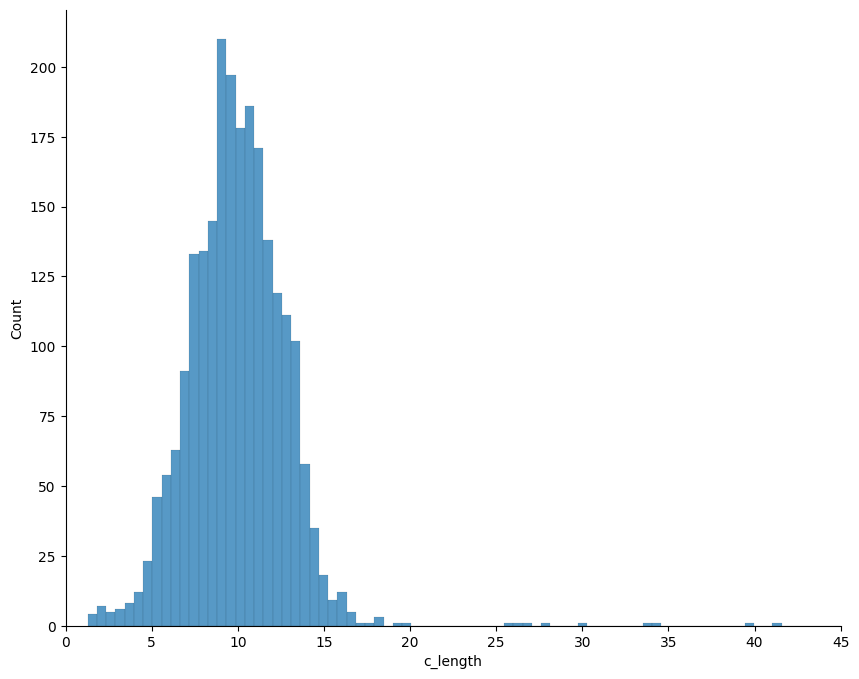

In [19]:
plt.figure(figsize=(10,8))
sns.histplot(data=test_nandf, x='c_length')
plt.xlim(0,45)
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/NCB021423/cricketsizes.pdf')

In [20]:
cricket_sizes=test_nandf[['filename','condition', 'laser_value','c_length', 'capduration']]
cricket_sizes

,filename,condition,laser_value,c_length,capduration
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,5.44500,NaN
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,4.10750,37.400
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,259.39575,NaN
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,47.50325,NaN
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,NaN,39.82925,NaN
...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,9.36850,15.620
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,10.74700,0.500
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,10.24200,0.020
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,7.58625,NaN


In [21]:
cricket_sizes.groupby(['condition', 'laser_value']).mean()

c_length  capduration
condition  laser_value                        
1          0.0          12.212932    11.316780
           1.0          14.995685    11.259350
2          0.0           9.625181    13.753000
           1.0           9.502850    10.896673
3          0.0           9.953624     5.710225
           1.0          10.395467     7.050133
4          0.0           9.061239     8.055704
           1.0          10.165933     7.456528
5          0.0           8.708833    19.801875
           1.0          52.811786    16.851250
6          0.0           6.175031    57.066667
7          0.0           2.093000          NaN
8          0.0           6.804650    62.410000
baseline_d 0.0           9.865330    16.084952
baseline_l 0.0          10.892346    18.947528
test       0.0           9.596919    30.619844

In [22]:
cricket_sizes.groupby(['condition', 'laser_value']).median()

c_length  capduration
condition  laser_value                        
1          0.0          10.353500       5.9825
           1.0          10.352625       5.9200
2          0.0           9.562875       4.4550
           1.0           9.396750       4.1150
3          0.0           9.874500       3.2900
           1.0           9.441500       5.3600
4          0.0           9.428250       3.2750
           1.0          10.433250       2.6550
5          0.0           6.296750      13.2750
           1.0          12.117000      14.7975
6          0.0           5.411250      73.4800
7          0.0           2.093000          NaN
8          0.0           6.392000      62.4100
baseline_d 0.0           9.992250       5.0100
baseline_l 0.0          10.615500      11.9550
test       0.0           9.753500      20.2125

In [23]:
np.nanmedian(cricket_sizes['c_length'])

9.93650000000001

In [24]:
np.min(cricket_sizes['c_length'])

1.2704999999999984

In [25]:
np.max(cricket_sizes['c_length'])

504.80600000000004

In [26]:
np.quantile(cricket_sizes['c_length'], 0.25)

8.235687499999923

In [27]:
np.quantile(cricket_sizes['c_length'], 0.5)

9.93650000000001

In [28]:
np.quantile(cricket_sizes['c_length'], 0.75)

11.798062499999993

In [22]:
small=pd.DataFrame()
med=pd.DataFrame()
large=pd.DataFrame()
indices=np.asarray(cricket_sizes.index)
for i in indices:
    if cricket_sizes['c_length'][i]<=8:
        new_row_small=cricket_sizes.loc[i]
        small=pd.concat([small,new_row_small.to_frame().T], ignore_index=True)
    if 8 < cricket_sizes['c_length'][i] <11:
        new_row_med=cricket_sizes.loc[i]
        med=pd.concat([med, new_row_med.to_frame().T], ignore_index=True)
    if cricket_sizes['c_length'][i]>11:
        new_row_large=cricket_sizes.loc[i]
        large=pd.concat([large, new_row_large.to_frame().T], ignore_index=True)

In [23]:
small

,filename,condition,laser_value,c_length,capduration
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,5.445,NaN
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,4.1075,37.4
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,1.0,7.2105,NaN
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,0.0,6.52825,NaN
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,1.0,5.932,13.355
...,...,...,...,...,...
510,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,7.6045,6.565
511,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,6.13,0.0
512,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,7.86725,21.515
513,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,7.8055,0.06


In [31]:
med

,filename,condition,laser_value,c_length,capduration
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,NaN,1.0,8.2325,NaN
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,10.866,4.085
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,10.91475,13.415
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,10.8725,17.51
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,baseline_l,0.0,10.9865,0.8
...,...,...,...,...,...
1005,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,8.9935,57.52
1006,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,9.3685,15.62
1007,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,10.747,0.5
1008,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,10.242,0.02


In [32]:
large

,filename,condition,laser_value,c_length,capduration
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,259.39575,NaN
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,47.50325,NaN
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,NaN,39.82925,NaN
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,NaN,33.8115,NaN
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,NaN,216.174,NaN
...,...,...,...,...,...
798,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,11.4455,5.0
799,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,11.35975,1.89
800,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,13.95,2.31
801,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,11.8755,32.28


In [41]:
hue_order=[1,0]
palette=['#2976bb','#929591']

In [42]:
conds_keep=test_nandf[test_nandf['condition'].str.contains('1|2', na=False)]
conds_keep

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps
132,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-01-12_mouse-0897,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[3.3915335337713834, 4.112710047534249, 4.4735...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",8.070,1082.0,...,0.116505,1.425,1.000000,0.500000,5.715,1143.0,12.67000,2.355,NaN,2022-02-15 10:01:12
133,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-21-03_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.116034346853949, 1.7375403061752268, 1.5469...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.425,1299.0,...,0.135166,1.150,1.000000,0.333333,2.450,490.0,9.13875,3.975,NaN,2022-02-15 10:21:03
134,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-23-08_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.46552343160596676, 0.6386597255830513, 0.81...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",21.990,1029.0,...,0.166412,5.025,0.500000,0.333333,16.445,3289.0,12.04850,5.545,NaN,2022-02-15 10:23:08
135,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-25-25_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.3773388261534625, 2.8636927702651525, 3.231...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",21.860,1170.0,...,0.163778,15.225,0.666667,0.250000,18.140,3628.0,12.87850,3.720,NaN,2022-02-15 10:25:25
136,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-27-44_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7796982153955331, 0.8504793853925431, 1.046...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.940,1090.0,...,0.165798,0.075,0.428571,0.333333,0.755,151.0,13.93075,22.185,NaN,2022-02-15 10:27:44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,...,0.141276,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only,2023-01-29 13:25:16
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,...,0.197472,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only,2023-01-29 13:27:15
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,...,0.040080,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only,2023-01-29 13:29:34
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,...,0.163335,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only,2023-01-29 13:30:57


In [43]:
df0893=conds_keep[conds_keep['filename'].str.contains('0893')]
df0895=conds_keep[conds_keep['filename'].str.contains('0895')]
df0896=conds_keep[conds_keep['filename'].str.contains('0896')]
df0897=conds_keep[conds_keep['filename'].str.contains('0897')]
df0898=conds_keep[conds_keep['filename'].str.contains('0898')]
df1337=conds_keep[conds_keep['filename'].str.contains('1337')]
df1429=conds_keep[conds_keep['filename'].str.contains('1429')]
df1430=conds_keep[conds_keep['filename'].str.contains('1430')]

In [27]:
light_trials=conds_keep[conds_keep['condition'].str.contains('1', na=False)]
light_trials

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps
132,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-01-12_mouse-0897,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[3.3915335337713834, 4.112710047534249, 4.4735...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",8.070,1082.0,...,0.116505,1.425,1.000000,0.500000,5.715,1143.0,12.67000,2.355,NaN,2022-02-15 10:01:12
133,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-21-03_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.116034346853949, 1.7375403061752268, 1.5469...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.425,1299.0,...,0.135166,1.150,1.000000,0.333333,2.450,490.0,9.13875,3.975,NaN,2022-02-15 10:21:03
134,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-23-08_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.46552343160596676, 0.6386597255830513, 0.81...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",21.990,1029.0,...,0.166412,5.025,0.500000,0.333333,16.445,3289.0,12.04850,5.545,NaN,2022-02-15 10:23:08
135,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-25-25_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.3773388261534625, 2.8636927702651525, 3.231...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",21.860,1170.0,...,0.163778,15.225,0.666667,0.250000,18.140,3628.0,12.87850,3.720,NaN,2022-02-15 10:25:25
136,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-27-44_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7796982153955331, 0.8504793853925431, 1.046...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.940,1090.0,...,0.165798,0.075,0.428571,0.333333,0.755,151.0,13.93075,22.185,NaN,2022-02-15 10:27:44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2211,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-22_12-47-18_mouse-1429,1,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[3.471336482836043, 4.014320371340666, 4.09772...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",14.525,1566.0,...,0.259740,0.410,0.625000,0.200000,5.250,1050.0,10.51850,9.275,left_only,2023-01-22 12:47:18
2212,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-22_12-48-58_mouse-1429,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.2154560820554363, 2.741399640998769, 2.8346...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",14.750,1415.0,...,0.263244,0.120,0.714286,0.200000,0.975,195.0,9.74475,13.775,left_only,2023-01-22 12:48:58
2213,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-22_12-51-19_mouse-1429,1,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.9322948957073083, 2.4126059181912614, 3.172...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",9.055,2724.0,...,0.029442,8.495,1.000000,1.000000,9.045,1809.0,15.68650,0.010,left_only,2023-01-22 12:51:19
2216,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-22_9-53-28_mouse-1337,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7604925598423619, 1.6177873049152376, 2.574...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",106.055,1811.0,...,0.160946,0.045,0.500000,0.100000,31.880,6376.0,11.17400,74.175,left_only,2023-01-22 09:53:28


In [28]:
dark_trials=conds_keep[conds_keep['condition'].str.contains('2', na=False)]
dark_trials

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps
224,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-21_10-30-29_mouse-0898,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[10.837960471200734, 13.404780068433766, 18.34...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.930,1104.0,...,0.092721,3.170,1.000000,0.500000,4.360,872.0,14.84375,2.570,NaN,2022-02-21 10:30:29
225,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-21_10-32-07_mouse-0898,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[7.7393501890295315, 11.564647490846076, 14.32...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",4.630,1363.0,...,0.108372,0.375,0.500000,1.000000,4.600,920.0,12.05100,0.030,NaN,2022-02-21 10:32:08
226,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-21_10-33-48_mouse-0898,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.843482503384074, 10.900127132381272, 13.111...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",3.080,1053.0,...,0.064851,1.270,1.000000,1.000000,2.410,482.0,8.20275,0.670,NaN,2022-02-21 10:33:48
227,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-21_10-35-44_mouse-0898,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[3.3516883015303236, 3.6191210652312975, 4.229...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",7.525,1223.0,...,0.053533,2.435,1.000000,1.000000,5.340,1068.0,8.45250,2.185,NaN,2022-02-21 10:35:44
228,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-21_10-37-24_mouse-0898,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.296620271959234, 2.572114249263568, 2.59495...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.110,1324.0,...,0.095511,1.425,1.000000,0.500000,4.800,960.0,7.45550,1.310,NaN,2022-02-21 10:37:24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,...,0.141276,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only,2023-01-29 13:25:16
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,...,0.197472,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only,2023-01-29 13:27:15
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,...,0.040080,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only,2023-01-29 13:29:34
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,...,0.163335,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only,2023-01-29 13:30:57


In [30]:
cleaned_conds_keep=conds_keep[conds_keep['filename'].str.contains('0893|0895|0896|0897|0898|1429|1430')]
cleaned_conds_keep

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps
132,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-01-12_mouse-0897,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[3.3915335337713834, 4.112710047534249, 4.4735...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",8.070,1082.0,...,0.116505,1.425,1.000000,0.500000,5.715,1143.0,12.67000,2.355,NaN,2022-02-15 10:01:12
133,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-21-03_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.116034346853949, 1.7375403061752268, 1.5469...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.425,1299.0,...,0.135166,1.150,1.000000,0.333333,2.450,490.0,9.13875,3.975,NaN,2022-02-15 10:21:03
134,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-23-08_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.46552343160596676, 0.6386597255830513, 0.81...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",21.990,1029.0,...,0.166412,5.025,0.500000,0.333333,16.445,3289.0,12.04850,5.545,NaN,2022-02-15 10:23:08
135,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-25-25_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.3773388261534625, 2.8636927702651525, 3.231...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",21.860,1170.0,...,0.163778,15.225,0.666667,0.250000,18.140,3628.0,12.87850,3.720,NaN,2022-02-15 10:25:25
136,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-15_10-27-44_mouse-0898,1,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7796982153955331, 0.8504793853925431, 1.046...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.940,1090.0,...,0.165798,0.075,0.428571,0.333333,0.755,151.0,13.93075,22.185,NaN,2022-02-15 10:27:44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,...,0.141276,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only,2023-01-29 13:25:16
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,...,0.197472,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only,2023-01-29 13:27:15
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,...,0.040080,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only,2023-01-29 13:29:34
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,...,0.163335,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only,2023-01-29 13:30:57


In [167]:
small=pd.DataFrame()
med=pd.DataFrame()
large=pd.DataFrame()
indices=np.asarray(conds_keep.index)
for i in indices:
    if conds_keep['c_length'][i]<=8:
        new_row_small=conds_keep.loc[i]
        small=pd.concat([small,new_row_small.to_frame().T], ignore_index=True)
    if 8 < conds_keep['c_length'][i] <11:
        new_row_med=conds_keep.loc[i]
        med=pd.concat([med, new_row_med.to_frame().T], ignore_index=True)
    if conds_keep['c_length'][i]>11:
        new_row_large=conds_keep.loc[i]
        large=pd.concat([large, new_row_large.to_frame().T], ignore_index=True)

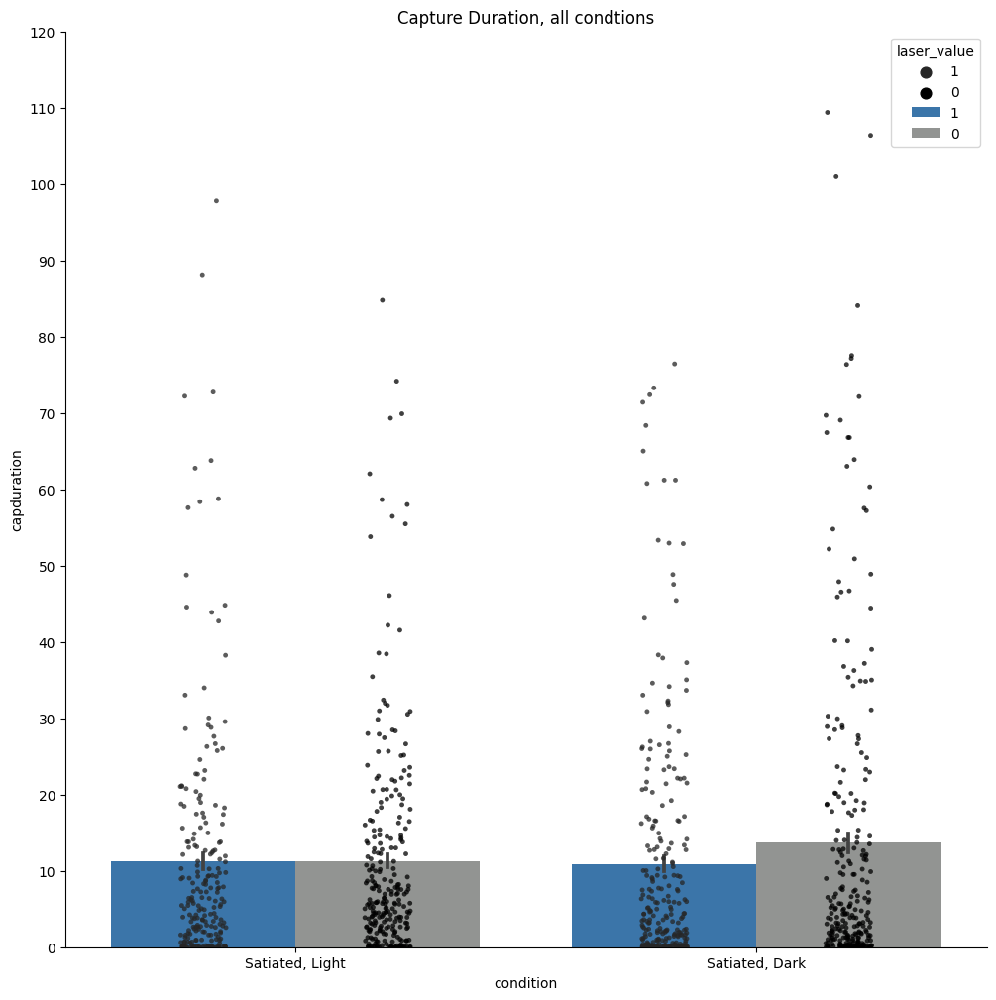

In [67]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/draft_paper_figs/capduration_allmice24.pdf')

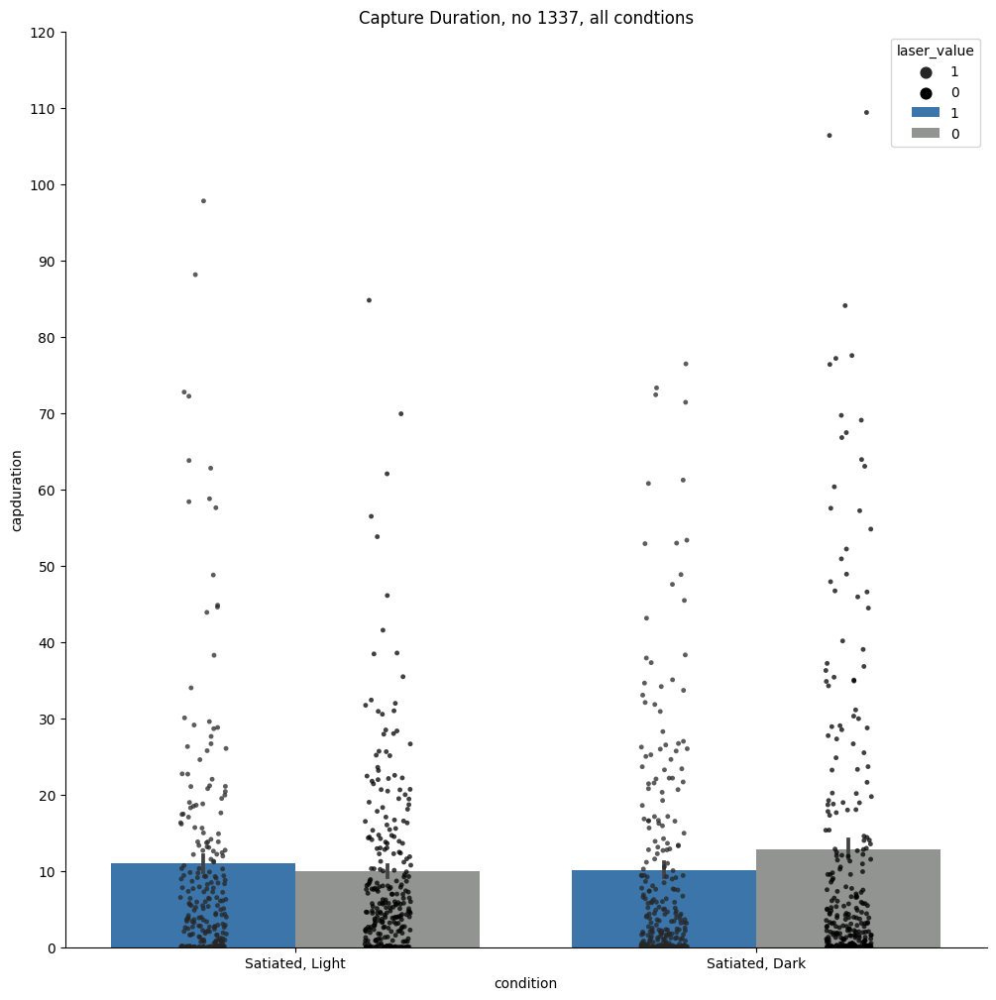

In [32]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=cleaned_conds_keep, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=cleaned_conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, no 1337, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()

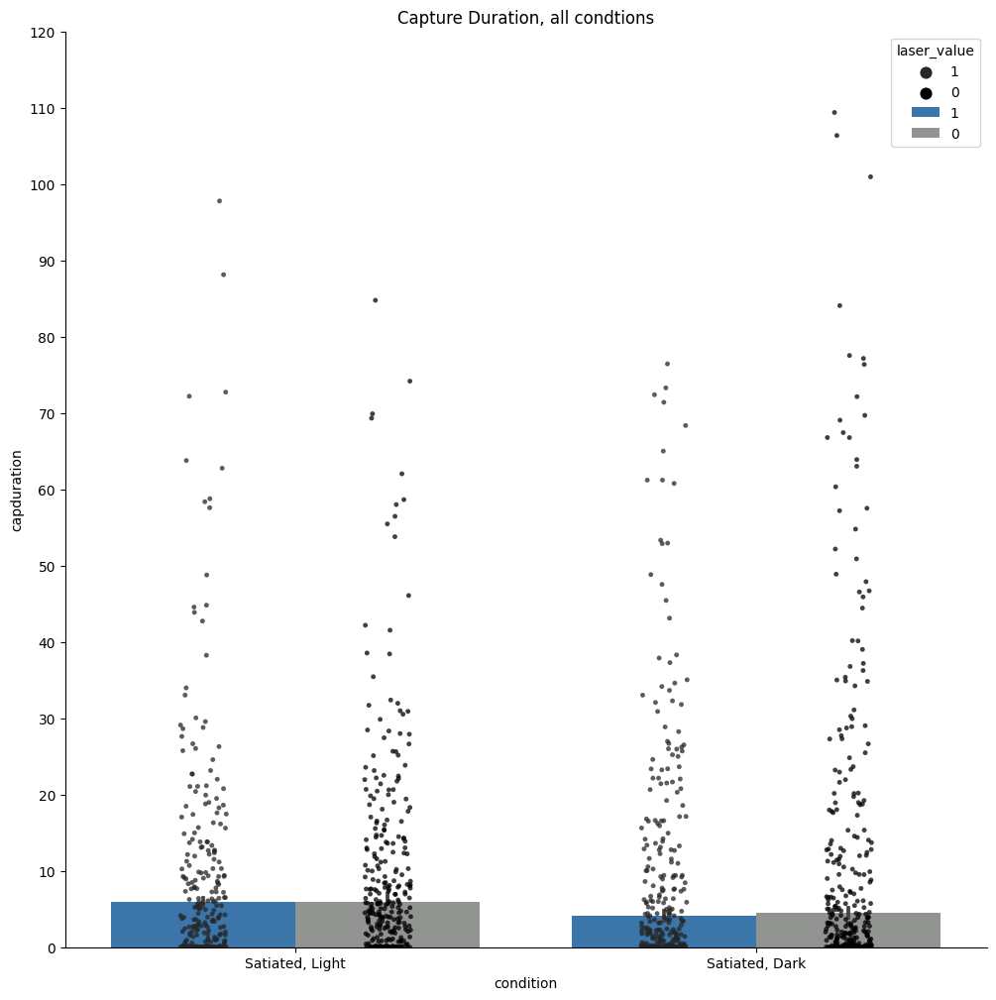

In [38]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order, estimator=np.median)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/draft_paper_figs/med_capduration_allmice.pdf')

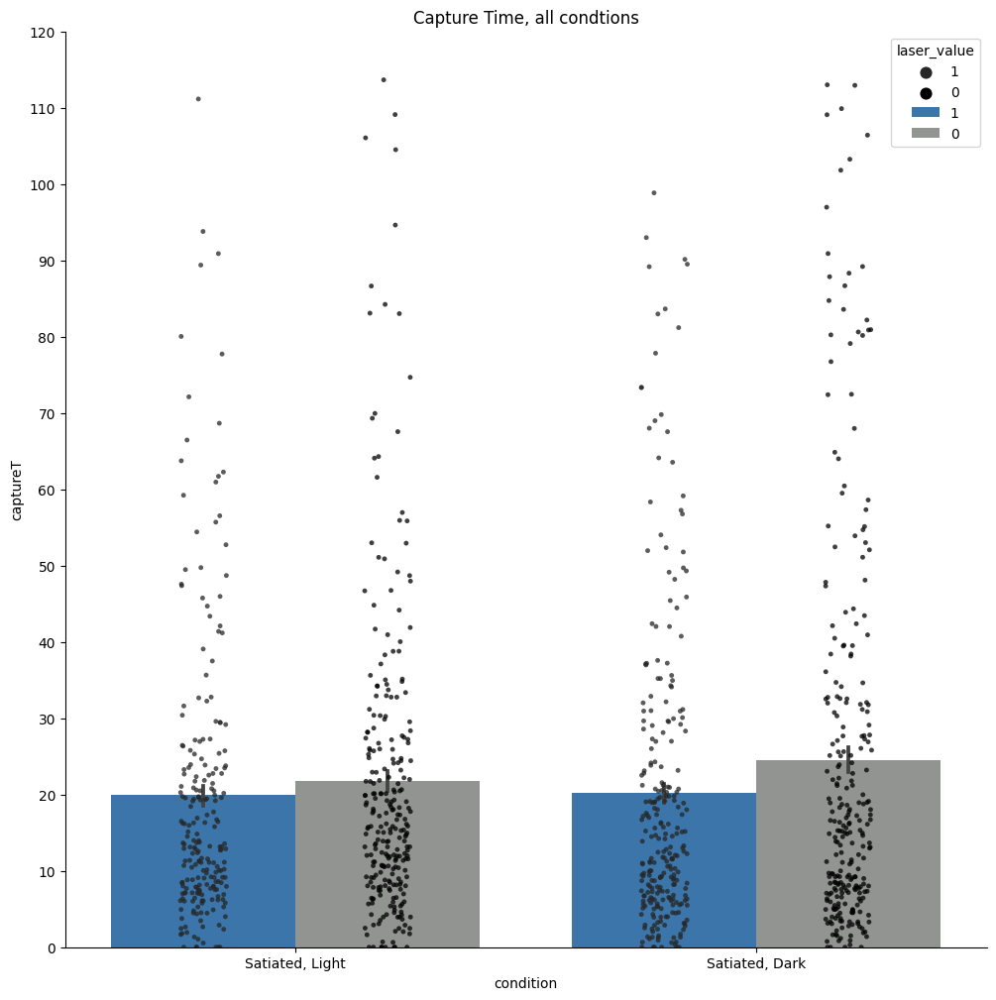

In [68]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='captureT', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='captureT', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Time, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/draft_paper_figs/captime_allmice24.pdf')

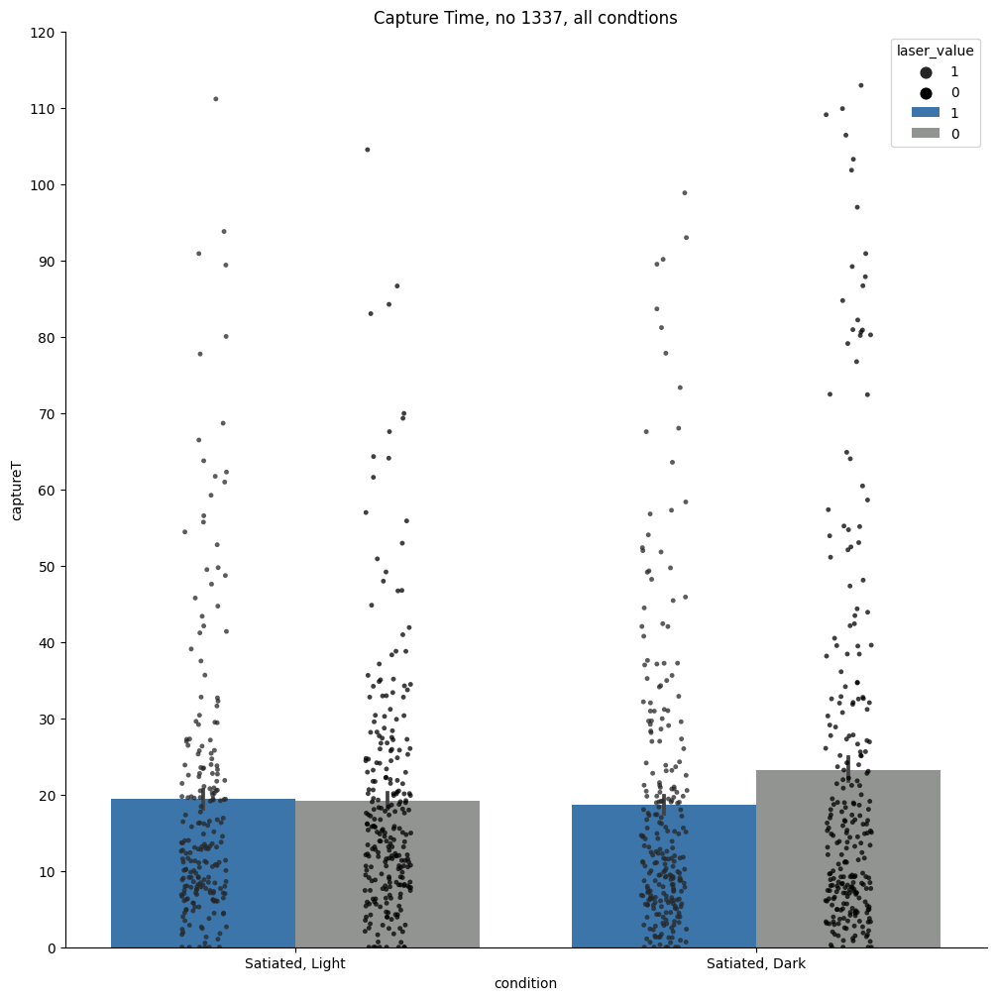

In [34]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=cleaned_conds_keep, x='condition', y='captureT', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='captureT', hue='laser_value',dodge=True, data=cleaned_conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Time, no 1337, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()

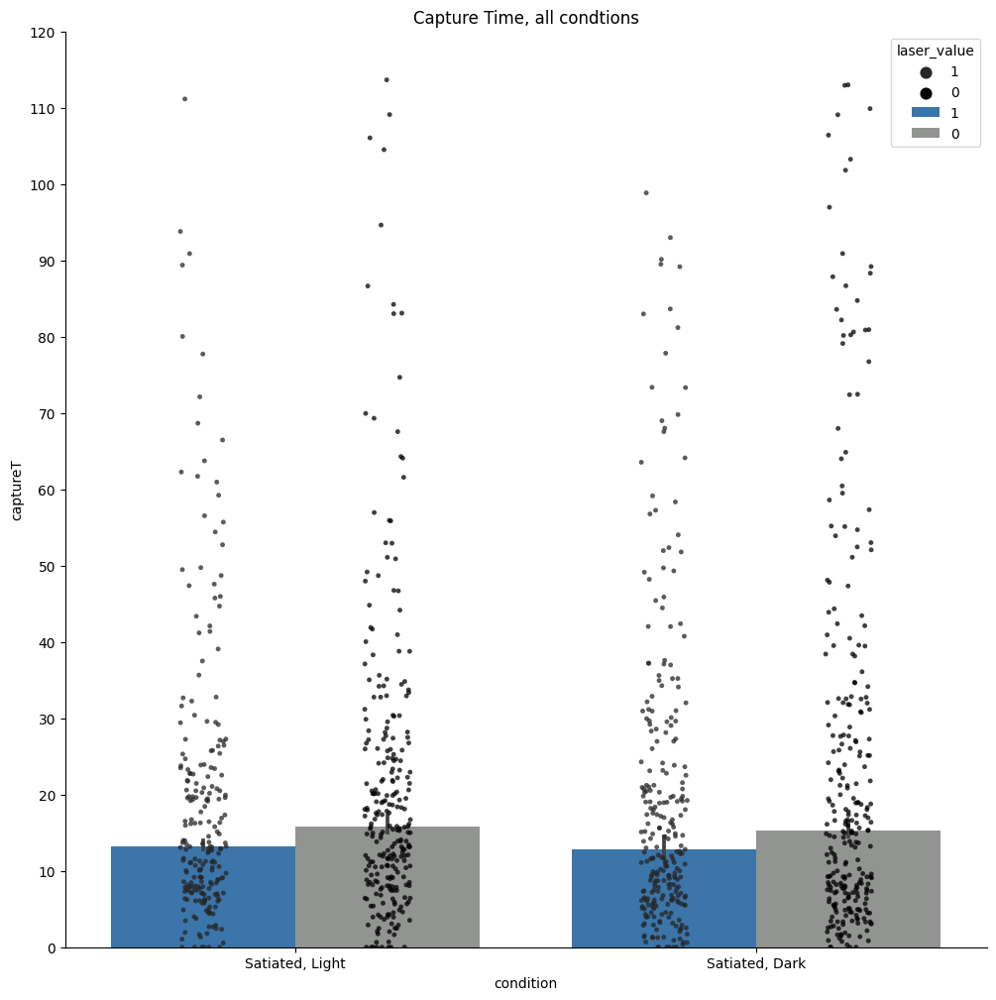

In [43]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='captureT', hue='laser_value', ci=68, palette=palette, hue_order=hue_order, estimator=np.median)
ax= sns.stripplot(x='condition', y='captureT', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Time, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/draft_paper_figs/med_captureT_allmice.pdf')

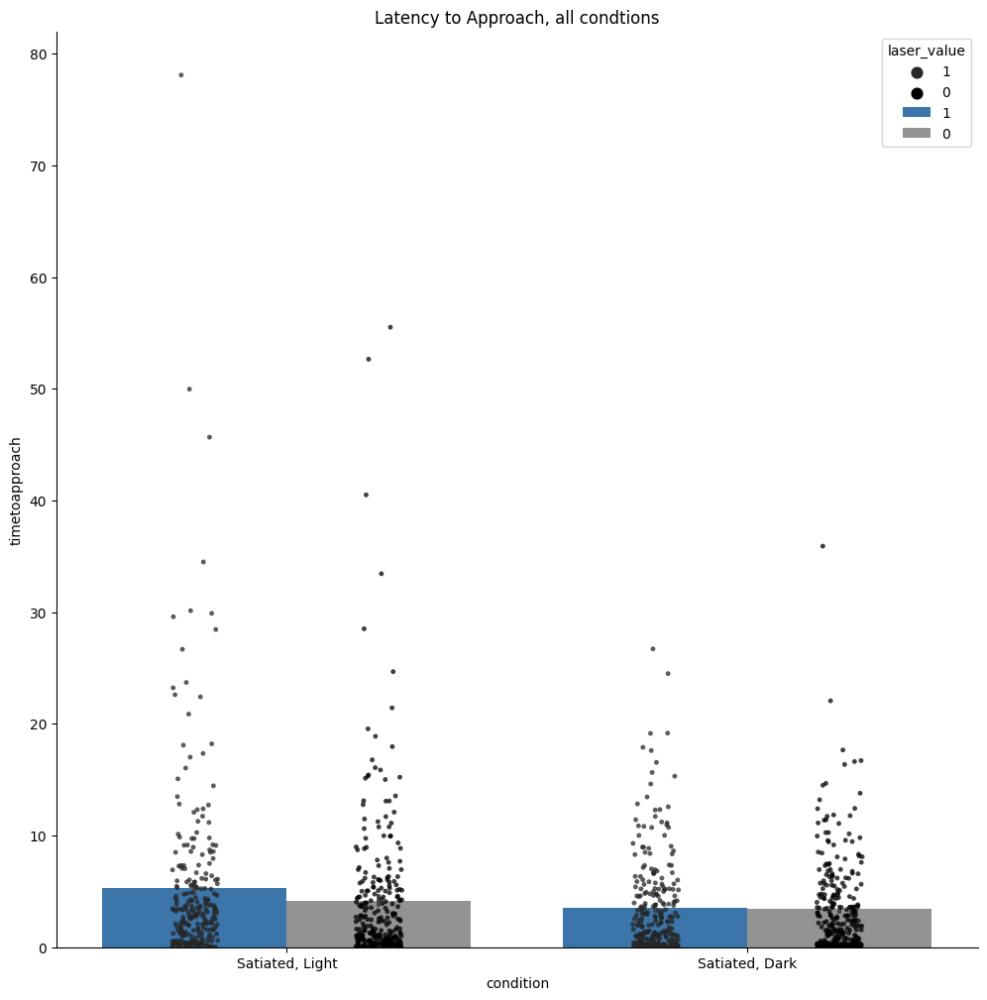

In [46]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='timetoapproach', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='timetoapproach', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Latency to Approach, all condtions')
# plt.ylim(0,120)
# plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/draft_paper_figs/approachlatency_allmice.pdf')

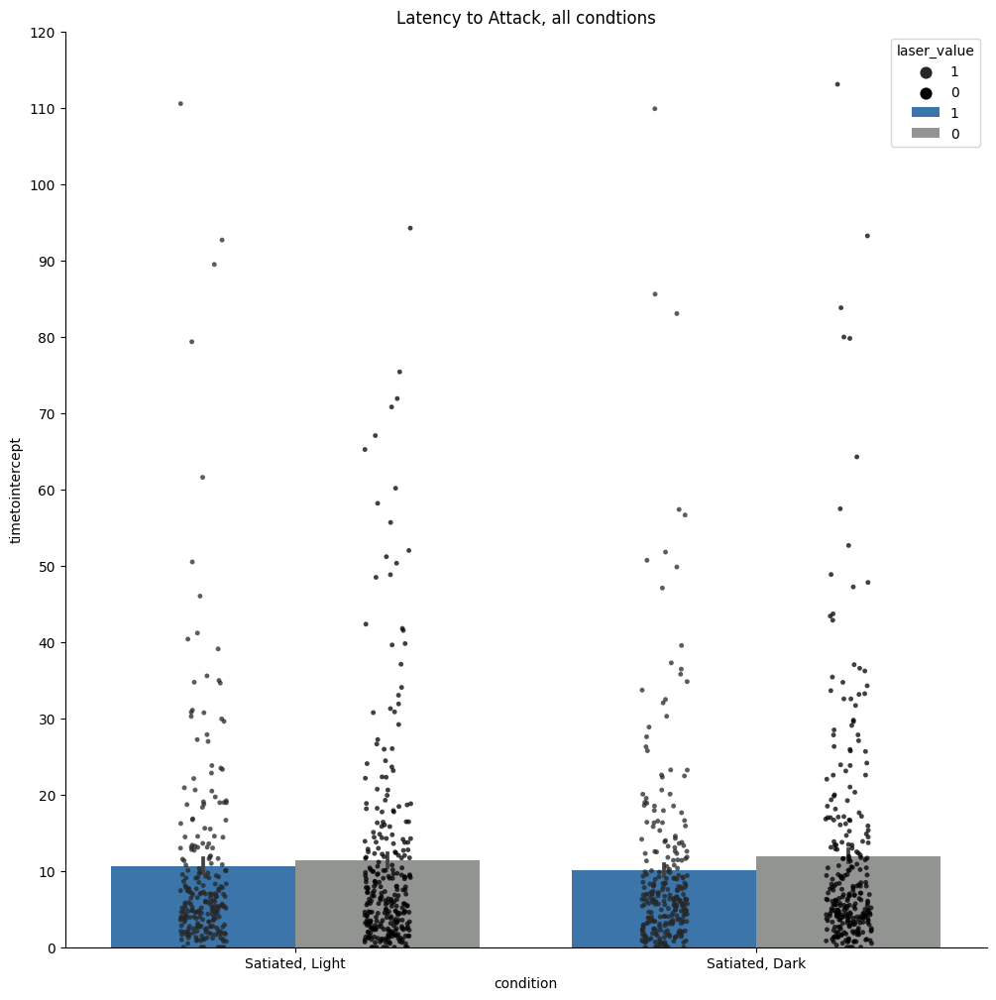

In [169]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='timetointercept', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='timetointercept', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Latency to Attack, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/draft_paper_figs/attacklatency_allmice.pdf')

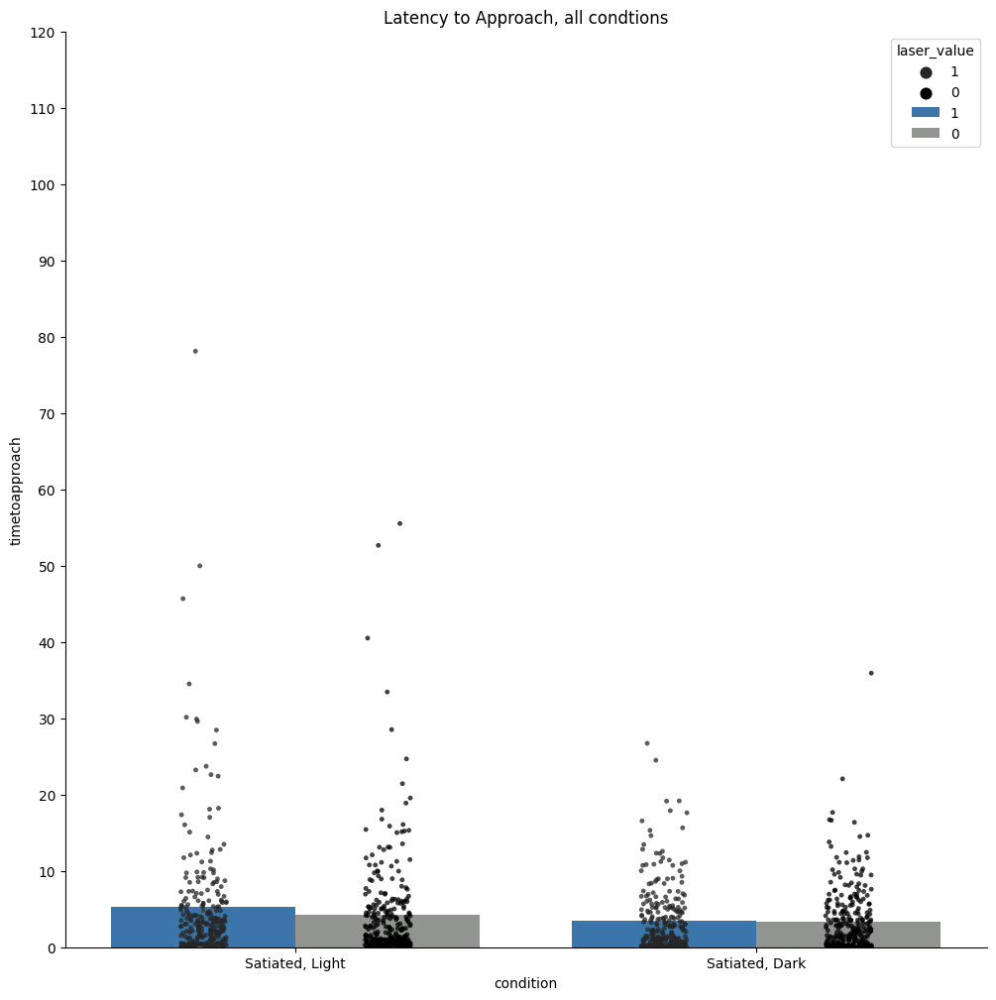

In [170]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='timetoapproach', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='timetoapproach', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Latency to Approach, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light', 'Satiated, Dark'])
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/draft_paper_figs/attacklatency_allmice.pdf')

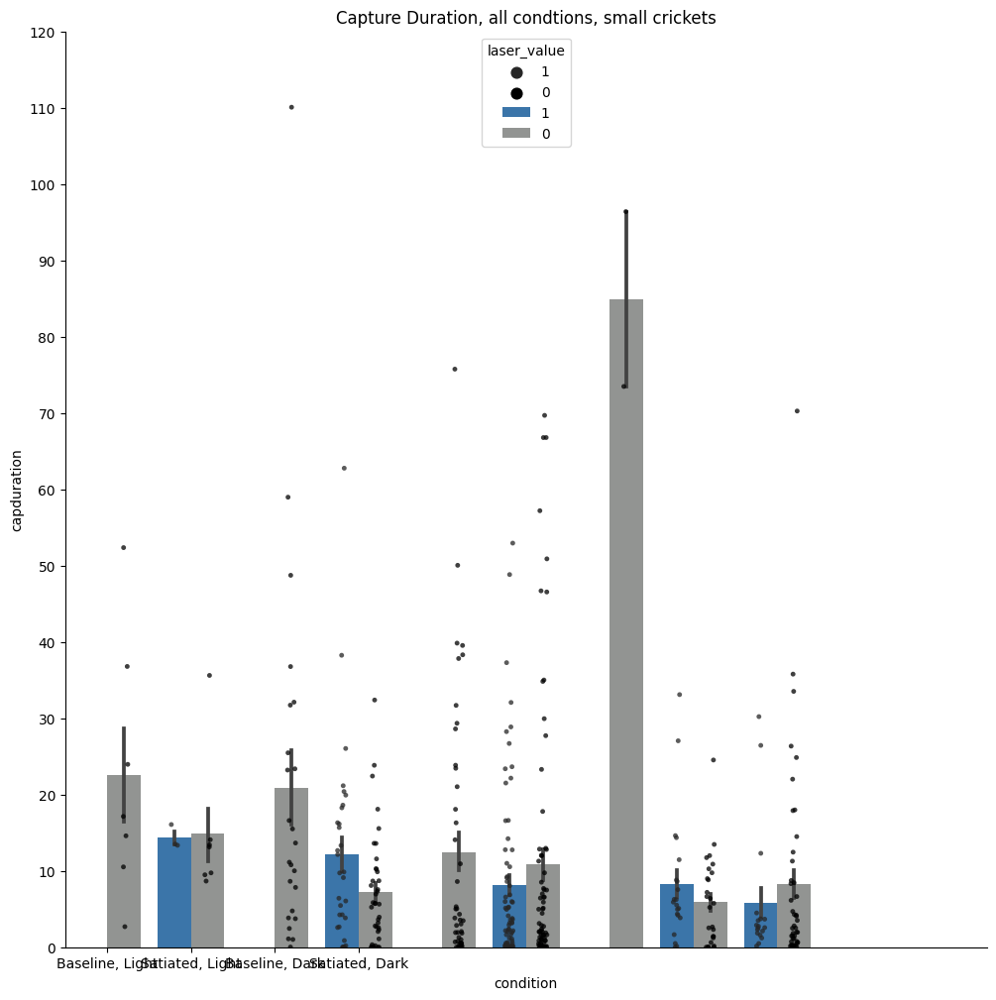

In [45]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=small, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=small, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions, small crickets')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Satiated, Light', 'Baseline, Dark', 'Satiated, Dark'])
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_allmice_small.pdf')

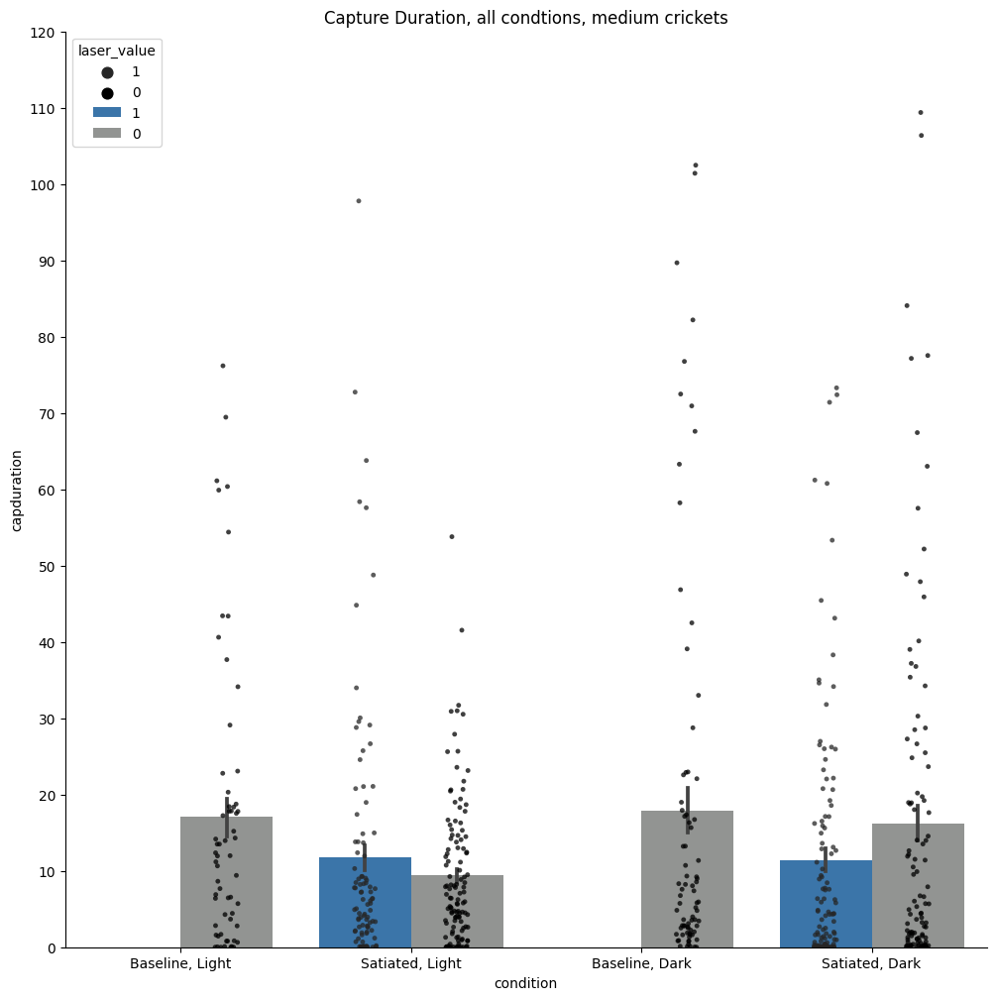

In [260]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=med, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=med, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions, medium crickets')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Satiated, Light', 'Baseline, Dark', 'Satiated, Dark'])
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_allmice_med.pdf')

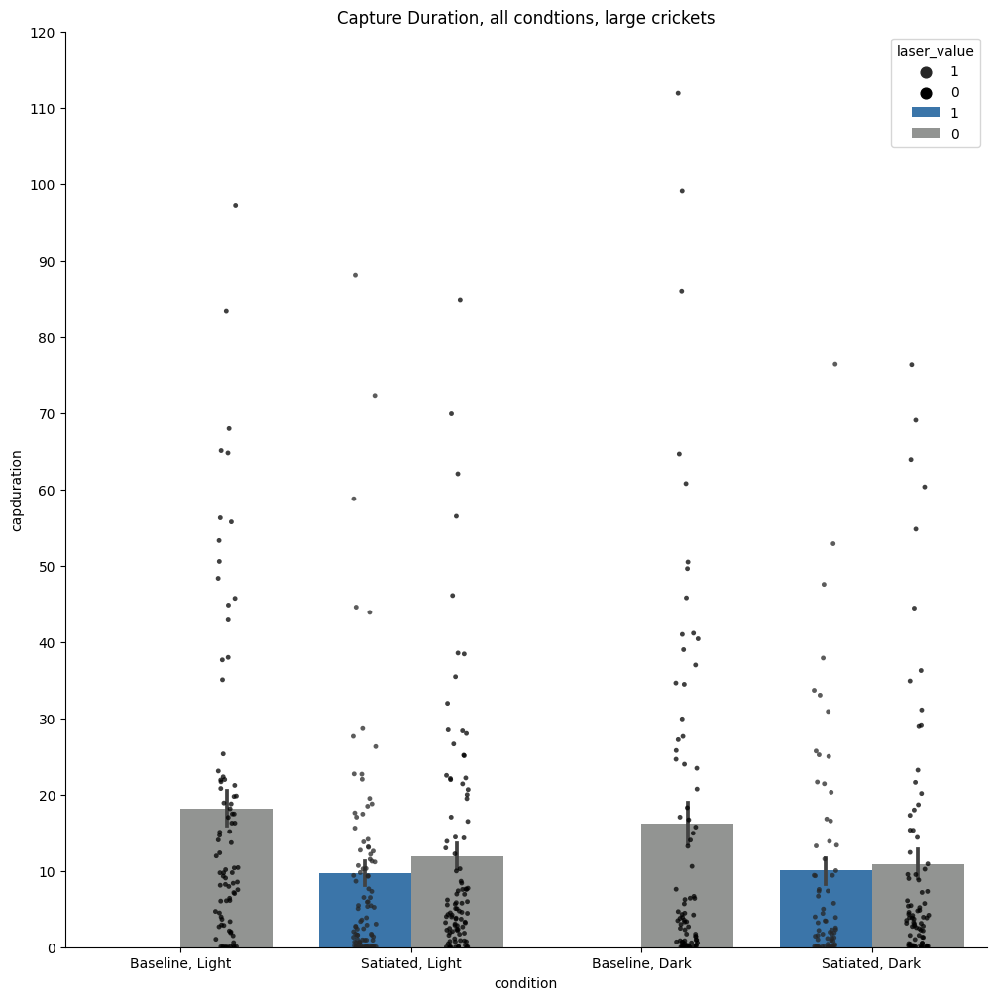

In [261]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=large, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=large, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions, large crickets')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Satiated, Light', 'Baseline, Dark', 'Satiated, Dark'])
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_allmice_large.pdf')

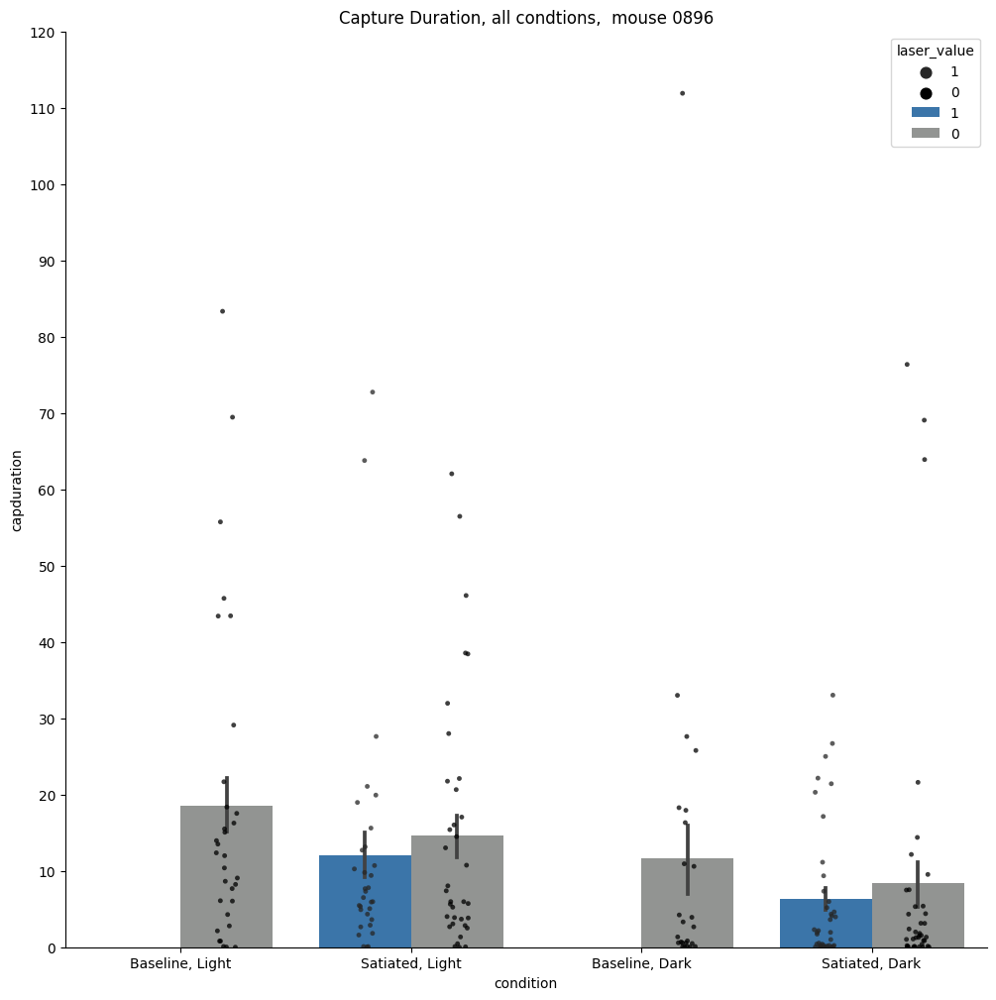

In [193]:
df0896=conds_keep[conds_keep['filename'].str.contains('0896')]
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df0896, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=df0896, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions,  mouse 0896')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Satiated, Light', 'Baseline, Dark', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_0896.pdf')

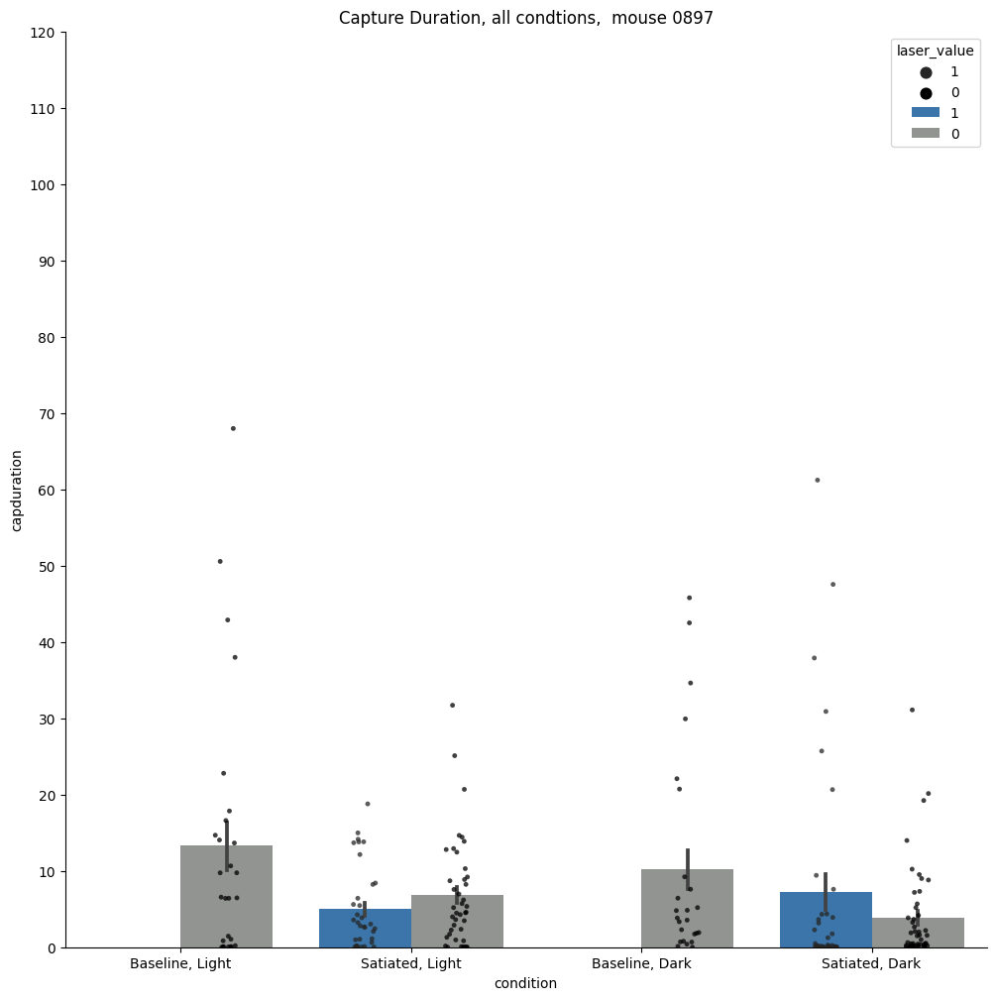

In [194]:
df0897=conds_keep[conds_keep['filename'].str.contains('0897')]
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df0897, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=df0897, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions,  mouse 0897')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Satiated, Light', 'Baseline, Dark', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_0897.pdf')

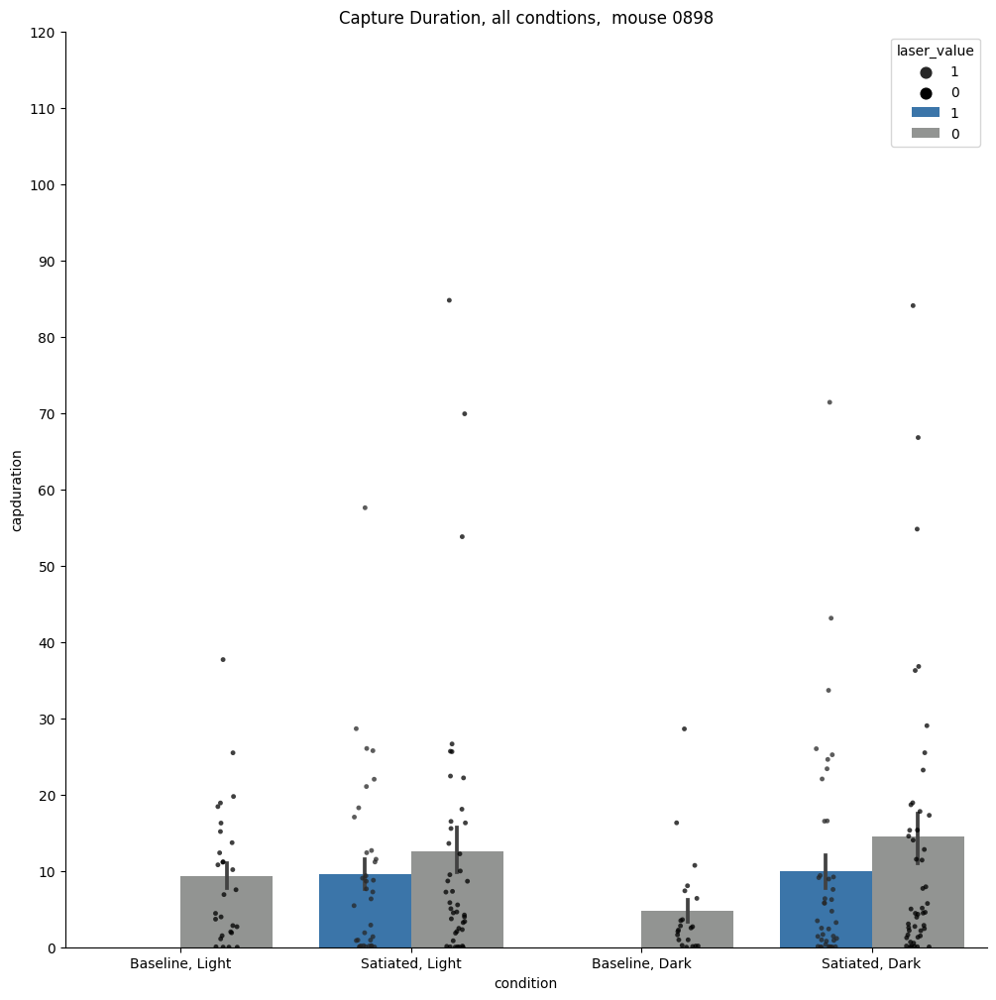

In [195]:
df0898=conds_keep[conds_keep['filename'].str.contains('0898')]
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df0898, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=df0898, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions,  mouse 0898')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Satiated, Light', 'Baseline, Dark', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_0898.pdf')

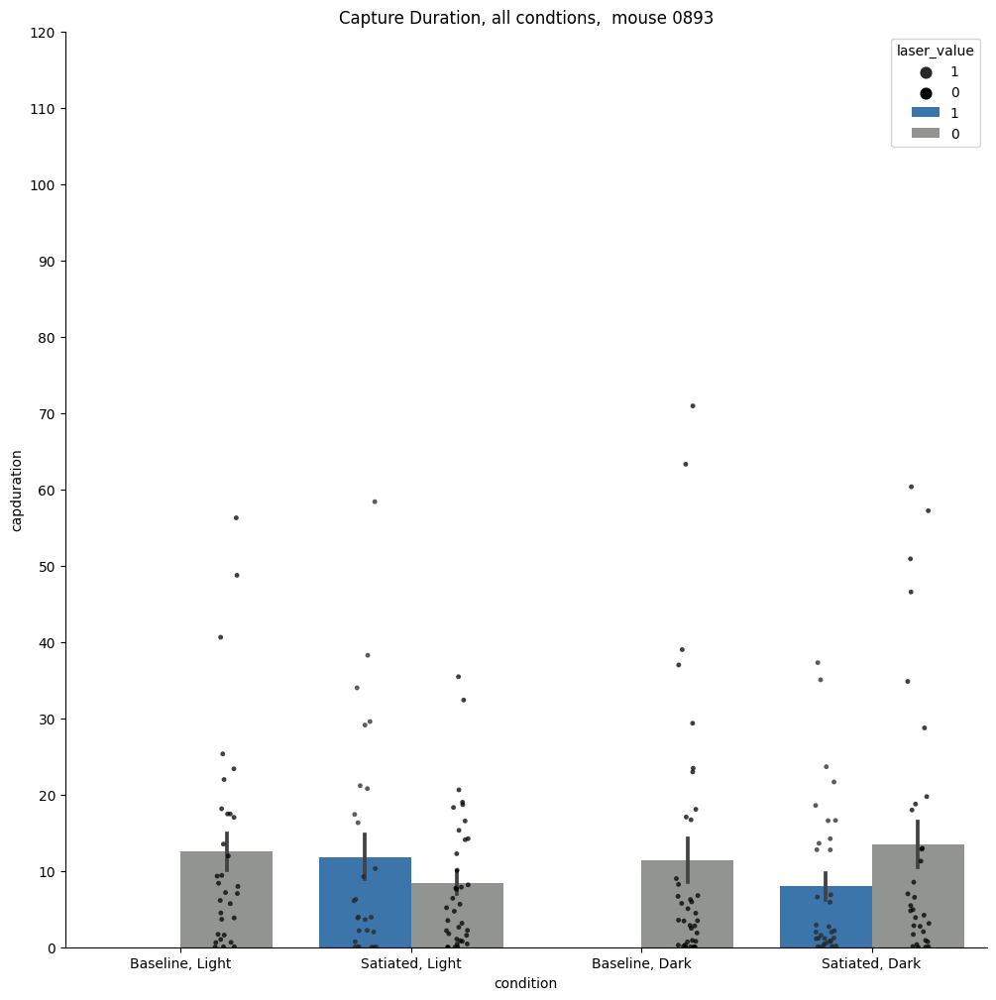

In [196]:
df0893=conds_keep[conds_keep['filename'].str.contains('0893')]
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df0893, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=df0893, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions,  mouse 0893')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Satiated, Light', 'Baseline, Dark', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_0893.pdf')

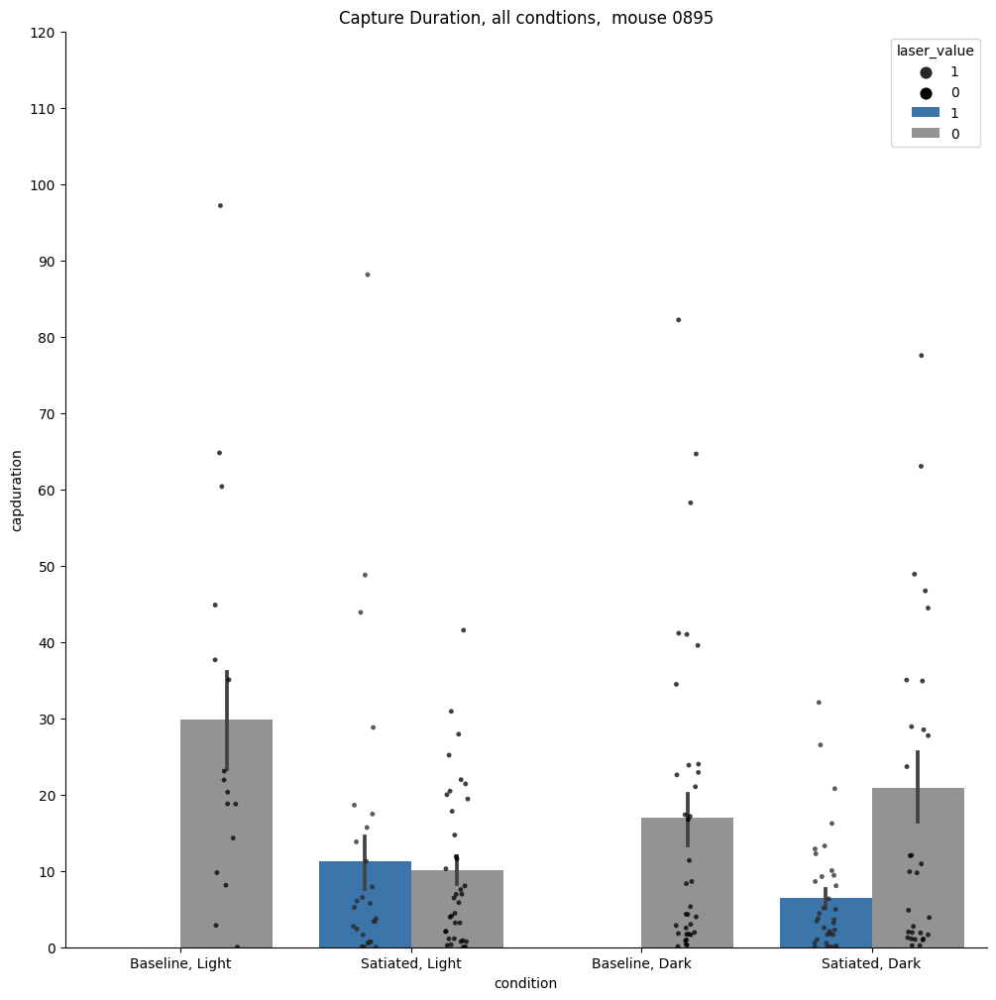

In [197]:
df0895=conds_keep[conds_keep['filename'].str.contains('0895')]
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df0895, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=df0895, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions,  mouse 0895')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Satiated, Light', 'Baseline, Dark', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_0895.pdf')

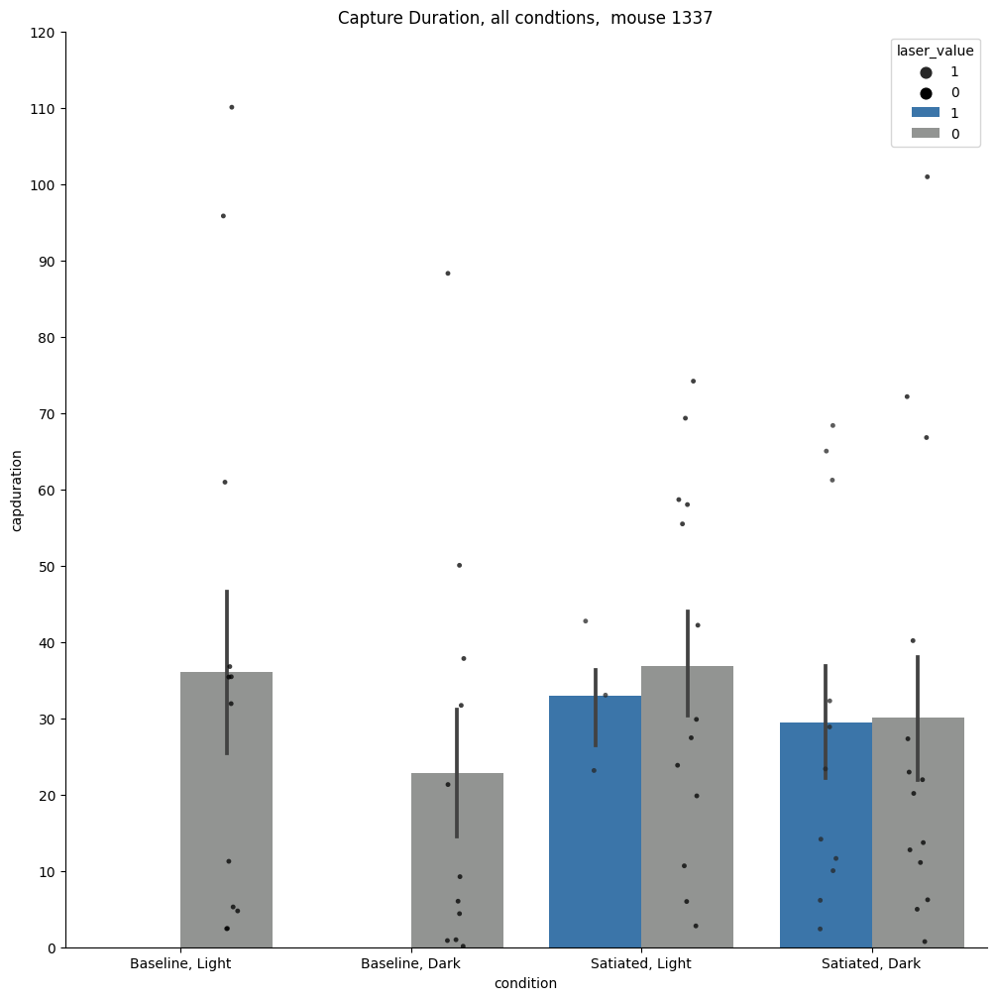

In [198]:
df1337=conds_keep[conds_keep['filename'].str.contains('1337')]
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df1337, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=df1337, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions,  mouse 1337')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Baseline, Dark', 'Satiated, Light', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_1337.pdf')

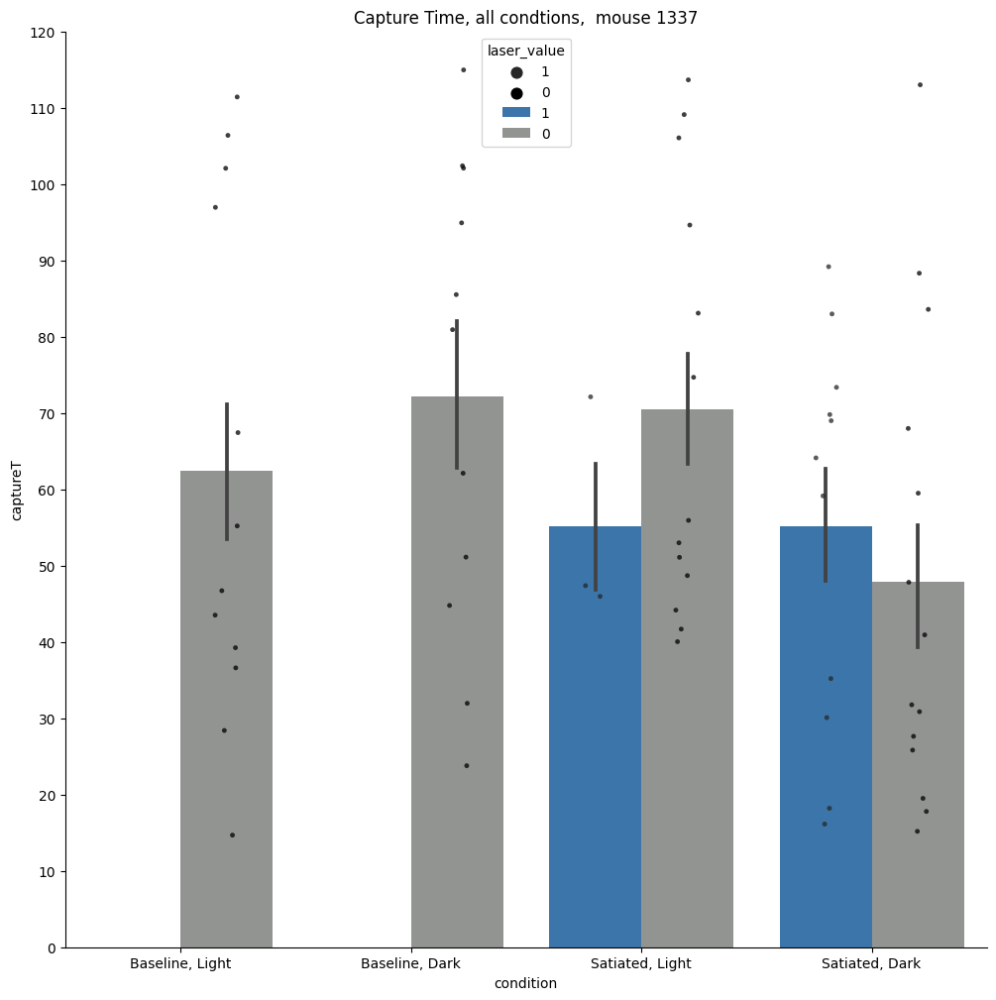

In [203]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df1337, x='condition', y='captureT', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='captureT', hue='laser_value',dodge=True, data=df1337, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Time, all condtions,  mouse 1337')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Baseline, Dark', 'Satiated, Light', 'Satiated, Dark'])
sns.despine()

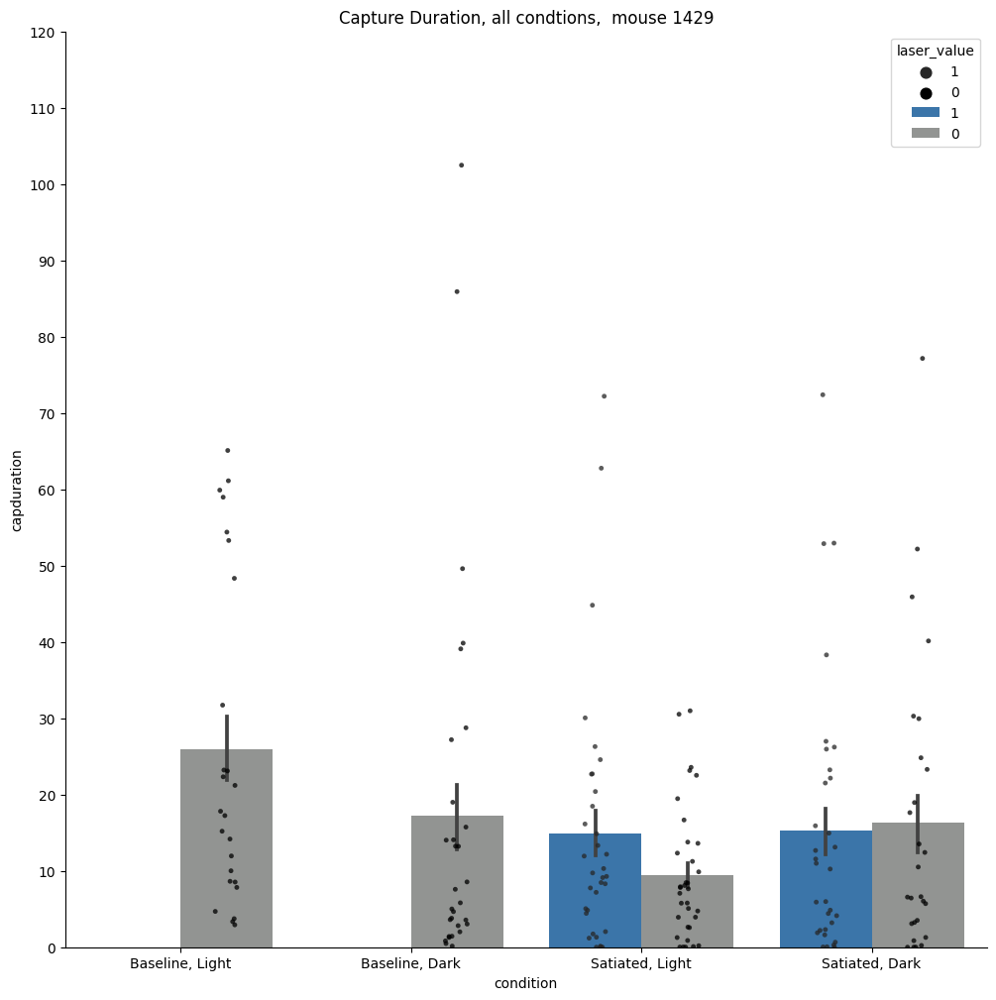

In [199]:
df1429=conds_keep[conds_keep['filename'].str.contains('1429')]
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df1429, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=df1429, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions,  mouse 1429')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Baseline, Dark', 'Satiated, Light', 'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_1429.pdf')

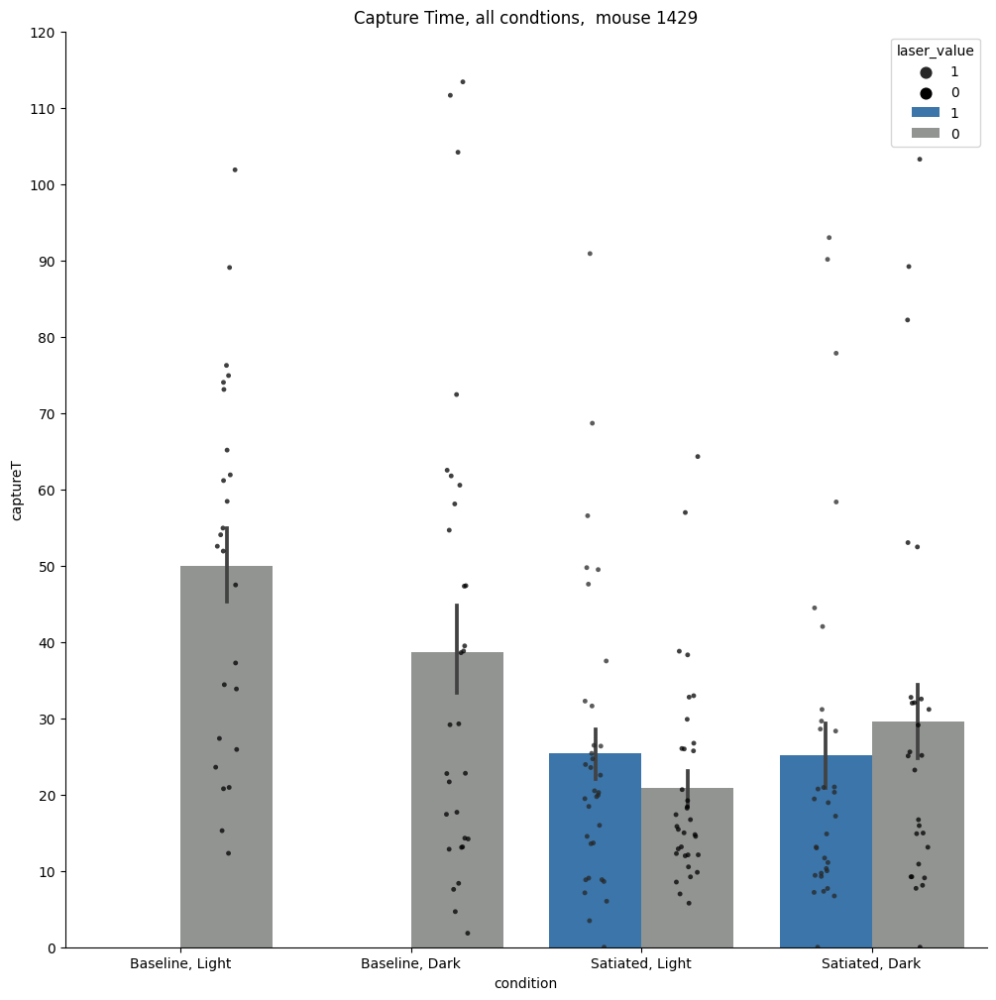

In [202]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df1429, x='condition', y='captureT', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='captureT', hue='laser_value',dodge=True, data=df1429, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Time, all condtions,  mouse 1429')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Baseline, Dark', 'Satiated, Light', 'Satiated, Dark'])
sns.despine()

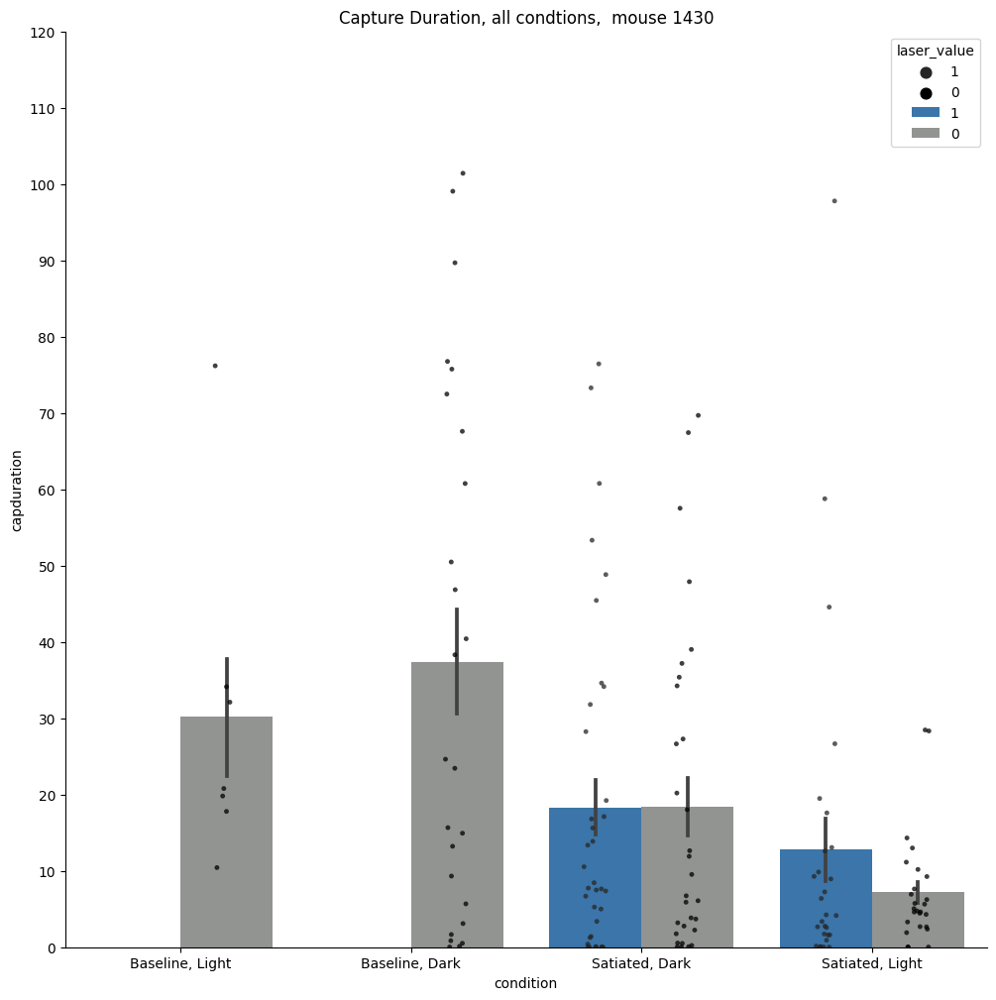

In [200]:
df1430=conds_keep[conds_keep['filename'].str.contains('1430')]
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df1430, x='condition', y='capduration', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='capduration', hue='laser_value',dodge=True, data=df1430, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Duration, all condtions,  mouse 1430')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Baseline, Dark', 'Satiated, Dark', 'Satiated, Light'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_1430.pdf')

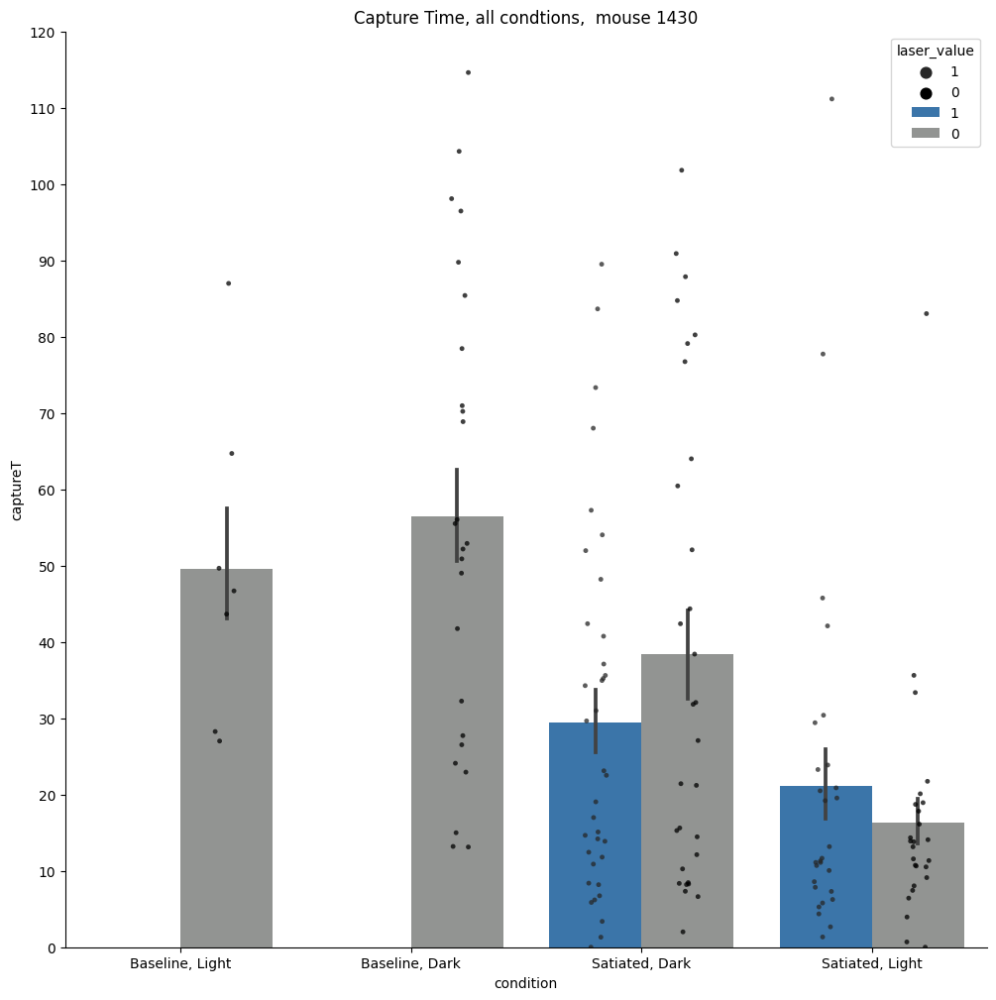

In [201]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=df1430, x='condition', y='captureT', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='captureT', hue='laser_value',dodge=True, data=df1430, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Capture Time, all condtions,  mouse 1430')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1,2,3],['Baseline, Light','Baseline, Dark', 'Satiated, Dark', 'Satiated, Light'])
sns.despine()

In [17]:
test=extract_timestamps(df_all["filename"])

test=test.to_list()
df_all['timestamps']=test

start_cohort1_l = dt.strptime('2022-02-10', "%Y-%m-%d")
end_cohort1_l = dt.strptime('2022-02-15', "%Y-%m-%d")

start_cohort1_d = dt.strptime('2022-02-16', "%Y-%m-%d")
end_cohort1_d = dt.strptime('2022-02-21', "%Y-%m-%d")

start_cohort2_l = dt.strptime('2022-07-11', "%Y-%m-%d")
end_cohort2_l = dt.strptime('2022-07-14', "%Y-%m-%d")

start_cohort2_d = dt.strptime('2022-07-15', "%Y-%m-%d")
end_cohort2_d = dt.strptime('2022-07-22', "%Y-%m-%d")


start_cohort3_l = dt.strptime('2022-12-07', "%Y-%m-%d")
end_cohort3_l = dt.strptime('2022-12-13', "%Y-%m-%d")

start_cohort3_d = dt.strptime('2023-01-05', "%Y-%m-%d")
end_cohort3_d = dt.strptime('2023-01-11', "%Y-%m-%d")

indices=np.asarray(nandf.index)

for i in indices:
    if start_cohort1_l<=df_all['timestamps'][i]<=end_cohort1_l:
        if df_all['condition'][i]!=[5,6]:
            df_all.at[i, 'condition']='baseline_l'
  
    elif start_cohort1_d<=df_all['timestamps'][i]<=end_cohort1_d:
        if df_all['condition'][i]!=[5,6]:
            df_all.at[i, 'condition']='baseline_d'
        
    elif start_cohort2_l<=df_all['timestamps'][i]<=end_cohort2_l:
        if df_all['condition'][i]!=[5,6]:
            df_all.at[i, 'condition']='baseline_l'
        
    elif start_cohort2_d<=df_all['timestamps'][i]<=end_cohort2_d:
        if df_all['condition'][i]!=[5,6]:
            df_all.at[i, 'condition']='baseline_d'
        
    elif start_cohort3_l<=df_all['timestamps'][i]<=end_cohort3_l:
        if df_all['condition'][i]!=[7,8]:
            df_all.at[i, 'condition']='baseline_l'
        
    elif start_cohort3_d<=df_all['timestamps'][i]<=end_cohort3_d:
        if df_all['condition'][i]!=[7,8]:
            df_all.at[i, 'condition']='baseline_d'

In [45]:
darkpalette=['#030aa7','#000000']
cleaned_nandf=test_nandf[test_nandf['filename'].str.contains('0893|0895|0896|0897|0898|1429|1430')]
cleaned_nandf

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-35-15_mouse-0896,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.8795219943601467, 2.442993623570855, 1.0383...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,23677.0,...,0.002539,104.710,1.000000,0.500000,105.110,21022.0,5.44500,NaN,NaN,2022-02-03 10:35:16
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-03_10-48-30_mouse-0897,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.198352308904875, 9.166484098923334, 9.41997...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",99.920,45034.0,...,0.002763,61.860,0.500000,1.000000,62.520,12504.0,4.10750,37.400,NaN,2022-02-03 10:48:30
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_10-34-40_mouse-0897,test,NaN,"[46.392508377380324, 47.23411538032969, 47.337...","[3.9652614660669916, 4.119093399691461, 4.1241...","[50.618691414766595, 50.71237504843739, 50.828...","[nan, 111.63212588755803, 104.85524437232709, ...",NaN,0.0,...,0.052167,9.405,0.062500,0.500000,NaN,54497.0,259.39575,NaN,NaN,2022-02-04 10:34:40
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-04_9-56-15_mouse-0896,test,NaN,"[40.04921463768118, 40.035394536679895, 40.026...","[1.2688213867795146, 1.3035432250095929, 1.311...","[3.0117482064091323, 3.2035749056084173, 3.922...","[81.05892397374892, 80.5885024990399, 77.60461...",NaN,0.0,...,0.055047,36.030,0.030303,1.000000,NaN,114748.0,47.50325,NaN,NaN,2022-02-04 09:56:15
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-07_13-59-24_mouse-0898,5,NaN,"[40.89803428142533, 41.589963686138944, 41.583...","[12.590891895604264, 12.590891895604264, 12.58...","[1.2404139363968412, 1.216827476662106, 1.4645...","[139.4622072253276, 140.52615233536343, 140.77...",NaN,0.0,...,0.016390,1.110,0.125000,1.000000,NaN,87863.0,39.82925,NaN,NaN,2022-02-07 13:59:24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,...,0.141276,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only,2023-01-29 13:25:16
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,...,0.197472,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only,2023-01-29 13:27:15
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,...,0.040080,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only,2023-01-29 13:29:34
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,...,0.163335,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only,2023-01-29 13:30:57


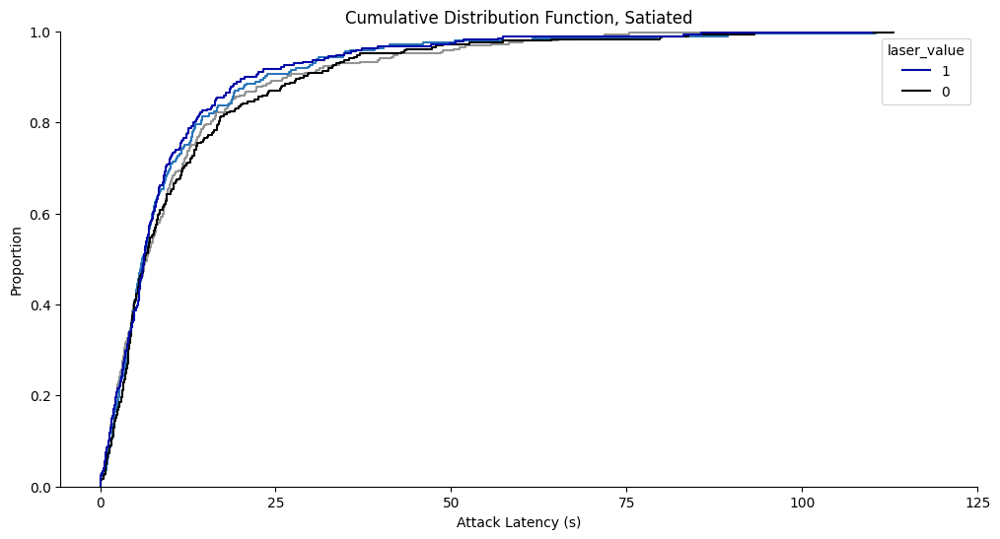

In [66]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='timetointercept', hue='laser_value',hue_order=hue_order, palette=palette)
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='timetointercept', hue='laser_value',hue_order=hue_order, palette=darkpalette)

plt.xlabel('Attack Latency (s)')
plt.title('Cumulative Distribution Function, Satiated')
plt.xticks(np.arange(0, 150,25))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/attacklatency_distriblight_allmice24.pdf')

# fig2= plt.figure(figsize=(12,6))
# ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
# plt.xlabel('Capture Duration (s)')
# plt.title('Cumulative Distribution Function, Satiated, Dark')
# plt.xticks(np.arange(0, 150,25))
# sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_distribdark_allmice.pdf')

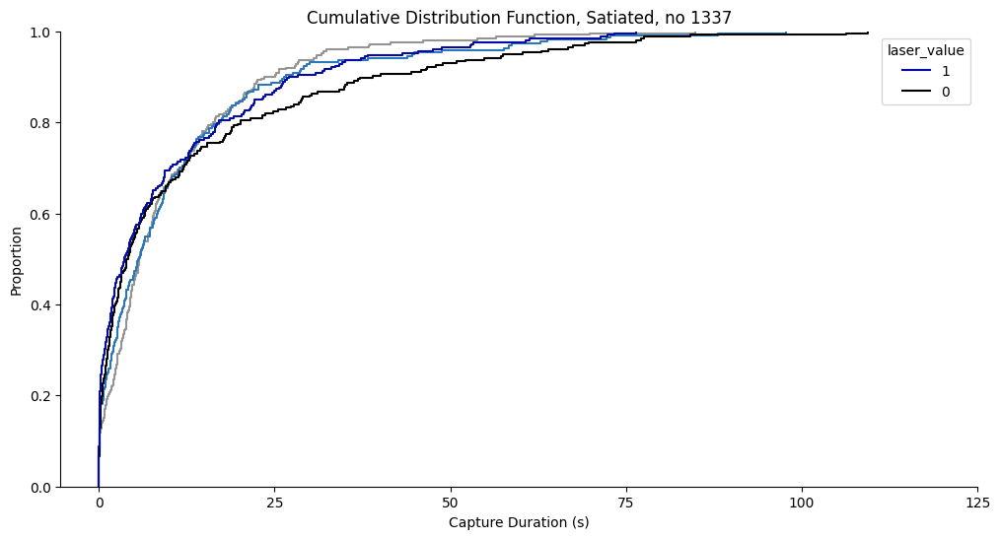

In [56]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette)
ax=sns.ecdfplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)

plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, no 1337')
plt.xticks(np.arange(0, 150,25))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/capduration_distriblight_cleaned24.pdf')

# fig2= plt.figure(figsize=(12,6))
# ax=sns.ecdfplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
# plt.xlabel('Capture Duration (s)')
# plt.title('Cumulative Distribution Function, Satiated, Dark, no 1337')
# plt.xticks(np.arange(0, 150,25))
# sns.despine()

In [223]:
from scipy import stats
light=test_nandf.iloc[np.where(test_nandf['condition']=='1')]
light_l=light.iloc[np.where(light['laser_value']==1)]
light_l_capD=light_l['capduration'].to_numpy()
light_l_capT=light_l['captureT'].to_numpy()
light_nl=light.iloc[np.where(light['laser_value']==0)]
light_nl_capD=light_l['capduration'].to_numpy()
light_nl_capT=light_l['captureT'].to_numpy()

dark=test_nandf.iloc[np.where(test_nandf['condition']=='2')]
dark_l=dark.iloc[np.where(dark['laser_value']==1)]
dark_l_capD=dark_l['capduration'].to_numpy()
dark_l_capD=dark_l_capD[~np.isnan(dark_l_capD)]
dark_l_capD=stats.norm.cdf(dark_l_capD)
dark_l_capT=dark_l['captureT'].to_numpy()
dark_l_capT=dark_l_capT[~np.isnan(dark_l_capT)]
dark_l_capT=stats.norm.cdf(dark_l_capT)
dark_nl=dark.iloc[np.where(dark['laser_value']==0)]
dark_nl_capD=dark_l['capduration'].to_numpy()
dark_nl_capD=dark_nl_capD[~np.isnan(dark_nl_capD)]
dark_nl_capD=stats.norm.cdf(dark_nl_capD)
dark_nl_capT=dark_l['captureT'].to_numpy()
dark_nl_capT=dark_nl_capT[~np.isnan(dark_nl_capT)]
dark_nl_capT=stats.norm.cdf(dark_nl_capT)

In [228]:
type(light_l_capD)

numpy.ndarray

In [225]:
stats.ks_2samp(dark_l_capD, dark_nl_capD)

KstestResult(statistic=0.0, pvalue=1.0)

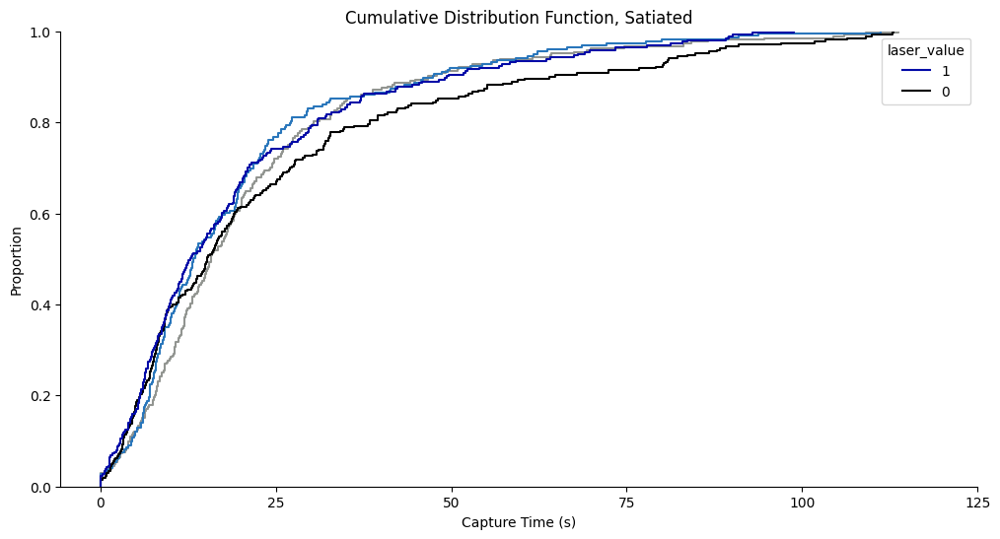

In [57]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='captureT', hue='laser_value',hue_order=hue_order, palette=palette)
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='captureT', hue='laser_value',hue_order=hue_order, palette=darkpalette)

plt.xlabel('Capture Time (s)')
plt.title('Cumulative Distribution Function, Satiated')
plt.xticks(np.arange(0, 150,25))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureT_distriblight_allmice24.pdf')

# fig2= plt.figure(figsize=(12,6))
# ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='captureT', hue='laser_value',hue_order=hue_order, palette=darkpalette)
# plt.xlabel('Capture Time (s)')
# plt.title('Cumulative Distribution Function, Satiated, Dark')
# plt.xticks(np.arange(0, 150,25))
# sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureT_distribdark_allmice.pdf')

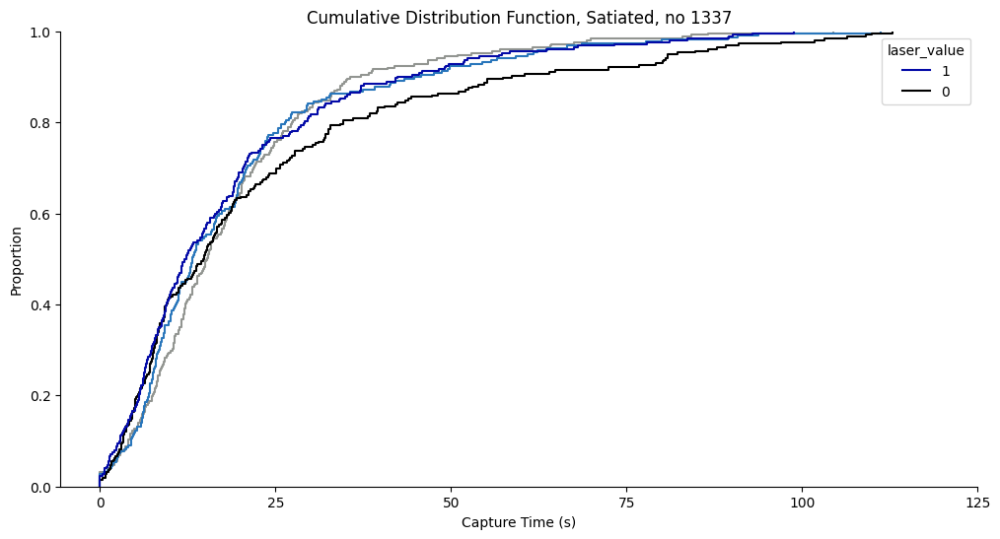

In [58]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='1')], x='captureT', hue='laser_value',hue_order=hue_order, palette=palette)
ax=sns.ecdfplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='2')], x='captureT', hue='laser_value',hue_order=hue_order, palette=darkpalette)

plt.xlabel('Capture Time (s)')
plt.title('Cumulative Distribution Function, Satiated, no 1337')
plt.xticks(np.arange(0, 150,25))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureT_distriblight_cleaned24.pdf')

# fig2= plt.figure(figsize=(12,6))
# ax=sns.ecdfplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='2')], x='captureT', hue='laser_value',hue_order=hue_order, palette=darkpalette)
# plt.xlabel('Capture Time (s)')
# plt.title('Cumulative Distribution Function, Satiated, Dark, no 1337')
# plt.xticks(np.arange(0, 150,25))
# sns.despine()

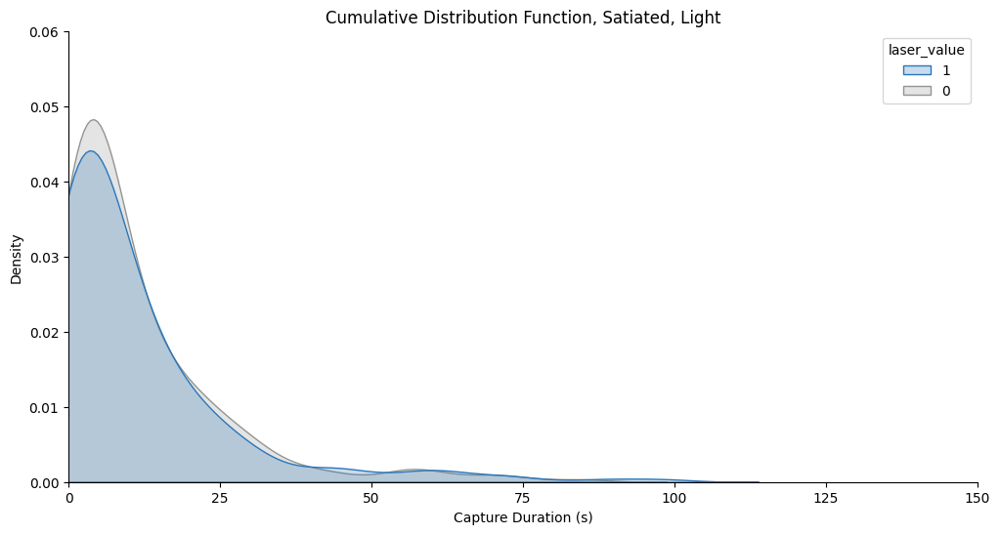

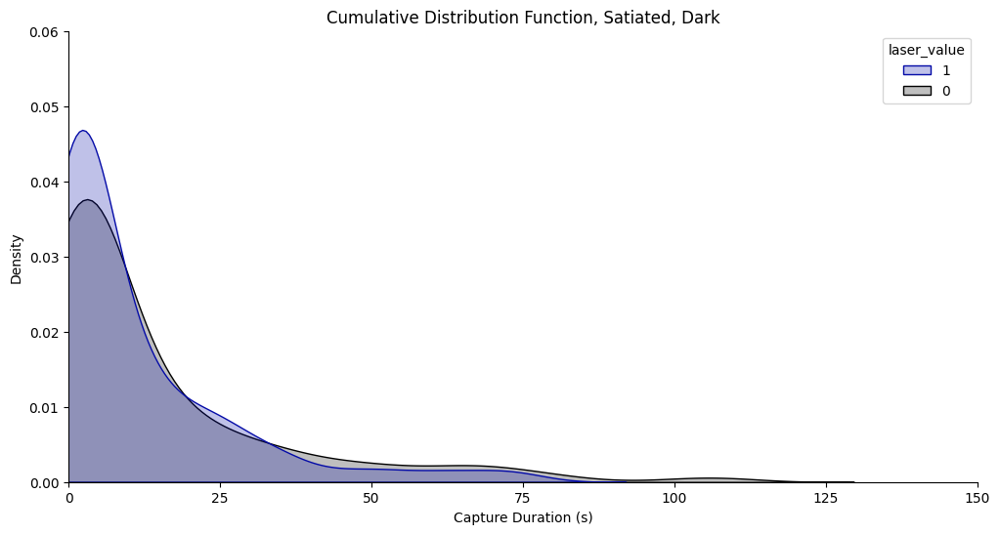

In [60]:
fig1= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, fill=True, common_norm=False)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Light')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.06)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureduration_kdelight_allmice_nonorm_clip24.pdf')

fig2= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette, fill=True,common_norm=False)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.06)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureduration_kdedark_allmice_nonorm_clip24.pdf')

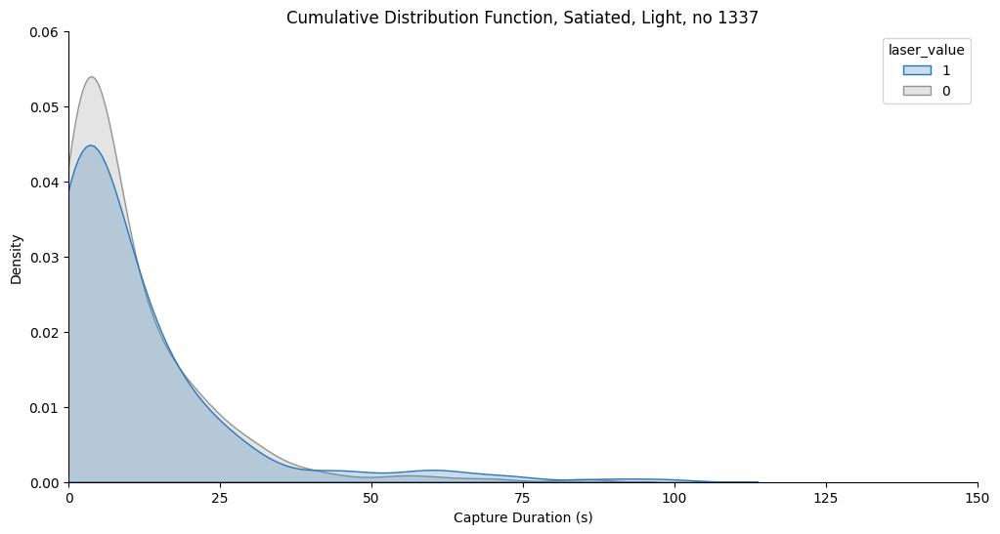

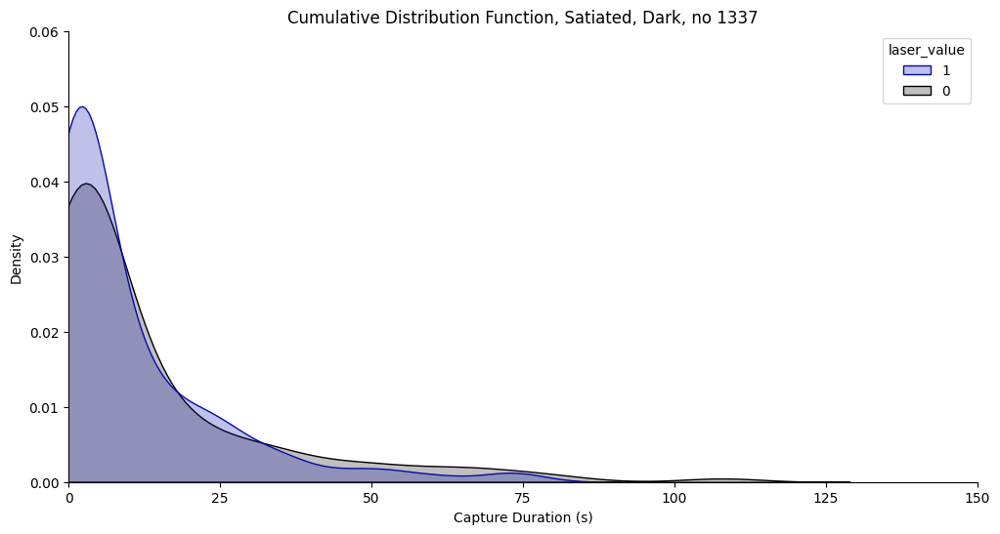

In [62]:
fig1= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, fill=True, common_norm=False)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Light, no 1337')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.06)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureduration_kdelight_cleaned_nonorm_clip24.pdf')

fig2= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette, fill=True,common_norm=False)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark, no 1337')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.06)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureduration_kdedark_cleaned_nonorm_clip24.pdf')


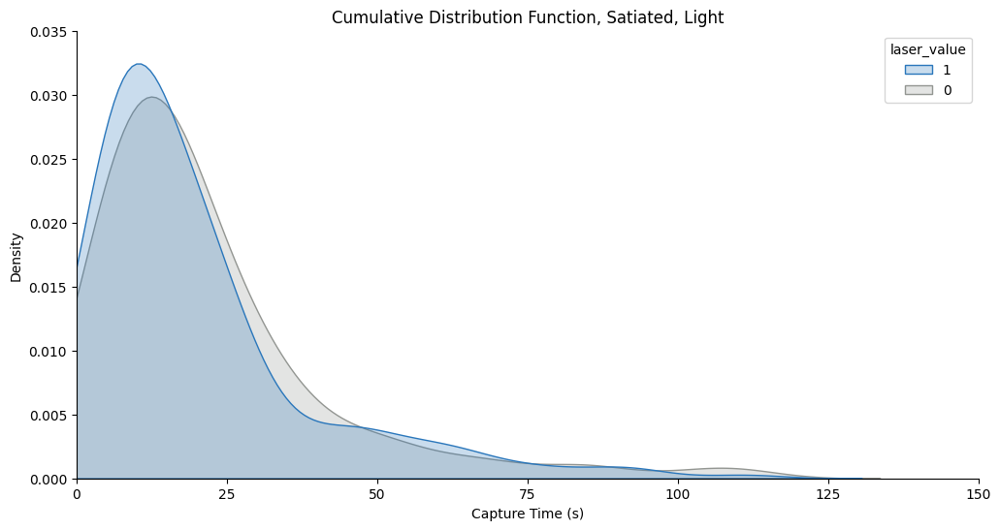

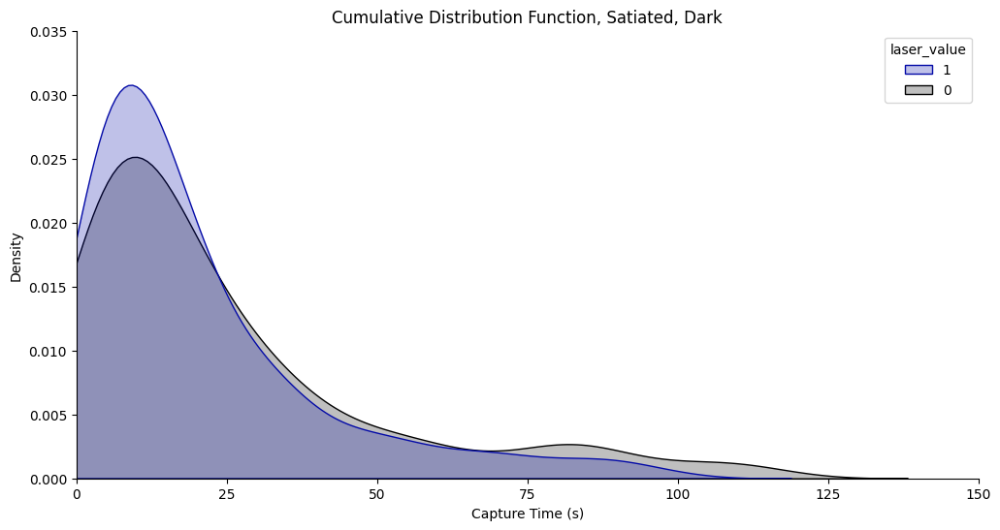

In [63]:
fig1= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='captureT', hue='laser_value',hue_order=hue_order, palette=palette, fill=True, common_norm=False)
plt.xlabel('Capture Time (s)')
plt.title('Cumulative Distribution Function, Satiated, Light')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.035)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureT_kdelight_allmice_nonorm_clip24.pdf')

fig2= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='captureT', hue='laser_value',hue_order=hue_order, palette=darkpalette, fill=True, common_norm=False)
plt.xlabel('Capture Time (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.035)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureT_kdedark_allmice_nonorm_clip24.pdf')

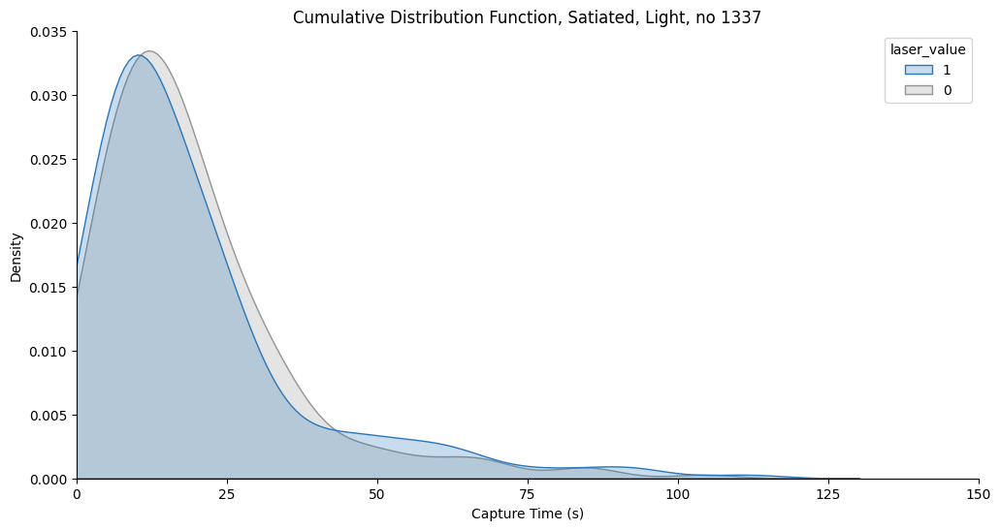

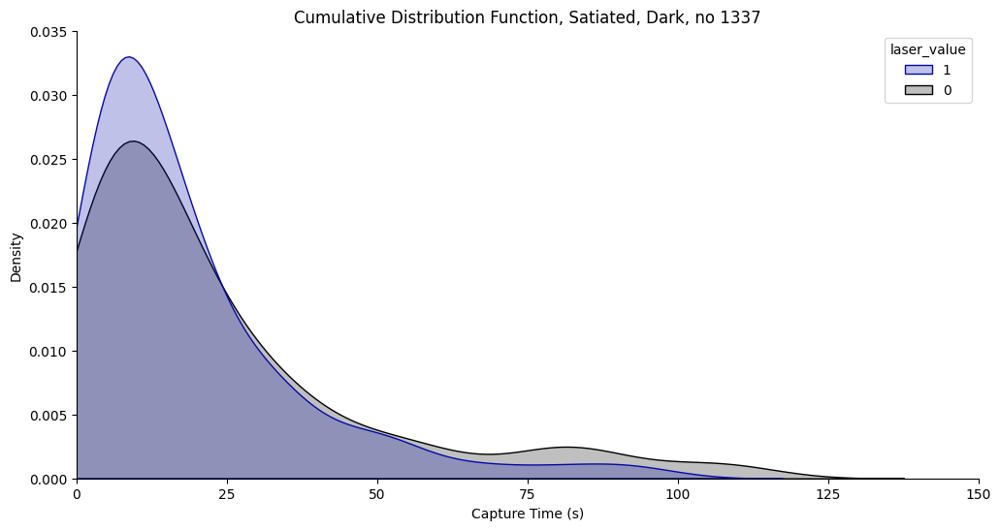

In [64]:
fig1= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='1')], x='captureT', hue='laser_value',hue_order=hue_order, palette=palette, fill=True, common_norm=False)
plt.xlabel('Capture Time (s)')
plt.title('Cumulative Distribution Function, Satiated, Light, no 1337')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.035)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureT_kdelight_cleaned_nonorm_clip24.pdf')

fig2= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=cleaned_nandf.iloc[np.where(cleaned_nandf['condition']=='2')], x='captureT', hue='laser_value',hue_order=hue_order, palette=darkpalette, fill=True, common_norm=False)
plt.xlabel('Capture Time (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark, no 1337')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.035)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/captureT_kdedark_cleaned_nonorm_clip24.pdf')


In [22]:
test_df_all=cdc(df_all)
test_df_all= test_df_all.drop(test_df_all[test_df_all.trials_to_drop == 'both'].index)

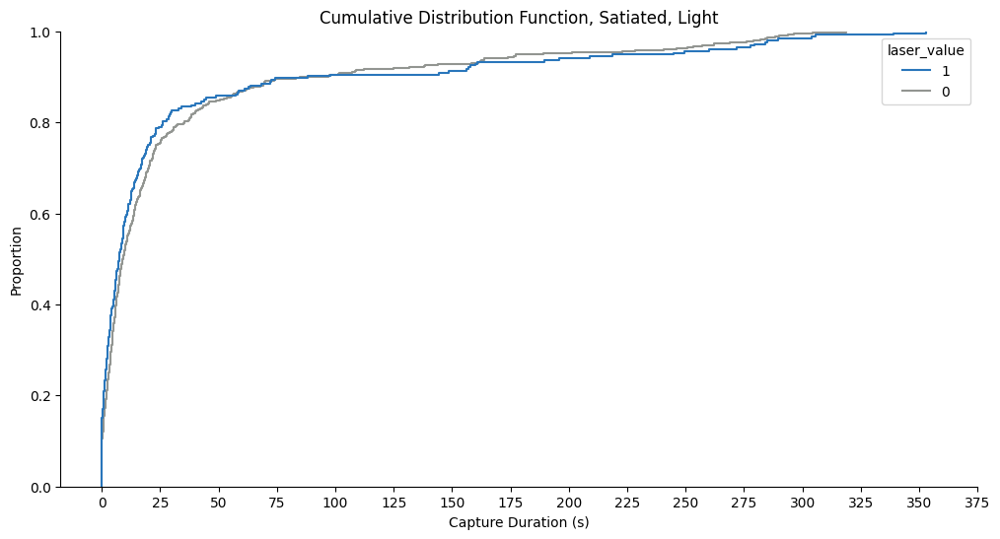

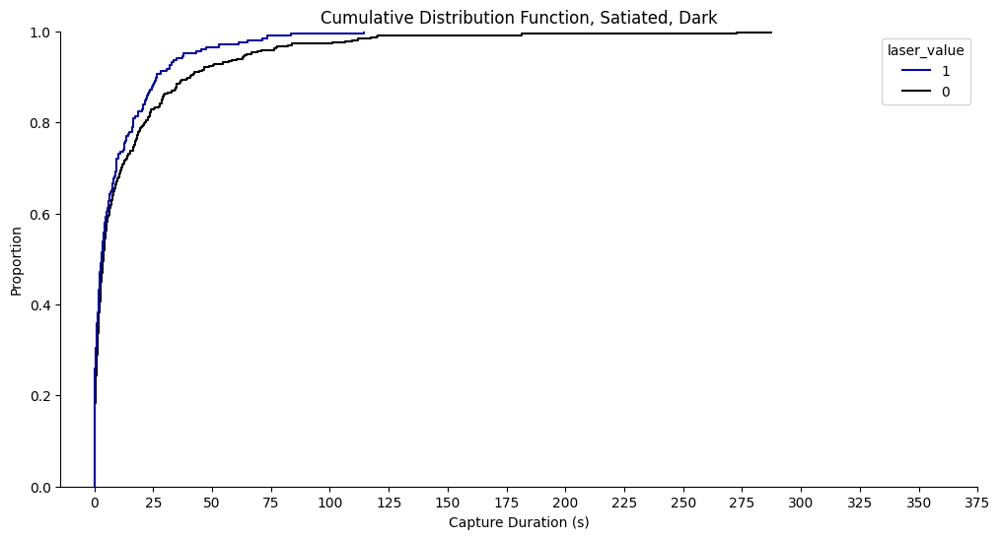

In [23]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_df_all.iloc[np.where(df_all['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Light')
plt.xticks(np.arange(0, 400,25))
sns.despine()

fig2= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_df_all.iloc[np.where(df_all['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark')
plt.xticks(np.arange(0, 400,25))
sns.despine()

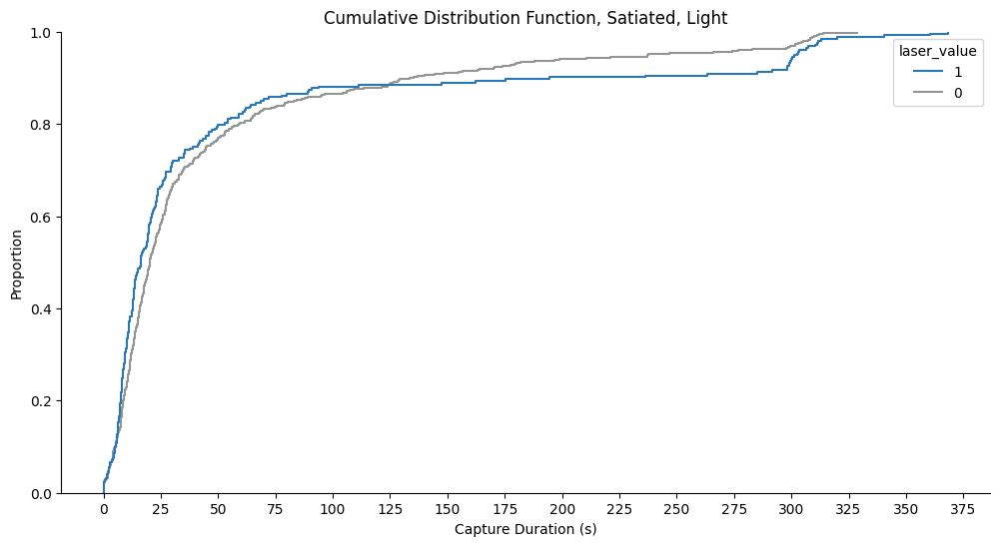

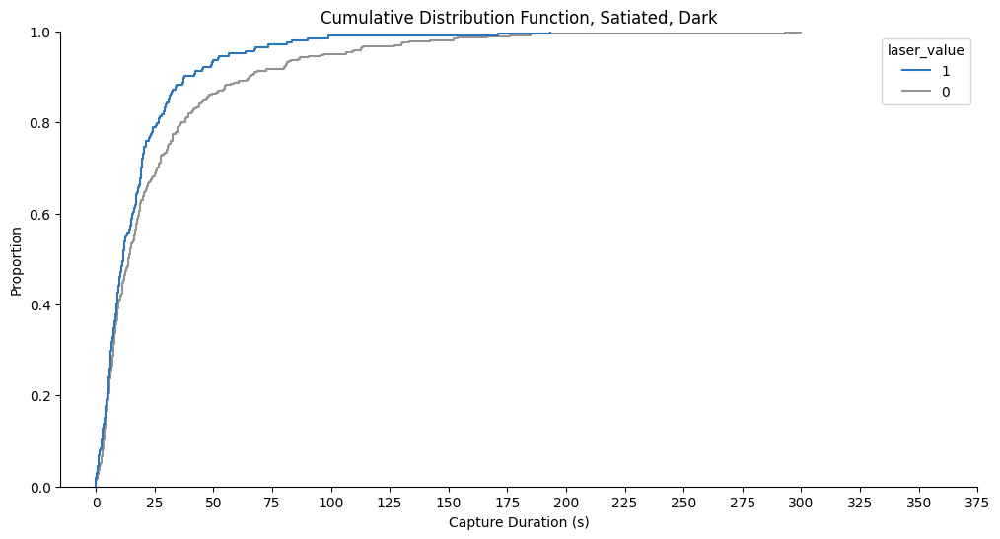

In [24]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_df_all.iloc[np.where(df_all['condition']=='1')], x='captureT', hue='laser_value',hue_order=hue_order, palette=palette)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Light')
plt.xticks(np.arange(0, 400,25))
sns.despine()

fig2= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_df_all.iloc[np.where(df_all['condition']=='2')], x='captureT', hue='laser_value',hue_order=hue_order, palette=palette)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark')
plt.xticks(np.arange(0, 400,25))
sns.despine()

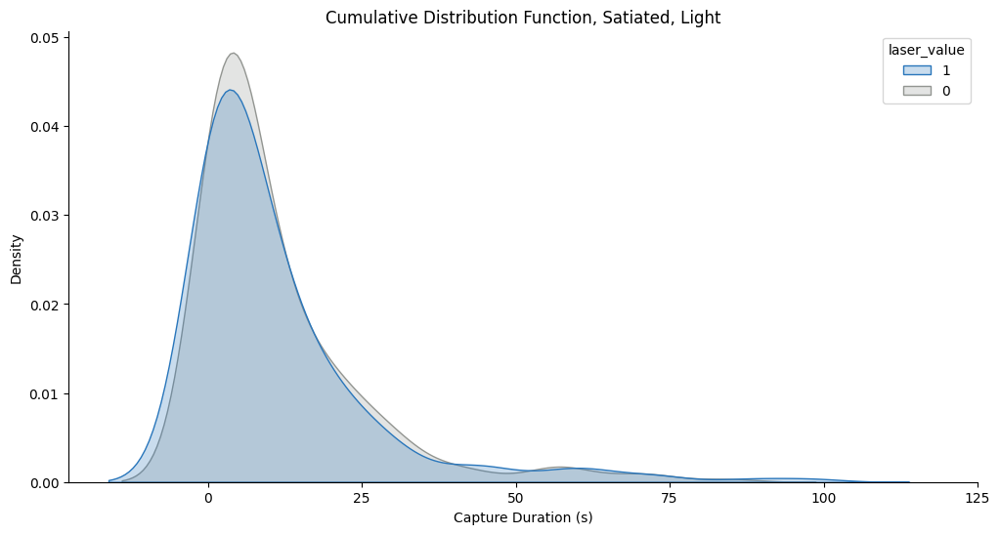

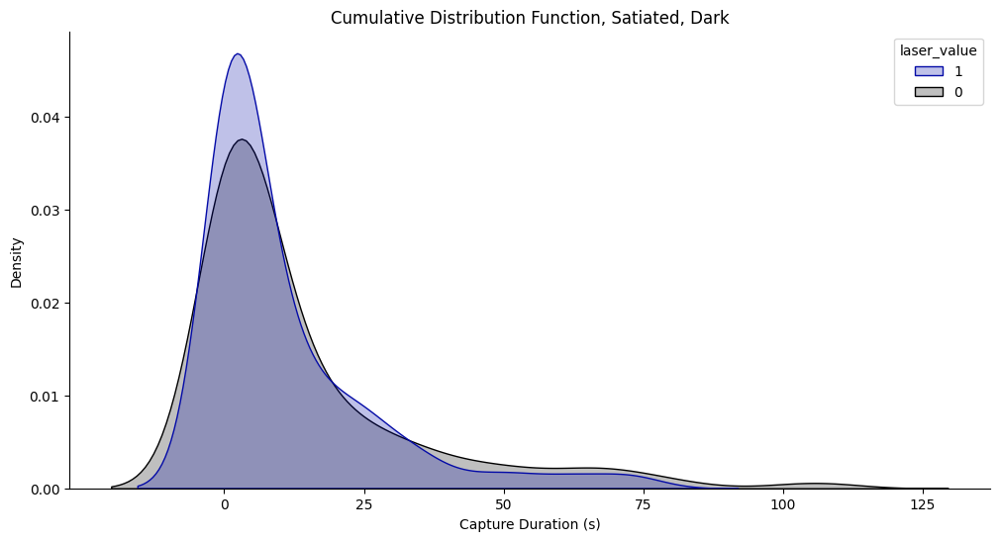

In [25]:
fig1= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, common_norm=False, common_grid=False,fill=True)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Light')
plt.xticks(np.arange(0, 150,25))
sns.despine()

fig2= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette, common_norm=False, fill=True)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark')
plt.xticks(np.arange(0, 150,25))
sns.despine()

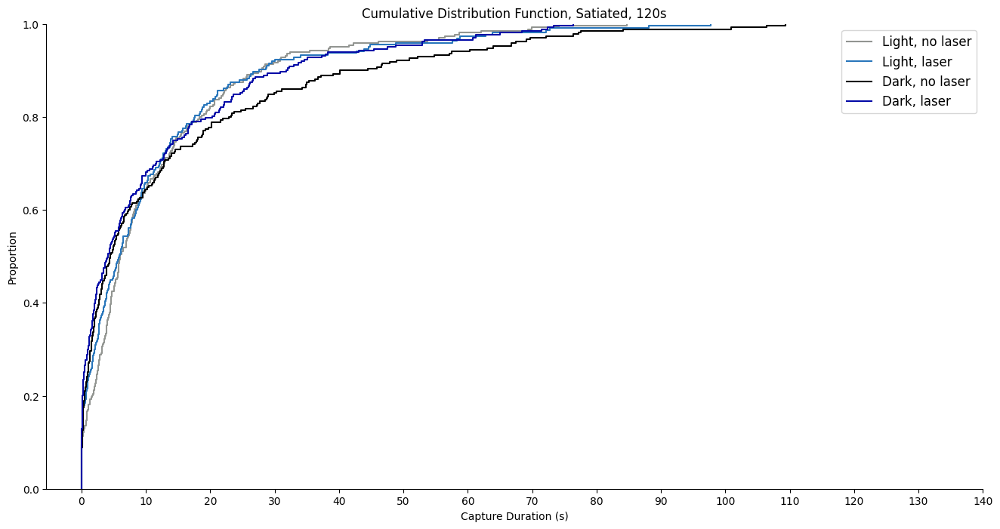

In [58]:
darkpalette=['#030aa7','#000000']
labels=['Light, no laser','Light, laser','Dark, no laser', 'Dark, laser']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, legend=True)
ax1=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, 120s')
plt.xticks(np.arange(0, 150,10))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/dist_allconds_allmice.pdf')

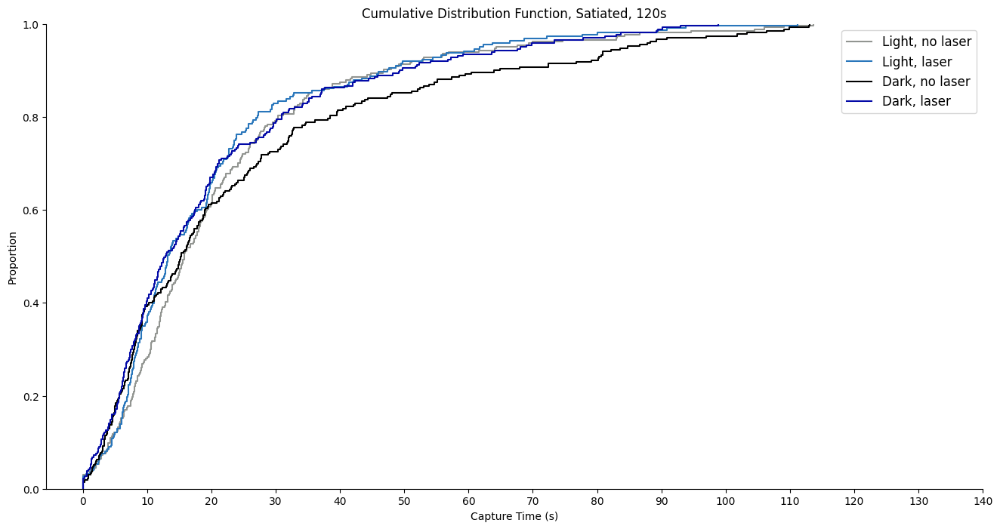

In [60]:
darkpalette=['#030aa7','#000000']
labels=['Light, no laser','Light, laser','Dark, no laser', 'Dark, laser']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='captureT', hue='laser_value',hue_order=hue_order, palette=palette, legend=True)
ax1=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='captureT', hue='laser_value',hue_order=hue_order, palette=darkpalette)
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Time (s)')
plt.title('Cumulative Distribution Function, Satiated, 120s')
plt.xticks(np.arange(0, 150,10))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/dist_capT_allconds_allmice.pdf')

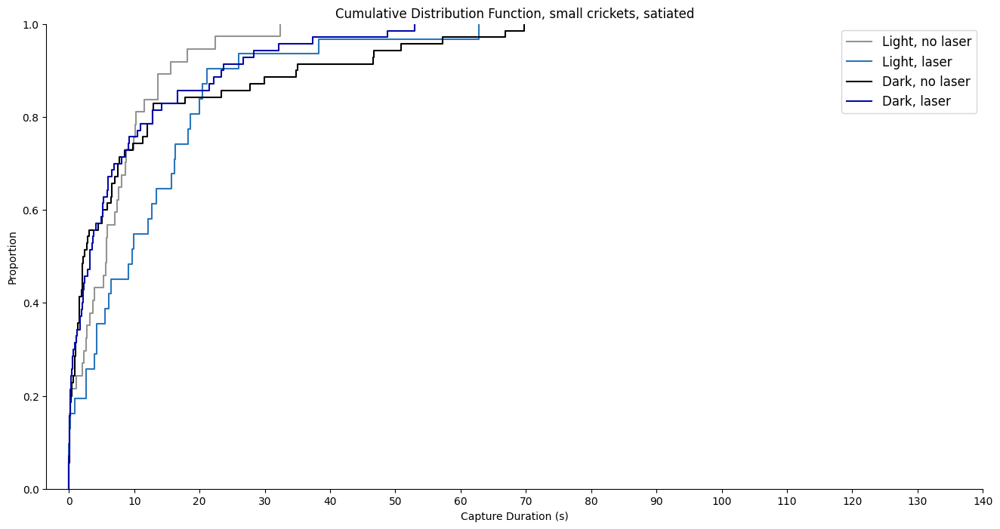

In [271]:
darkpalette=['#030aa7','#000000']
labels=['Light, no laser','Light, laser','Dark, no laser', 'Dark, laser']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=small.iloc[np.where(small['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, legend=True)
ax1=sns.ecdfplot(data=small.iloc[np.where(small['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, small crickets, satiated')
plt.xticks(np.arange(0, 150,10))
sns.despine()

##### seems like there isnt much effect of the laser in the dark with the small crickets, might be more of an effect in the light but there arent many datapoints

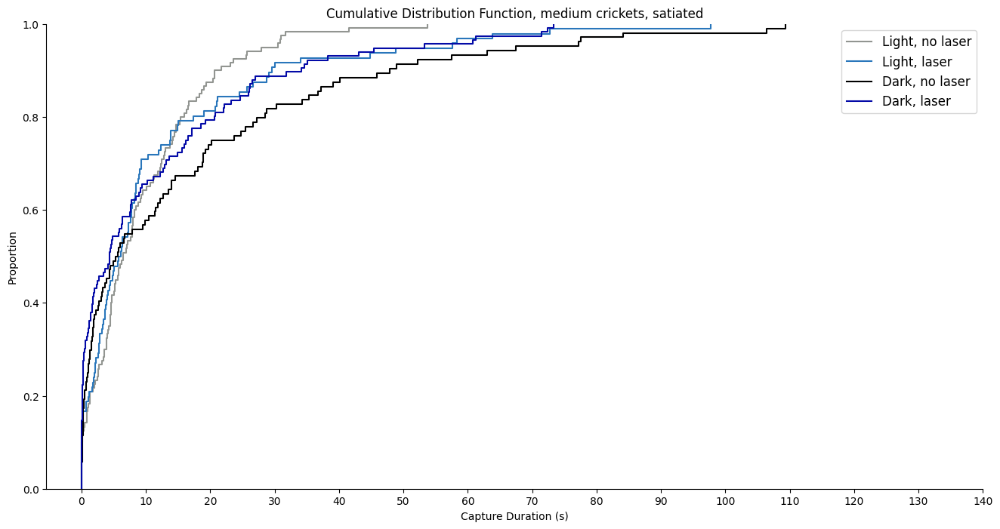

In [272]:
darkpalette=['#030aa7','#000000']
labels=['Light, no laser','Light, laser','Dark, no laser', 'Dark, laser']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=med.iloc[np.where(med['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, legend=True)
ax1=sns.ecdfplot(data=med.iloc[np.where(med['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, medium crickets, satiated')
plt.xticks(np.arange(0, 150,10))
sns.despine()

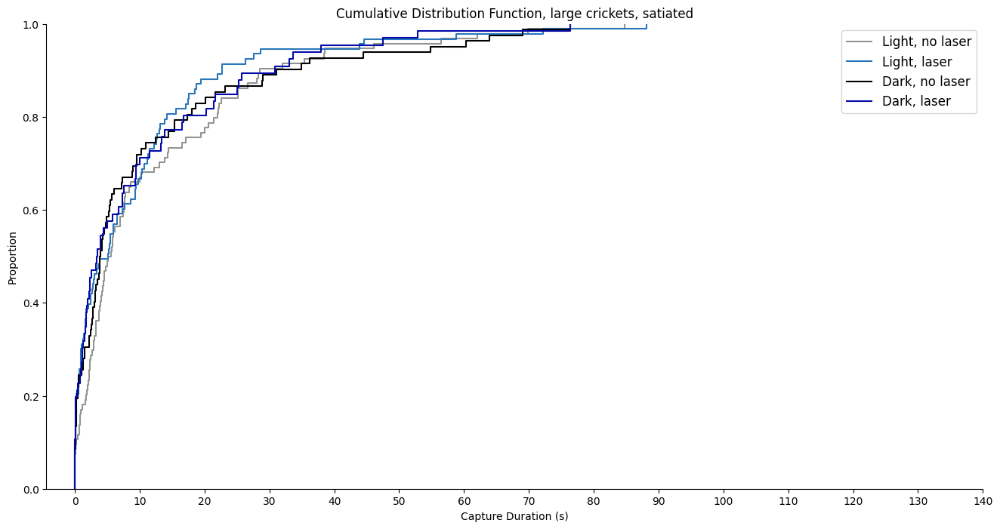

In [273]:
darkpalette=['#030aa7','#000000']
labels=['Light, no laser','Light, laser','Dark, no laser', 'Dark, laser']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=large.iloc[np.where(large['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, legend=True)
ax1=sns.ecdfplot(data=large.iloc[np.where(large['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, large crickets, satiated')
plt.xticks(np.arange(0, 150,10))
sns.despine()

In [37]:
med_large=pd.concat([med, large], ignore_index=True)

In [38]:
med_large

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,freqapproach,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-00-06_mouse-0896,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.7409957277682093, 1.8043564226373539, 1.943...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",4.96,2786.0,...,0.13245,0.955,0.25,1.0,4.16,832.0,10.9865,0.8,NaN,2022-02-10 10:00:06
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-15-31_mouse-0897,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.2736812180669475, 5.538678124903959, 5.8628...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",9.155,2033.0,...,0.099668,0.83,1.0,0.333333,2.69,538.0,9.82625,6.465,NaN,2022-02-10 10:15:31
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-24-20_mouse-0897,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.928377361930027, 10.31324453013419, 12.5163...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",2.45,1829.0,...,0.04279,1.47,1.0,1.0,2.365,473.0,9.56175,0.085,NaN,2022-02-10 10:24:20
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-27-39_mouse-0897,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[6.317315523767738, 7.158924559231755, 7.99407...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,10.63175,0.0,NaN,2022-02-10 10:27:40
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-29-25_mouse-0897,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[11.438917129077582, 16.994443592031168, 17.62...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",37.58,1332.0,...,0.040052,12.1,1.0,0.5,14.79,2958.0,9.33225,22.79,NaN,2022-02-10 10:29:25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1285,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-27_11-16-20_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9241373290351216, 1.1343916629143145, 1.381...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.445,1766.0,...,0.129429,0.215,0.25,1.0,7.445,1489.0,11.4455,5.0,left_only,2023-01-27 11:16:20
1286,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-27_11-59-58_mouse-1429,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.611892128724168, 11.478146177275189, 15.101...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",10.31,1604.0,...,0.181917,1.205,0.4,0.5,8.42,1684.0,11.35975,1.89,left_only,2023-01-27 11:59:58
1287,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-27_12-05-54_mouse-1429,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.456363194728566, 7.428190070266504, 10.6245...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",7.695,1697.0,...,0.102951,1.26,0.333333,1.0,5.385,1077.0,13.95,2.31,left_only,2023-01-27 12:05:54
1288,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-28_11-46-58_mouse-1337,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.1657607251616786, 1.3075622125610986, 2.024...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",82.98,1941.0,...,0.135855,6.935,0.538462,0.142857,50.7,10140.0,11.8755,32.28,left_only,2023-01-28 11:46:58


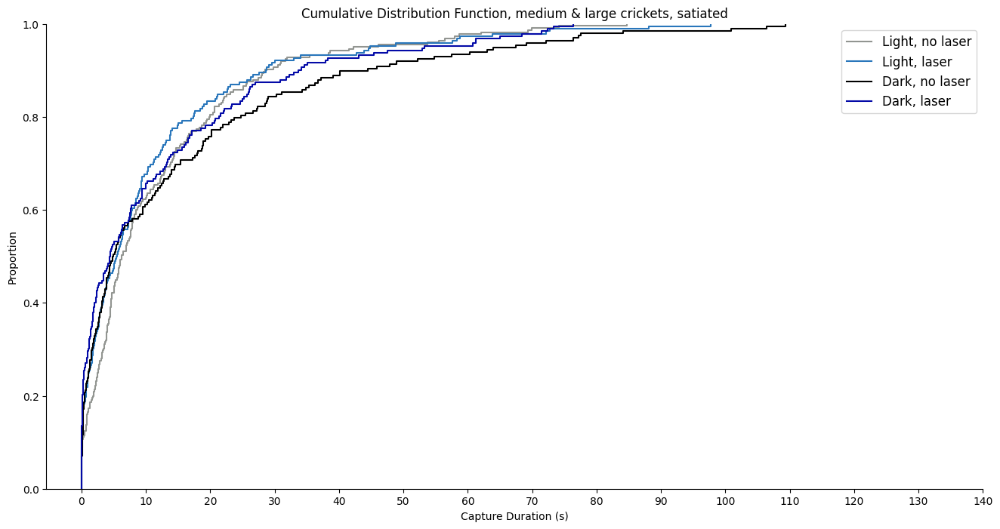

In [40]:
darkpalette=['#030aa7','#000000']
labels=['Light, no laser','Light, laser','Dark, no laser', 'Dark, laser']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=med_large.iloc[np.where(med_large['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, legend=True)
ax1=sns.ecdfplot(data=med_large.iloc[np.where(med_large['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, medium & large crickets, satiated')
plt.xticks(np.arange(0, 150,10))
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/dist_allconds_allmice_mdlg.pdf')

In [26]:
observations=cdc(test_nandf)
observations=observations[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations['absoluteintercept']=observations['cricketdrop']+observations['interceptframe']

cleaned_observations= observations[observations['capduration'].notna()]

In [27]:
observations

,filename,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureframe,cricketdrop,interceptframe,capduration,absoluteintercept
0,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[2.8795219943601467, 2.442993623570855, 1.0383...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",117120.0,23677.0,21022.0,NaN,44699.0
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.198352308904875, 9.166484098923334, 9.41997...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",65018.0,45034.0,12504.0,37.400,57538.0
2,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,"[46.392508377380324, 47.23411538032969, 47.337...","[3.9652614660669916, 4.119093399691461, 4.1241...","[50.618691414766595, 50.71237504843739, 50.828...","[nan, 111.63212588755803, 104.85524437232709, ...",122683.0,0.0,54497.0,NaN,54497.0
3,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,"[40.04921463768118, 40.035394536679895, 40.026...","[1.2688213867795146, 1.3035432250095929, 1.311...","[3.0117482064091323, 3.2035749056084173, 3.922...","[81.05892397374892, 80.5885024990399, 77.60461...",119897.0,0.0,114748.0,NaN,114748.0
4,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,NaN,"[40.89803428142533, 41.589963686138944, 41.583...","[12.590891895604264, 12.590891895604264, 12.58...","[1.2404139363968412, 1.216827476662106, 1.4645...","[139.4622072253276, 140.52615233536343, 140.77...",97617.0,0.0,87863.0,NaN,87863.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6310.0,1805.0,1381.0,15.620,3186.0
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",3938.0,1513.0,2325.0,0.500,3838.0
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",3114.0,1766.0,1344.0,0.020,3110.0
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",43611.0,1494.0,5564.0,NaN,7058.0


In [28]:
cleaned_observations

,filename,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureframe,cricketdrop,interceptframe,capduration,absoluteintercept
1,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[8.198352308904875, 9.166484098923334, 9.41997...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",65018.0,45034.0,12504.0,37.400,57538.0
13,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,0.0,"[3.549248774216916, 3.531578354045956, 4.46233...","[193.4331059319871, 193.42783800067448, 193.33...","[11.841965025461079, 14.41235403200907, 18.937...","[156.6153916556469, 6.6013690290491365, 23.189...",10918.0,0.0,63.0,54.275,63.0
24,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.617392256263051, 4.94077929580455, 5.101532...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",24834.0,5976.0,16187.0,13.355,22163.0
25,/Volumes/Projects/PreyCapture/ZIActivation/202...,5,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5320791589686564, 0.3454641350209898, 0.258...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",56112.0,52888.0,407.0,14.085,53295.0
37,/Volumes/Projects/PreyCapture/ZIActivation/202...,test,NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[20.511623881260274, 21.79367467295265, 24.402...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",14084.0,1241.0,9426.0,17.085,10667.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2434,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[15.705173036235356, 17.440823336355482, 19.61...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",19605.0,4259.0,3842.0,57.520,8101.0
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6310.0,1805.0,1381.0,15.620,3186.0
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",3938.0,1513.0,2325.0,0.500,3838.0
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",3114.0,1766.0,1344.0,0.020,3110.0


In [29]:
cond1=observations.iloc[np.where(observations['condition']=='1')]
cond1_laser=cond1.iloc[np.where(cond1['laser_value']==1)]
cond1_nolaser=cond1.iloc[np.where(cond1['laser_value']==0)]

cond2=observations.iloc[np.where(observations['condition']=='2')]
cond2_laser=cond2.iloc[np.where(cond2['laser_value']==1)]
cond2_nolaser=cond2.iloc[np.where(cond2['laser_value']==0)]

In [30]:
failures1=cond1_laser['capduration'].isna().sum()
successes1=cond1_laser['capduration'].notna().sum()

failures2=cond2_laser['capduration'].isna().sum()
successes2=cond2_laser['capduration'].notna().sum()

In [24]:
successes1

223

In [31]:
indices=np.asarray(cond1_nolaser.index)
for i in indices:
    drop=int(np.asarray([cond1_nolaser['cricketdrop'][i]])[0])
    intercept=int(np.asarray([cond1_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_nolaser['captureframe'][i]])[0])
    
    dist=cond1_nolaser['dist'][i]
    clip_dist=dist[intercept:capture]
    clip_dist=clip_dist.astype(float)
    z_clip_dist=stats.zscore(clip_dist, nan_policy='omit')
    
    az=cond1_nolaser['az'][i]
    clip_az=az[intercept:capture]
    clip_az=clip_az.astype(float)
    z_clip_az=stats.zscore(clip_az, nan_policy='omit')
    
    spd=cond1_nolaser['mouse_spd'][i]
    clip_spd=spd[intercept:capture]
    clip_spd=clip_spd.astype(float)
    z_clip_spd=stats.zscore(clip_spd, nan_policy='omit')
    
    cricket=cond1_nolaser['cricket_spd'][i]
    clip_cricket=cricket[intercept:capture]
    clip_cricket=clip_cricket.astype(float)
    z_clip_cricket=stats.zscore(clip_cricket, nan_policy='omit')

In [32]:
indices=np.asarray(cond2_nolaser.index)
for i in indices:
    drop=int(np.asarray([cond2_nolaser['cricketdrop'][i]])[0])
    intercept=int(np.asarray([cond2_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_nolaser['captureframe'][i]])[0])
    
    dist=cond2_nolaser['dist'][i]
    clip_dist=dist[intercept:capture]
    clip_dist=clip_dist.astype(float)
    z_clip_dist=stats.zscore(clip_dist, nan_policy='omit')
    
    az=cond2_nolaser['az'][i]
    clip_az=az[intercept:capture]
    clip_az=clip_az.astype(float)
    z_clip_az=stats.zscore(clip_az, nan_policy='omit')
    
    spd=cond2_nolaser['mouse_spd'][i]
    clip_spd=spd[intercept:capture]
    clip_spd=clip_spd.astype(float)
    z_clip_spd=stats.zscore(clip_spd, nan_policy='omit')
    
    cricket=cond2_nolaser['cricket_spd'][i]
    clip_cricket=cricket[intercept:capture]
    clip_cricket=clip_cricket.astype(float)
    z_clip_cricket=stats.zscore(clip_cricket, nan_policy='omit')

In [237]:
print(intercept)
print(capture)

7058
43611


In [34]:
cond1_nl_ranges=pd.DataFrame()
cond1_nl_ranges_rev=pd.DataFrame()
indices=np.asarray(cond1_nolaser.index)
# indices=indices[0:100]
for i in indices:
    dist=cond1_nolaser['dist'][i]
    
    intercept=int(np.asarray([cond1_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_nolaser['captureframe'][i]])[0])
    clip_dist=dist[intercept:capture]
    clip_dist_rev=np.flip(clip_dist)
    
    new_row=pd.DataFrame(clip_dist)
    new_row_rev=pd.DataFrame(clip_dist_rev)
    cond1_nl_ranges=pd.concat([cond1_nl_ranges,new_row.T],ignore_index=True)
    cond1_nl_ranges_rev=pd.concat([cond1_nl_ranges_rev,new_row_rev.T],ignore_index=True)
# cond1_l_ranges
mean_cond1nl=cond1_nl_ranges.mean()
sem_cond1nl=cond1_nl_ranges.sem()

mean_cond1nl_rev=cond1_nl_ranges_rev.mean()
sem_cond1nl_rev=cond1_nl_ranges_rev.sem()
# print(mean_cond1nl)

cond1_l_ranges=pd.DataFrame()
cond1_l_ranges_rev=pd.DataFrame()
indices=np.asarray(cond1_laser.index)
# indices=indices[0:100]
for i in indices:
    dist=cond1_laser['dist'][i]
    intercept=int(np.asarray([cond1_laser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_laser['captureframe'][i]])[0])
    clip_dist=dist[intercept:capture]
    clip_dist_rev=np.flip(clip_dist)
    new_row=pd.DataFrame(clip_dist)
    new_row_rev=pd.DataFrame(clip_dist_rev)
    cond1_l_ranges=pd.concat([cond1_l_ranges,new_row.T],ignore_index=True)
    cond1_l_ranges_rev=pd.concat([cond1_l_ranges_rev,new_row_rev.T],ignore_index=True)
# cond1_nl_ranges
mean_cond1l=cond1_l_ranges.mean()
sem_cond1l=cond1_l_ranges.sem()

# mean_cond1l_rev=cond1_l_ranges_rev.mean()
# sem_cond1l_rev=cond1_l_ranges_rev.sem()
print(mean_cond1l)

cond2_nl_ranges=pd.DataFrame()
cond2_nl_ranges_rev=pd.DataFrame()
indices=np.asarray(cond2_nolaser.index)
# indices=indices[0:100]
for i in indices:
    dist=cond2_nolaser['dist'][i]
    
    intercept=int(np.asarray([cond2_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_nolaser['captureframe'][i]])[0])
    clip_dist=dist[intercept:capture]
    clip_dist_rev=np.flip(clip_dist)
    new_row=pd.DataFrame(clip_dist)
    new_row_rev=pd.DataFrame(clip_dist_rev)
    cond2_nl_ranges=pd.concat([cond2_nl_ranges,new_row.T],ignore_index=True)
    cond2_nl_ranges_rev=pd.concat([cond2_nl_ranges_rev,new_row_rev.T],ignore_index=True)
# cond1_l_ranges
mean_cond2nl=cond2_nl_ranges.mean()
sem_cond2nl=cond2_nl_ranges.sem()

mean_cond2nl_rev=cond2_nl_ranges_rev.mean()
sem_cond2nl_rev=cond2_nl_ranges_rev.sem()
print(mean_cond2nl)

cond2_l_ranges=pd.DataFrame()
cond2_l_ranges_rev=pd.DataFrame()
indices=np.asarray(cond2_laser.index)
# indices=indices[0:100]
for i in indices:
    dist=cond2_laser['dist'][i]
    intercept=int(np.asarray([cond2_laser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_laser['captureframe'][i]])[0])
    clip_dist=dist[intercept:capture]
    clip_dist_rev=np.flip(clip_dist)
    new_row=pd.DataFrame(clip_dist)
    new_row_rev=pd.DataFrame(clip_dist_rev)
    cond2_l_ranges=pd.concat([cond2_l_ranges,new_row.T],ignore_index=True)
    cond2_l_ranges_rev=pd.concat([cond2_l_ranges_rev,new_row_rev.T],ignore_index=True)
# cond1_nl_ranges
mean_cond2l=cond2_l_ranges.mean()
sem_cond2l=cond2_l_ranges.sem()

mean_cond2l_rev=cond2_l_ranges_rev.mean()
sem_cond2l_rev=cond2_l_ranges_rev.sem()

print(mean_cond2l)

0         4.198248
1         4.811241
2         4.947693
3         4.981528
4         5.135179
           ...    
70595    50.185156
70596    50.194046
70597    50.206307
70598    50.232127
70599    50.237763
Length: 70600, dtype: float64


KeyboardInterrupt: 

In [ ]:
plt.figure(figsize=(30,15))
labels=['light, laser', 'light, no laser']
plt.errorbar(np.arange(0,len(mean_cond1l)), mean_cond1l, yerr=sem_cond1l,errorevery=50, ecolor='cornflowerblue', alpha=0.75)
plt.xlim(-500,12000)
plt.ylim(0,50)
# plt.fill_between(
plt.errorbar(np.arange(0,len(mean_cond1nl)), mean_cond1nl, yerr=sem_cond1nl,errorevery=50, color='grey', ecolor='lightgrey', alpha=0.75)
sns.despine()
plt.legend(labels=labels, fontsize='large')
plt.xlim(-500,12000)
plt.ylim(0,50)        
# plt.xlim(20000,30000)
plt.title('Mean range, all trials, light')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanrange_light_successes.pdf')

plt.figure(figsize=(30,15))
labels=['dark, laser', 'dark, no laser']
plt.errorbar(np.arange(0,len(mean_cond2l)), mean_cond2l, yerr=sem_cond2l,errorevery=50, ecolor='cornflowerblue', alpha=0.75)
plt.xlim(-500,12000)
plt.ylim(0,50)
# plt.fill_between(
plt.errorbar(np.arange(0,len(mean_cond2nl)), mean_cond2nl, yerr=sem_cond2nl,errorevery=50, color='grey', ecolor='lightgrey', alpha=0.75)
sns.despine()
plt.legend(labels=labels, fontsize='large')
plt.xlim(-500,12000)
plt.ylim(0,50)        
# plt.xlim(20000,30000)
plt.title('Mean range, all trials, dark')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanrange_dark_successes.pdf')


plt.figure(figsize=(30,15))
labels=['light, laser', 'light, no laser']
plt.errorbar(np.arange(0,len(mean_cond1l_rev)), mean_cond1l_rev, yerr=sem_cond1l_rev,errorevery=50, ecolor='cornflowerblue', alpha=0.75)
plt.xlim(-500,12000)
plt.ylim(0,50)
# plt.fill_between(
plt.errorbar(np.arange(0,len(mean_cond1nl_rev)), mean_cond1nl_rev, yerr=sem_cond1nl_rev,errorevery=50, color='grey', ecolor='lightgrey', alpha=0.75)
sns.despine()
plt.legend(labels=labels, fontsize='large')
plt.xlim(-500,12000)
plt.ylim(0,50)        
# plt.xlim(20000,30000)
plt.title('Mean range, all trials, light, aligned to capture')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanrange_light_successes_capture.pdf')

plt.figure(figsize=(30,15))
labels=['dark, laser', 'dark, no laser']
plt.errorbar(np.arange(0,len(mean_cond2l_rev)), mean_cond2l_rev, yerr=sem_cond2l_rev,errorevery=50, ecolor='cornflowerblue', alpha=0.75)
plt.xlim(-500,12000)
plt.ylim(0,50)
# plt.fill_between(
plt.errorbar(np.arange(0,len(mean_cond2nl_rev)), mean_cond2nl_rev, yerr=sem_cond2nl_rev,errorevery=50, color='grey', ecolor='lightgrey', alpha=0.75)
sns.despine()
plt.legend(labels=labels, fontsize='large')
plt.xlim(-500,12000)
plt.ylim(0,50)        
# plt.xlim(20000,30000)
plt.title('Mean range, all trials, dark, aligned to capture')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanrange_dark_successes_capture.pdf')

In [35]:
cond1_nl_az=pd.DataFrame()
cond1_nl_az_rev=pd.DataFrame()
indices=np.asarray(cond1_nolaser.index)
# indices=indices[0:100]
for i in indices:
    az=cond1_nolaser['az'][i]
    
    intercept=int(np.asarray([cond1_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_nolaser['captureframe'][i]])[0])
    clip_az=az[intercept:capture]
    clip_az_rev=np.flip(clip_az)
    new_row=pd.DataFrame(clip_az)
    new_row_rev=pd.DataFrame(clip_az_rev)
    cond1_nl_az=pd.concat([cond1_nl_az,new_row.T],ignore_index=True)
    cond1_nl_az_rev=pd.concat([cond1_nl_az_rev,new_row_rev.T],ignore_index=True)
# cond1_l_ranges
meanaz_cond1nl=cond1_nl_az.mean()
semaz_cond1nl=cond1_nl_az.sem()

meanaz_cond1nl_rev=cond1_nl_az_rev.mean()
semaz_cond1nl_rev=cond1_nl_az_rev.sem()
print(meanaz_cond1nl)

cond1_l_az=pd.DataFrame()
cond1_l_az_rev=pd.DataFrame()
indices=np.asarray(cond1_laser.index)
# indices=indices[0:100]
for i in indices:
    az=cond1_laser['az'][i]
    intercept=int(np.asarray([cond1_laser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_laser['captureframe'][i]])[0])
    clip_az=az[intercept:capture]
    clip_az_rev=np.flip(clip_az)
    new_row=pd.DataFrame(clip_az)
    new_rpw_rev=pd.DataFrame(clip_az_rev)
    cond1_l_az=pd.concat([cond1_l_az,new_row.T],ignore_index=True)
    cond1_l_az_rev=pd.concat([cond1_l_az_rev,new_row_rev.T],ignore_index=True)
# cond1_nl_ranges
meanaz_cond1l=cond1_l_az.mean()
semaz_cond1l=cond1_l_az.sem()

meanaz_cond1l_rev=cond1_l_az_rev.mean()
semaz_cond1l_rev=cond1_l_az_rev.sem()
print(meanaz_cond1l)

cond2_nl_az=pd.DataFrame()
cond2_nl_az_rev=pd.DataFrame()
indices=np.asarray(cond2_nolaser.index)
# indices=indices[0:100]
for i in indices:
    az=cond2_nolaser['az'][i]
    
    intercept=int(np.asarray([cond2_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_nolaser['captureframe'][i]])[0])
    clip_az=az[intercept:capture]
    clip_az_rev=np.flip(clip_az)
    new_row=pd.DataFrame(clip_az)
    new_row_rev=pd.DataFrame(clip_az_rev)
    cond2_nl_az=pd.concat([cond2_nl_az,new_row.T],ignore_index=True)
    cond2_nl_az_rev=pd.concat([cond2_nl_az_rev,new_row_rev.T],ignore_index=True)
# cond1_l_ranges
meanaz_cond2nl=cond2_nl_az.mean()
semaz_cond2nl=cond2_nl_az.sem()
meanaz_cond2nl_rev=cond2_nl_az_rev.mean()
semaz_cond2nl_rev=cond2_nl_az_rev.sem()
print(meanaz_cond2nl)

cond2_l_az=pd.DataFrame()
cond2_l_az_rev=pd.DataFrame()
indices=np.asarray(cond2_laser.index)
# indices=indices[0:100]
for i in indices:
    az=cond2_laser['az'][i]
    intercept=int(np.asarray([cond2_laser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_laser['captureframe'][i]])[0])
    clip_az=az[intercept:capture]
    clip_az_rev=np.flip(clip_az)
    new_row=pd.DataFrame(clip_az)
    new_row_rev=pd.DataFrame(clip_az_rev)
    cond2_l_az=pd.concat([cond2_l_az,new_row.T],ignore_index=True)
    cond2_l_az_rev=pd.concat([cond2_l_az_rev,new_row_rev.T],ignore_index=True)
# cond1_nl_ranges
meanaz_cond2l=cond2_l_az.mean()
semaz_cond2l=cond2_l_az.sem()
meanaz_cond2l_rev=cond2_l_az_rev.mean()
semaz_cond2l_rev=cond2_l_az_rev.sem()
print(meanaz_cond2l)

0        22.151082
1        23.954059
2        26.402846
3        27.569320
4        28.628726
           ...    
60842    89.789751
60843    89.662718
60844    90.795745
60845    90.547261
60846    89.925105
Length: 60847, dtype: float64
0        20.685553
1        25.991925
2        27.680859
3        28.917839
4        29.572324
           ...    
70595     9.403041
70596     9.997657
70597    11.132731
70598    12.150312
70599    12.127303
Length: 70600, dtype: float64
0         24.842281
1         25.681990
2         27.277565
3         27.589624
4         28.400439
            ...    
63726    139.563420
63727    139.828822
63728    140.784526
63729    140.826141
63730    141.143128
Length: 63731, dtype: float64
0         23.486088
1         25.742759
2         26.336215
3         26.770223
4         27.071646
            ...    
60795    152.215470
60796    146.307161
60797    147.561253
60798    145.929593
60799    145.166936
Length: 60800, dtype: float64


In [36]:
cond1_nl_crkspd=pd.DataFrame()
# cond1_nl_az_rev=pd.DataFrame()
indices=np.asarray(cond1_nolaser.index)
# indices=indices[0:100]
for i in indices:
    crkspd=cond1_nolaser['cricket_spd'][i]
    
    intercept=int(np.asarray([cond1_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_nolaser['captureframe'][i]])[0])
    clip_crkspd=crkspd[intercept:capture]
    # clip_az_rev=np.flip(clip_az)
    new_row=pd.DataFrame(clip_crkspd)
    # new_row_rev=pd.DataFrame(clip_az_rev)
    cond1_nl_crkspd=pd.concat([cond1_nl_crkspd,new_row.T],ignore_index=True)
    # cond1_nl_az_rev=pd.concat([cond1_nl_az_rev,new_row_rev.T],ignore_index=True)
# cond1_l_ranges
meancrkspd_cond1nl=cond1_nl_crkspd.mean()
semcrkspd_cond1nl=cond1_nl_crkspd.sem()

# meanaz_cond1nl_rev=cond1_nl_az_rev.mean()
# semaz_cond1nl_rev=cond1_nl_az_rev.sem()
print(meancrkspd_cond1nl)

cond1_l_crkspd=pd.DataFrame()
# cond1_l_az_rev=pd.DataFrame()
indices=np.asarray(cond1_laser.index)
# indices=indices[0:100]
for i in indices:
    crkspd=cond1_laser['cricket_spd'][i]
    intercept=int(np.asarray([cond1_laser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_laser['captureframe'][i]])[0])
    clip_crkspd=crkspd[intercept:capture]
    # clip_az_rev=np.flip(clip_az)
    new_row=pd.DataFrame(clip_crkspd)
    # new_rpw_rev=pd.DataFrame(clip_az_rev)
    cond1_l_crkspd=pd.concat([cond1_l_crkspd,new_row.T],ignore_index=True)
    # cond1_l_az_rev=pd.concat([cond1_l_az_rev,new_row_rev.T],ignore_index=True)
# cond1_nl_ranges
meancrkspd_cond1l=cond1_l_crkspd.mean()
semcrkspd_cond1l=cond1_l_crkspd.sem()

# meanaz_cond1l_rev=cond1_l_az_rev.mean()
# semaz_cond1l_rev=cond1_l_az_rev.sem()
print(meancrkspd_cond1l)

cond2_nl_crkspd=pd.DataFrame()
# cond2_nl_az_rev=pd.DataFrame()
indices=np.asarray(cond2_nolaser.index)
# indices=indices[0:100]
for i in indices:
    crkspd=cond2_nolaser['cricket_spd'][i]
    
    intercept=int(np.asarray([cond2_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_nolaser['captureframe'][i]])[0])
    clip_crkspd=crkspd[intercept:capture]
    # clip_az_rev=np.flip(clip_az)
    new_row=pd.DataFrame(clip_crkspd)
    # new_row_rev=pd.DataFrame(clip_az_rev)
    cond2_nl_crkspd=pd.concat([cond2_nl_crkspd,new_row.T],ignore_index=True)
    # cond2_nl_az_rev=pd.concat([cond2_nl_az_rev,new_row_rev.T],ignore_index=True)
# cond1_l_ranges
meancrkspd_cond2nl=cond2_nl_crkspd.mean()
semcrkspd_cond2nl=cond2_nl_crkspd.sem()
# meanaz_cond2nl_rev=cond2_nl_az_rev.mean()
# semaz_cond2nl_rev=cond2_nl_az_rev.sem()
print(meancrkspd_cond2nl)

cond2_l_crkspd=pd.DataFrame()
# cond2_l_az_rev=pd.DataFrame()
indices=np.asarray(cond2_laser.index)
# indices=indices[0:100]
for i in indices:
    crkspd=cond2_laser['cricket_spd'][i]
    intercept=int(np.asarray([cond2_laser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_laser['captureframe'][i]])[0])
    clip_crkspd=crkspd[intercept:capture]
    # clip_az_rev=np.flip(clip_az)
    new_row=pd.DataFrame(clip_crkspd)
    # new_row_rev=pd.DataFrame(clip_az_rev)
    cond2_l_crkspd=pd.concat([cond2_l_crkspd,new_row.T],ignore_index=True)
    # cond2_l_az_rev=pd.concat([cond2_l_az_rev,new_row_rev.T],ignore_index=True)
# cond1_nl_ranges
meancrkspd_cond2l=cond2_l_crkspd.mean()
semcrkspd_cond2l=cond2_l_crkspd.sem()
# meanaz_cond2l_rev=cond2_l_az_rev.mean()
# semaz_cond2l_rev=cond2_l_az_rev.sem()
print(meancrkspd_cond2l)

0        37.244455
1        38.865589
2        35.234912
3        34.992087
4        37.942963
           ...    
60842    12.854213
60843    12.647752
60844    12.596779
60845     8.366796
60846     7.409615
Length: 60847, dtype: float64
0        44.890423
1        41.373366
2        43.864149
3        47.101558
4        46.913530
           ...    
70595     4.831264
70596     4.818917
70597     4.739484
70598     4.336651
70599     4.204418
Length: 70600, dtype: float64
0        9.410937
1        9.703469
2        9.474815
3        9.700907
4        9.480200
           ...   
63726    3.136395
63727    3.136395
63728    3.438865
63729    3.616509
63730    3.594316
Length: 63731, dtype: float64
0        12.891891
1        15.360468
2        15.330329
3        13.791477
4        14.484115
           ...    
60795          NaN
60796          NaN
60797          NaN
60798          NaN
60799          NaN
Length: 60800, dtype: float64


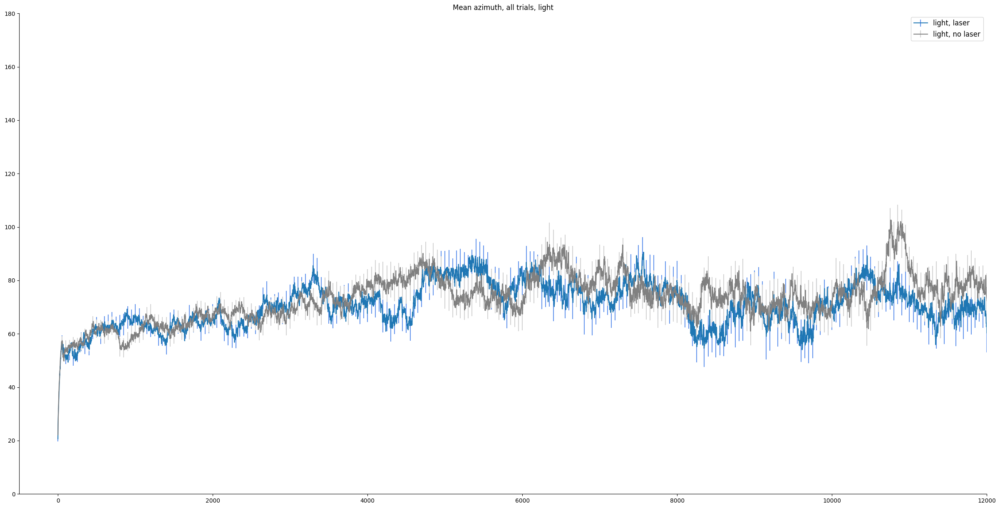

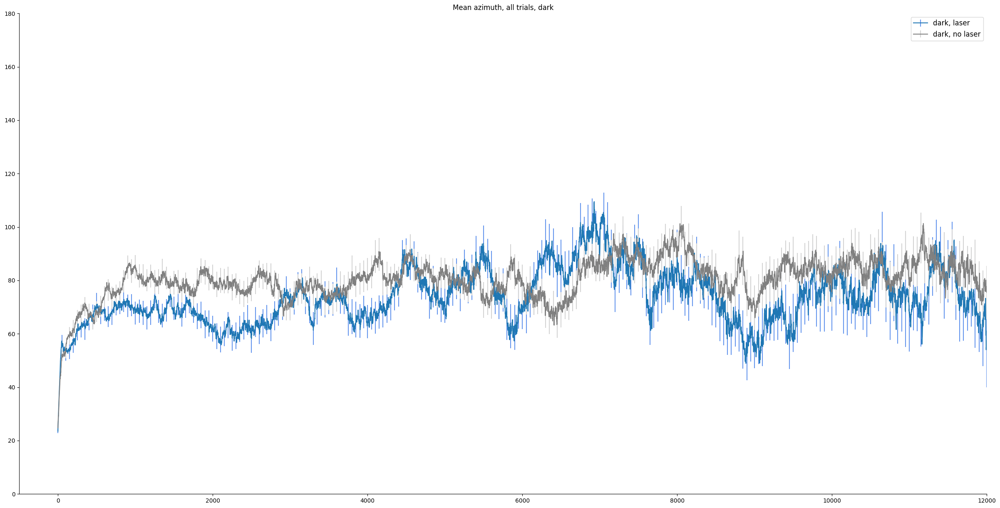

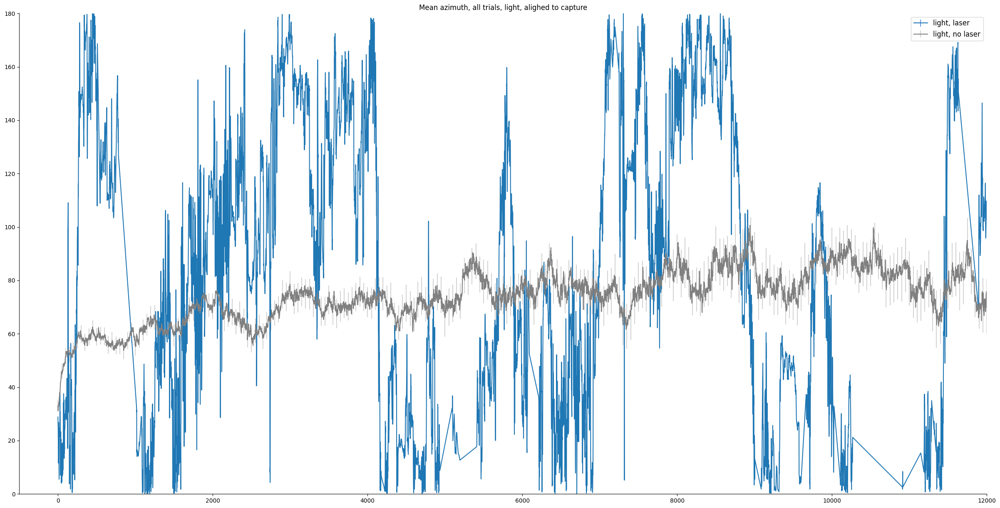

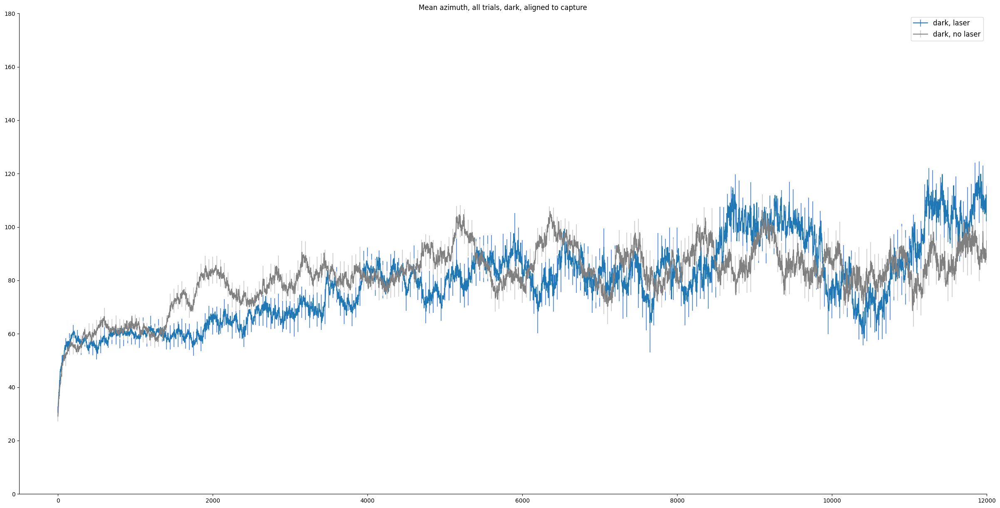

In [259]:
plt.figure(figsize=(30,15))
labels=['light, laser', 'light, no laser']
plt.errorbar(np.arange(0,len(meanaz_cond1l)), meanaz_cond1l, yerr=semaz_cond1l,errorevery=50, ecolor='cornflowerblue')
plt.xlim(-500,12000)
plt.ylim(0,180)
# plt.fill_between(
plt.errorbar(np.arange(0,len(meanaz_cond1nl)), meanaz_cond1nl, yerr=semaz_cond1nl,errorevery=50, color='grey', ecolor='lightgrey')
plt.xlim(-500,12000)
plt.ylim(0,180)
sns.despine()
plt.legend(labels=labels, fontsize='large')
# plt.xlim(20000,30000)
plt.title('Mean azimuth, all trials, light')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanaz_light_successes_new.pdf')


plt.figure(figsize=(30,15))
labels=['dark, laser', 'dark, no laser']
plt.errorbar(np.arange(0,len(meanaz_cond2l)), meanaz_cond2l, yerr=semaz_cond2l,errorevery=50, ecolor='cornflowerblue')
plt.xlim(-500,12000)
plt.ylim(0,180)
# plt.fill_between(
plt.errorbar(np.arange(0,len(meanaz_cond2nl)), meanaz_cond2nl, yerr=semaz_cond2nl,errorevery=50, color='grey', ecolor='lightgrey')
plt.xlim(-500,12000)
plt.ylim(0,180)
sns.despine()
plt.legend(labels=labels, fontsize='large')
# plt.xlim(20000,30000)
plt.title('Mean azimuth, all trials, dark')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanaz_dark_successes_new.pdf')

plt.figure(figsize=(30,15))
labels=['light, laser', 'light, no laser']
plt.errorbar(np.arange(0,len(meanaz_cond1l_rev)), meanaz_cond1l_rev, yerr=semaz_cond1l_rev,errorevery=50, ecolor='cornflowerblue')
plt.xlim(-500,12000)
plt.ylim(0,180)
# plt.fill_between(
plt.errorbar(np.arange(0,len(meanaz_cond1nl_rev)), meanaz_cond1nl_rev, yerr=semaz_cond1nl_rev,errorevery=50, color='grey', ecolor='lightgrey')
plt.xlim(-500,12000)
plt.ylim(0,180)
sns.despine()
plt.legend(labels=labels, fontsize='large')
# plt.xlim(20000,30000)
plt.title('Mean azimuth, all trials, light, alighed to capture')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanaz_light_successes_capture.pdf')


plt.figure(figsize=(30,15))
labels=['dark, laser', 'dark, no laser']
plt.errorbar(np.arange(0,len(meanaz_cond2l_rev)), meanaz_cond2l_rev, yerr=semaz_cond2l_rev,errorevery=50, ecolor='cornflowerblue')
plt.xlim(-500,12000)
plt.ylim(0,180)
# plt.fill_between(
plt.errorbar(np.arange(0,len(meanaz_cond2nl_rev)), meanaz_cond2nl_rev, yerr=semaz_cond2nl_rev,errorevery=50, color='grey', ecolor='lightgrey')
plt.xlim(-500,12000)
plt.ylim(0,180)
sns.despine()
plt.legend(labels=labels, fontsize='large')
# plt.xlim(20000,30000)
plt.title('Mean azimuth, all trials, dark, aligned to capture')
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanaz_dark_successes_capture.pdf')

Text(0.5, 1.0, 'Mean cricket spd, all trials, dark')

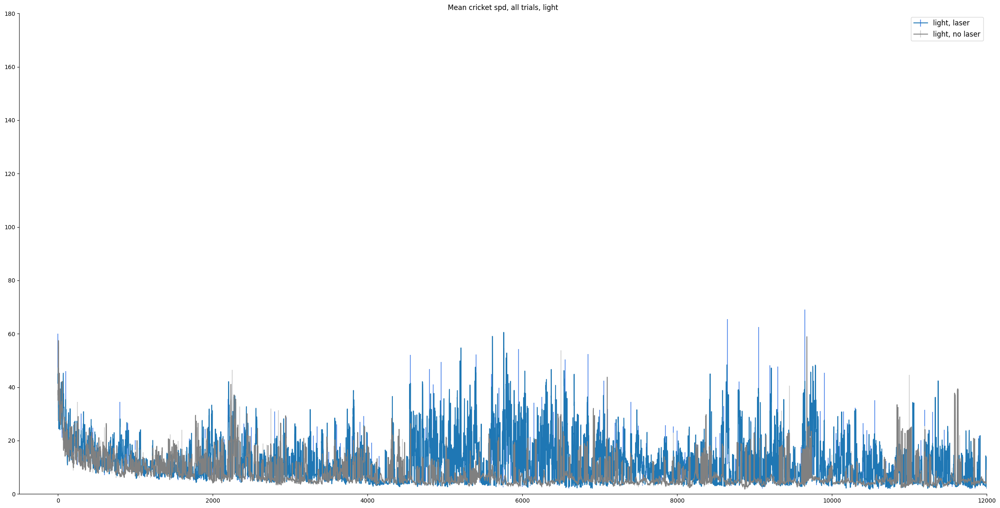

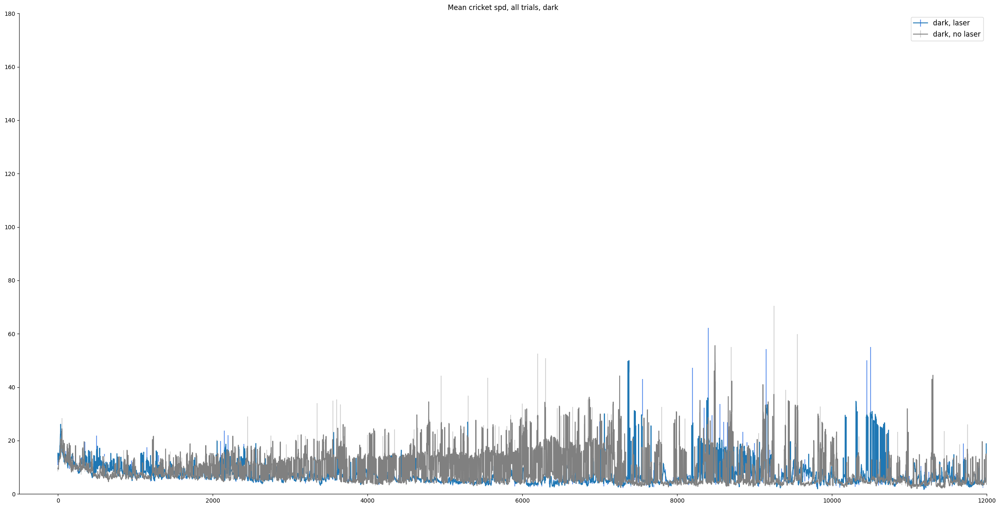

In [37]:
plt.figure(figsize=(30,15))
labels=['light, laser', 'light, no laser']
plt.errorbar(np.arange(0,len(meancrkspd_cond1l)), meancrkspd_cond1l, yerr=semcrkspd_cond1l,errorevery=50, ecolor='cornflowerblue')
plt.xlim(-500,12000)
plt.ylim(0,180)
# plt.fill_between(
plt.errorbar(np.arange(0,len(meancrkspd_cond1nl)), meancrkspd_cond1nl, yerr=semcrkspd_cond1nl,errorevery=50, color='grey', ecolor='lightgrey')
plt.xlim(-500,12000)
plt.ylim(0,180)
sns.despine()
plt.legend(labels=labels, fontsize='large')
# plt.xlim(20000,30000)
plt.title('Mean cricket spd, all trials, light')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanaz_light_successes_new.pdf')


plt.figure(figsize=(30,15))
labels=['dark, laser', 'dark, no laser']
plt.errorbar(np.arange(0,len(meancrkspd_cond2l)), meancrkspd_cond2l, yerr=semcrkspd_cond2l,errorevery=50, ecolor='cornflowerblue')
plt.xlim(-500,12000)
plt.ylim(0,180)
# plt.fill_between(
plt.errorbar(np.arange(0,len(meancrkspd_cond2nl)), meancrkspd_cond2nl, yerr=semcrkspd_cond2nl,errorevery=50, color='grey', ecolor='lightgrey')
plt.xlim(-500,12000)
plt.ylim(0,180)
sns.despine()
plt.legend(labels=labels, fontsize='large')
# plt.xlim(20000,30000)
plt.title('Mean cricket spd, all trials, dark')
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/meanaz_dark_successes_new.pdf')


In [45]:
# fig, ax=plt.subplots(figsize=(10,8))
labels=['light, laser', 'light, no laser']

test_flat=cdc(cond1_l_crkspd)
test_flat=test_flat.to_numpy().flatten()
test_flat=pd.DataFrame(test_flat)
test_flat=test_flat.astype(float)

test_flat1=cdc(cond1_nl_crkspd)
test_flat1=test_flat1.to_numpy().flatten()
test_flat1=pd.DataFrame(test_flat1)
test_flat1=test_flat1.astype(float)

# hist=test_flat.hist(bins=75, grid=False, ax=ax, alpha=0.75)
# hist=test_flat1.hist(bins=75, grid=False, color='grey', ax=ax, alpha=0.75)
# plt.title('Range Distribution, all trials, light')
# plt.legend(labels=labels)
# sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/histrange_light_successes.pdf')


fig2=plt.figure(figsize=(10,8))
sns.kdeplot(data=test_flat.squeeze(), fill=True, bw_adjust=0.5)
sns.kdeplot(data=test_flat1.squeeze(), color='grey', fill=True,bw_adjust=0.5)
plt.legend(labels=labels)
plt.title('Cricket Speed Distribution, all trials, light')
plt.xlim(0, 60)
plt.xticks(np.arange(0, 70,10))
plt.ylim(0,0.13)
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/kderange_light_successes.pdf')


# fig, ax=plt.subplots(figsize=(10,8))
labels=['dark, laser', 'dark, no laser']

test_flat2=cdc(cond2_l_crkspd)
test_flat2=test_flat2.to_numpy().flatten()
test_flat2=pd.DataFrame(test_flat2)
test_flat2=test_flat2.astype(float)

test_flat12=cdc(cond2_nl_crkspd)
test_flat12=test_flat12.to_numpy().flatten()
test_flat12=pd.DataFrame(test_flat12)
test_flat12=test_flat12.astype(float)

# hist=test_flat2.hist(bins=75, grid=False, ax=ax, alpha=0.75)
# hist=test_flat12.hist(bins=75, grid=False, color='grey', ax=ax, alpha=0.75)
# plt.title('Range Distribution, all trials, dark')
# plt.legend(labels=labels)
# sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/histrange_dark_successes.pdf')


fig2=plt.figure(figsize=(10,8))
sns.kdeplot(data=test_flat2.squeeze(), fill=True, color='#030aa7', bw_adjust=0.5)
sns.kdeplot(data=test_flat12.squeeze(), fill=True,color='#000000',bw_adjust=0.5)
plt.legend(labels=labels)
plt.title('Cricket Speed Distribution, all trials, dark')
plt.xlim(0, 60)
plt.xticks(np.arange(0, 70,10))
plt.ylim(0,0.13)
sns.despine()

NameError: name 'cond1_l_crkspd' is not defined

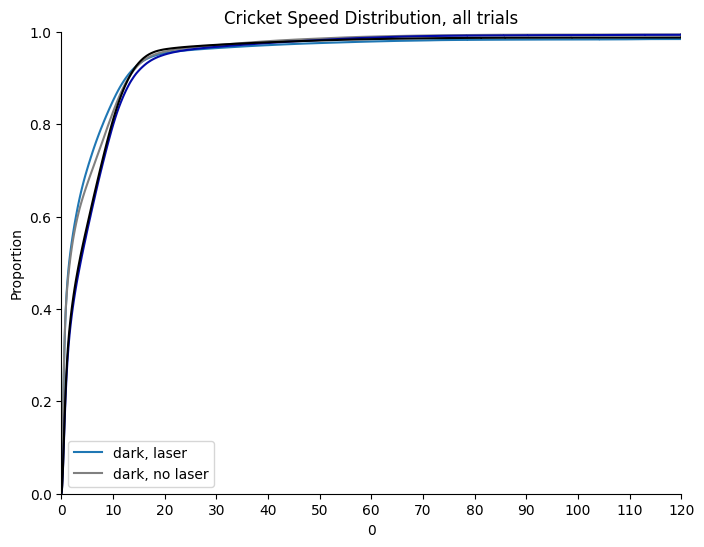

In [47]:
fig2=plt.figure(figsize=(8,6))
sns.ecdfplot(data=test_flat.squeeze())
sns.ecdfplot(data=test_flat1.squeeze(), color='grey')
sns.ecdfplot(data=test_flat2.squeeze(), color='#030aa7')
sns.ecdfplot(data=test_flat12.squeeze(),color='#000000')
plt.legend(labels=labels)
plt.title('Cricket Speed Distribution, all trials')
plt.xlim(0, 120)
plt.xticks(np.arange(0, 130,10))
# # plt.ylim(0,0.09)
sns.despine()

# fig2=plt.figure(figsize=(10,8))
# sns.ecdfplot(data=test_flat2.squeeze(), color='#030aa7')
# sns.ecdfplot(data=test_flat12.squeeze(),color='#000000')
# plt.legend(labels=labels)
# plt.title('Cricket Speed Distribution, all trials, dark')
# plt.xlim(0, 120)
# plt.xticks(np.arange(0, 130,10))
# # plt.ylim(0,0.09)
# sns.despine()

['#030aa7', '#000000']

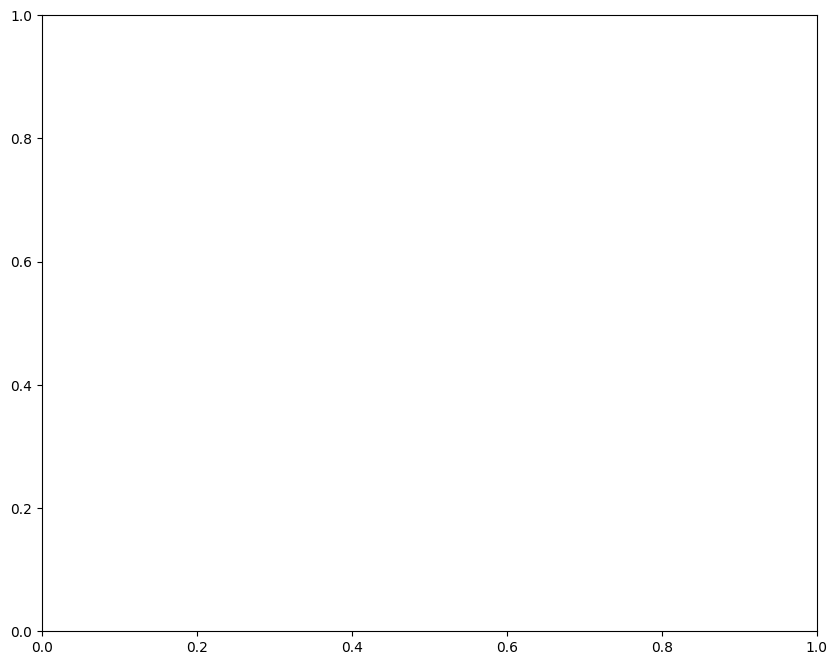

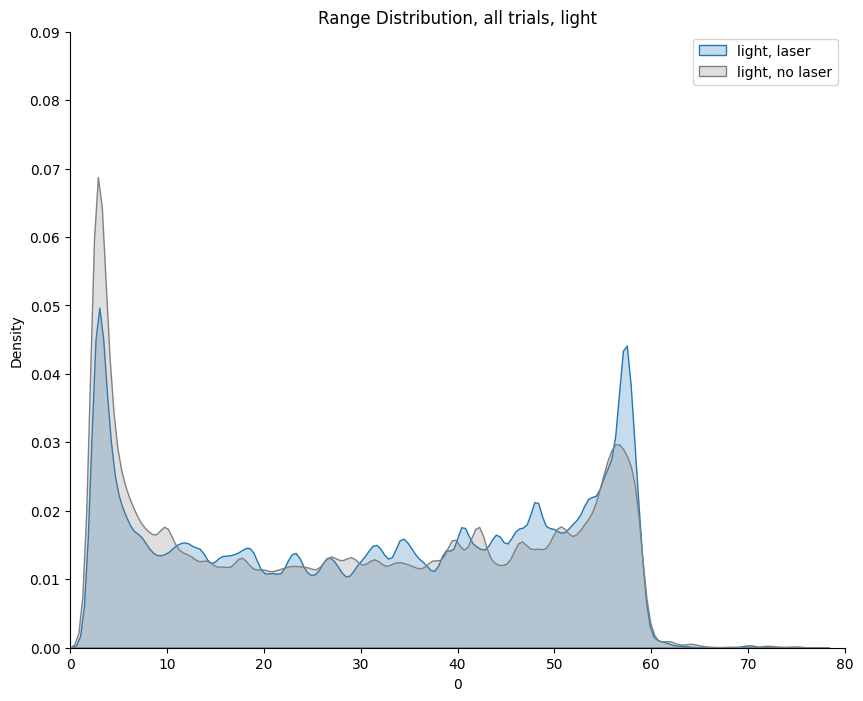

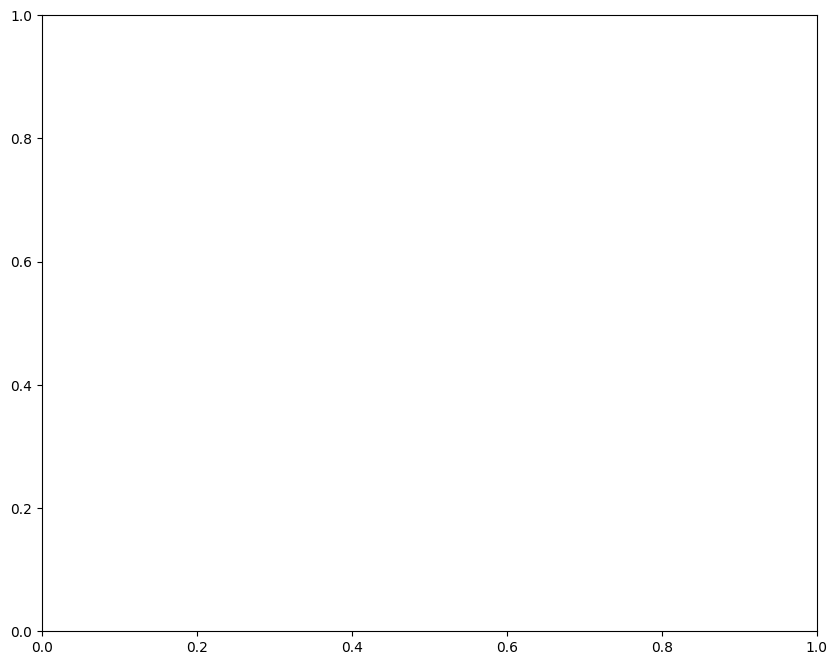

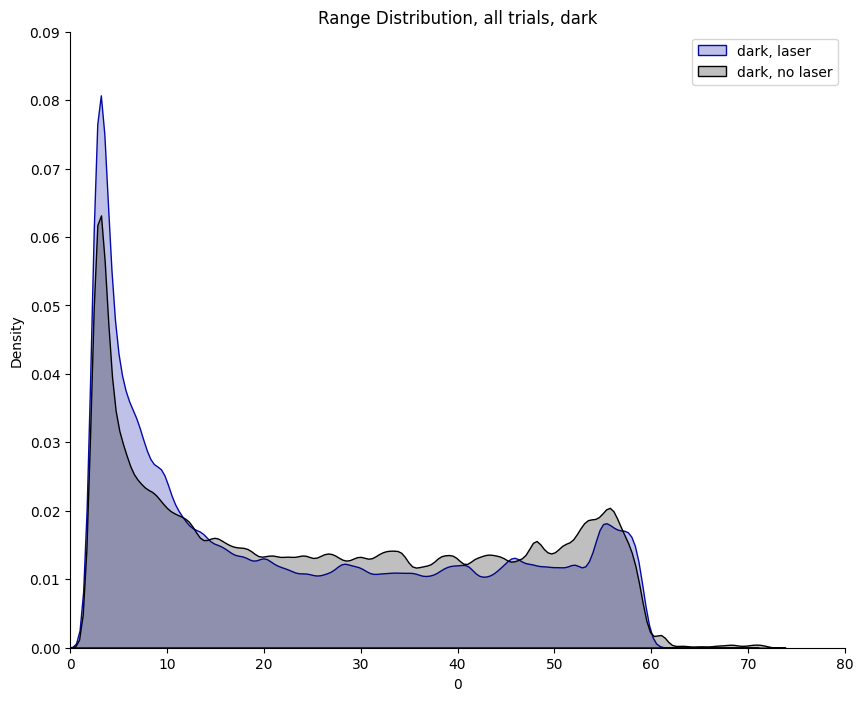

In [245]:
fig, ax=plt.subplots(figsize=(10,8))
labels=['light, laser', 'light, no laser']

test_flat=cdc(cond1_l_ranges)
test_flat=test_flat.to_numpy().flatten()
test_flat=pd.DataFrame(test_flat)
test_flat=test_flat.astype(float)

test_flat1=cdc(cond1_nl_ranges)
test_flat1=test_flat1.to_numpy().flatten()
test_flat1=pd.DataFrame(test_flat1)
test_flat1=test_flat1.astype(float)

# hist=test_flat.hist(bins=75, grid=False, ax=ax, alpha=0.75)
# hist=test_flat1.hist(bins=75, grid=False, color='grey', ax=ax, alpha=0.75)
# plt.title('Range Distribution, all trials, light')
# plt.legend(labels=labels)
# sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/histrange_light_successes.pdf')


fig2=plt.figure(figsize=(10,8))
sns.kdeplot(data=test_flat.squeeze(), fill=True, bw_adjust=0.5)
sns.kdeplot(data=test_flat1.squeeze(), color='grey', fill=True,bw_adjust=0.5)
plt.legend(labels=labels)
plt.title('Range Distribution, all trials, light')
plt.xlim(0, 80)
plt.xticks(np.arange(0, 90,10))
plt.ylim(0,0.09)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/kderange_light_successes.pdf')


fig, ax=plt.subplots(figsize=(10,8))
labels=['dark, laser', 'dark, no laser']

test_flat2=cdc(cond2_l_ranges)
test_flat2=test_flat2.to_numpy().flatten()
test_flat2=pd.DataFrame(test_flat2)
test_flat2=test_flat2.astype(float)

test_flat12=cdc(cond2_nl_ranges)
test_flat12=test_flat12.to_numpy().flatten()
test_flat12=pd.DataFrame(test_flat12)
test_flat12=test_flat12.astype(float)

# hist=test_flat2.hist(bins=75, grid=False, ax=ax, alpha=0.75)
# hist=test_flat12.hist(bins=75, grid=False, color='grey', ax=ax, alpha=0.75)
# plt.title('Range Distribution, all trials, dark')
# plt.legend(labels=labels)
# sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/histrange_dark_successes.pdf')


fig2=plt.figure(figsize=(10,8))
sns.kdeplot(data=test_flat2.squeeze(), fill=True, color='#030aa7', bw_adjust=0.5)
sns.kdeplot(data=test_flat12.squeeze(), fill=True,color='#000000',bw_adjust=0.5)
plt.legend(labels=labels)
plt.title('Range Distribution, all trials, dark')
plt.xlim(0, 80)
plt.xticks(np.arange(0, 90,10))
plt.ylim(0,0.09)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/kderange_dark_successes.pdf')


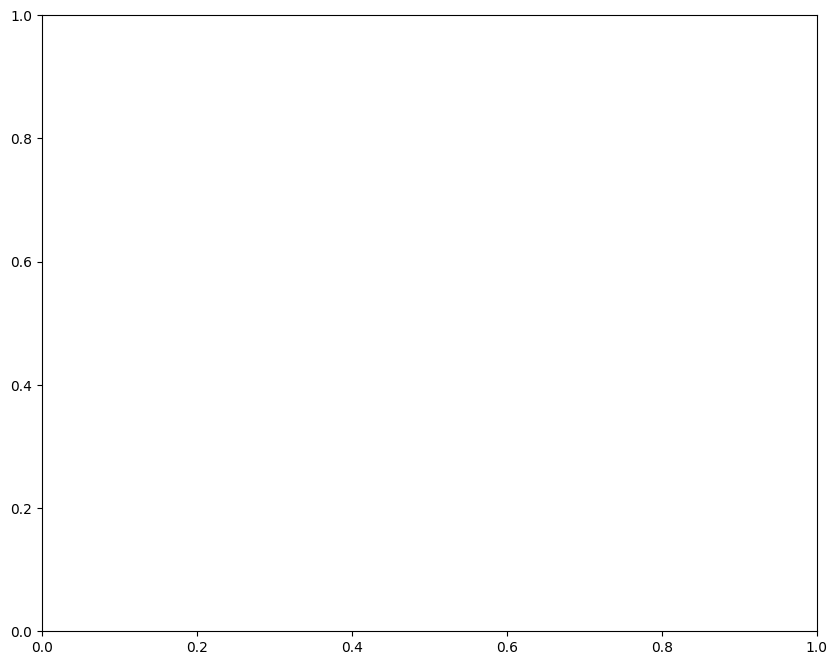

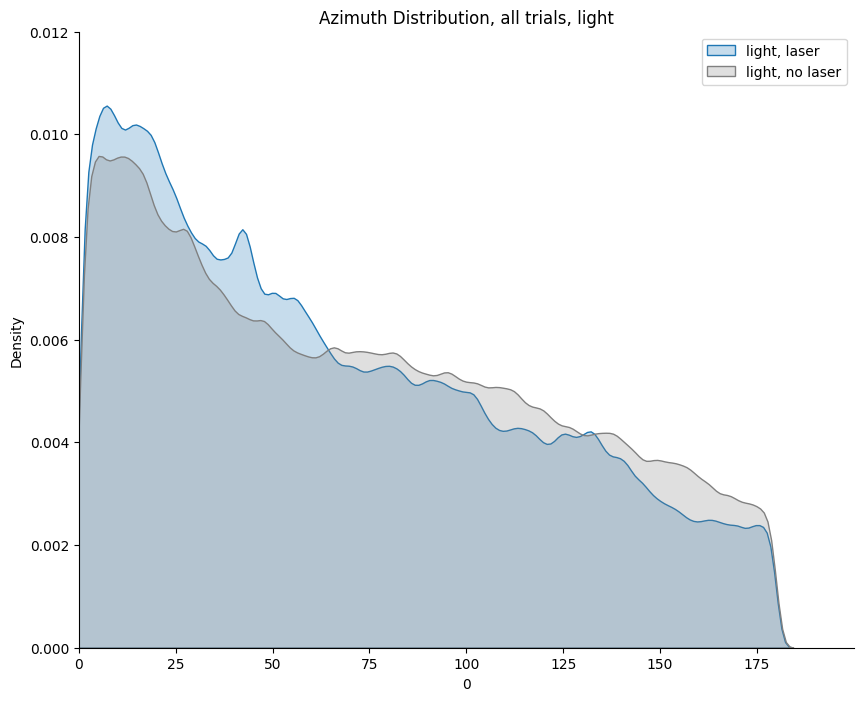

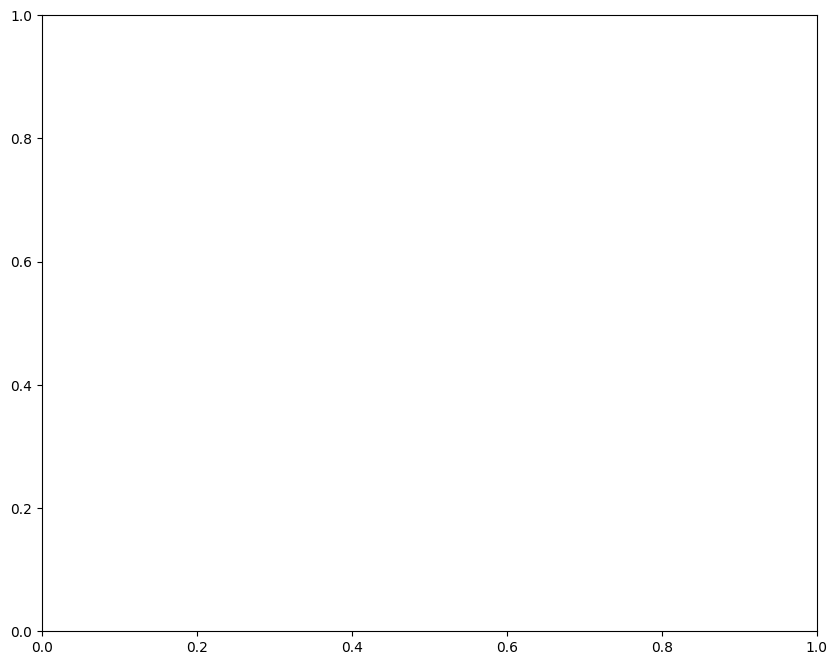

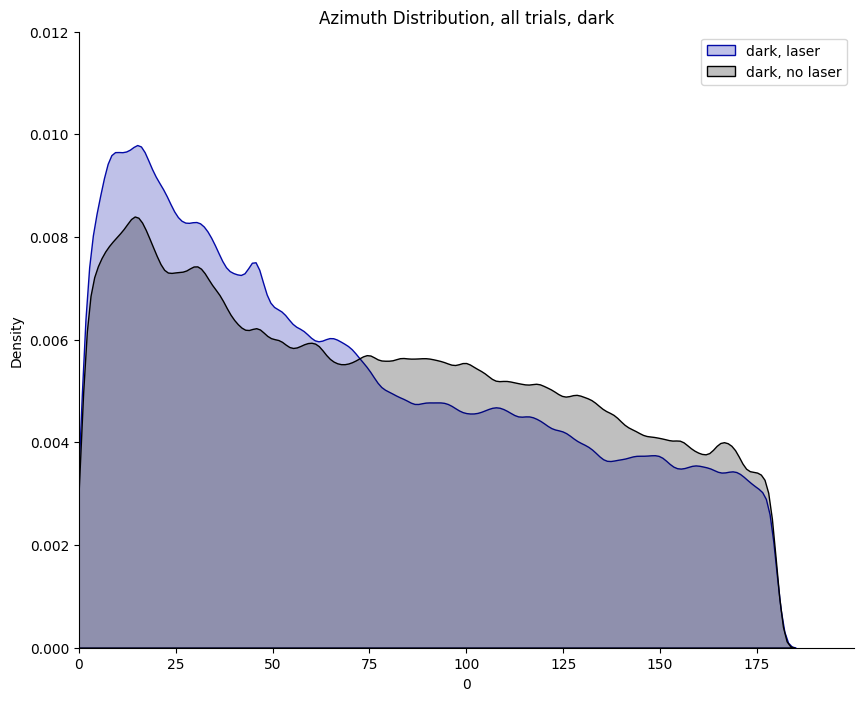

In [252]:
fig, ax=plt.subplots(figsize=(10,8))
labels=['light, laser', 'light, no laser']

test_flat=cdc(cond1_l_az)
test_flat=test_flat.to_numpy().flatten()
test_flat=pd.DataFrame(test_flat)
test_flat=test_flat.astype(float)

test_flat1=cdc(cond1_nl_az)
test_flat1=test_flat1.to_numpy().flatten()
test_flat1=pd.DataFrame(test_flat1)
test_flat1=test_flat1.astype(float)

# hist=test_flat.hist(bins=75, grid=False, ax=ax, alpha=0.75)
# hist=test_flat1.hist(bins=75, grid=False, color='grey', ax=ax, alpha=0.75)
# plt.title('Azimuth Distribution, all trials, light')
# plt.legend(labels=labels)
# sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/histaz_light_successes.pdf')

fig2=plt.figure(figsize=(10,8))
sns.kdeplot(data=test_flat.squeeze(), fill=True, bw_adjust=0.5)
sns.kdeplot(data=test_flat1.squeeze(), color='grey',fill=True,bw_adjust=0.5)
plt.legend(labels=labels)
plt.title('Azimuth Distribution, all trials, light')
plt.xlim(0,200)
plt.xticks(np.arange(0,200,25))
plt.ylim(0,0.012)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/kdeaz_light_successes.pdf')

fig, ax=plt.subplots(figsize=(10,8))
labels=['dark, laser', 'dark, no laser']

test_flat2=cdc(cond2_l_az)
test_flat2=test_flat2.to_numpy().flatten()
test_flat2=pd.DataFrame(test_flat2)
test_flat2=test_flat2.astype(float)

test_flat12=cdc(cond2_nl_az)
test_flat12=test_flat12.to_numpy().flatten()
test_flat12=pd.DataFrame(test_flat12)
test_flat12=test_flat12.astype(float)

# hist=test_flat2.hist(bins=75, grid=False, ax=ax, alpha=0.75)
# hist=test_flat12.hist(bins=75, grid=False, color='grey', ax=ax, alpha=0.75)
# plt.title('Azimuth Distribution, all trials, dark')
# plt.legend(labels=labels)
# sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/histaz_dark_successes.pdf')

fig2=plt.figure(figsize=(10,8))
sns.kdeplot(data=test_flat2.squeeze(), fill=True, color='#030aa7',bw_adjust=0.5)
sns.kdeplot(data=test_flat12.squeeze(),color='#000000',  fill=True,bw_adjust=0.5)
plt.legend(labels=labels)
plt.title('Azimuth Distribution, all trials, dark')
plt.xlim(0,200)
plt.xticks(np.arange(0,200,25))
plt.ylim(0,0.012)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/kdeaz_dark_successes.pdf')


In [ ]:
df0893
df0895
df0896
df0897
df0898
df1337
df1429
df1430

In [36]:
def success_failure(df,mouse_list):
    ## read in whole df and segment to what you would want in terms of conditions, removing too long trials etc
    ## for now run this with conds_keep already generated, this would mean it relies on something else, but things are cleaned up

    ##separate out into different mouse specific dfs and make successrate plots
    for i in mouse_list:
        mousedf=df[df['filename'].str.contains('{}'.format(i))]
        
        observations=cdc(mousedf)
        observations=observations[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
        observations['absoluteintercept']=observations['cricketdrop']+observations['interceptframe']
        
        cond1=observations.iloc[np.where(observations['condition']=='1')]
        cond1_laser=cond1.iloc[np.where(cond1['laser_value']==1)]
        cond1_nolaser=cond1.iloc[np.where(cond1['laser_value']==0)]

        cond2=observations.iloc[np.where(observations['condition']=='2')]
        cond2_laser=cond2.iloc[np.where(cond2['laser_value']==1)]
        cond2_nolaser=cond2.iloc[np.where(cond2['laser_value']==0)]
        
        
        total_c1l=len(cond1_laser['capduration'])
        failures_c1l=cond1_laser['capduration'].isna().sum()
        successes_c1l=cond1_laser['capduration'].notna().sum()

        total_c1nl=len(cond1_nolaser['capduration'])
        failures_c1nl=cond1_nolaser['capduration'].isna().sum()
        successes_c1nl=cond1_nolaser['capduration'].notna().sum()

        total_c2l=len(cond2_laser['capduration'])
        failures_c2l=cond2_laser['capduration'].isna().sum()
        successes_c2l=cond2_laser['capduration'].notna().sum()

        total_c2nl=len(cond2_nolaser['capduration'])
        failures_c2nl=cond2_nolaser['capduration'].isna().sum()
        successes_c2nl=cond2_nolaser['capduration'].notna().sum()

        successrate_c1l=(successes_c1l/total_c1l)*100
        successrate_c1l=np.asarray(successrate_c1l)
        print(successrate_c1l)
        successrate_c1nl=(successes_c1nl/total_c1nl)*100
        successrate_c1nl=np.asarray(successrate_c1nl)
        print(successrate_c1nl)
        successrate_c2l=(successes_c2l/total_c2l)*100
        successrate_c2l=np.asarray(successrate_c2l)
        print(successrate_c2l)
        successrate_c2nl=(successes_c2nl/total_c2nl)*100
        successrate_c2nl=np.asarray(successrate_c2nl)
        print(successrate_c2nl)
        
        successes=[successrate_c1l,successrate_c1nl,successrate_c2l,successrate_c2nl]
        print(successes)
        np.save('/Users/mollyshallow/Desktop/successes_mouse{}.npy'.format(i), successes)
        plt.figure()
        sns.barplot(data=successes)
        plt.title('Success Rate {}'.format(i))
        plt.xticks([0,1,2,3],['Light, Laser','Light, No Laser', 'Dark, Laser', 'Dark, No Laser'])
        sns.despine()
        plt.savefig('/Users/mollyshallow/Desktop/success_mouse{}.pdf'.format(i))



        failurerate_c1l=(failures_c1l/total_c1l)*100
        failurerate_c1l=np.asarray(failurerate_c1l)
        
        failurerate_c1nl=(failures_c1nl/total_c1nl)*100
        failurerate_c1nl=np.asarray(failurerate_c1nl)
        
        failurerate_c2l=(failures_c2l/total_c2l)*100
        failurerate_c2l=np.asarray(failurerate_c2l)
        
        failurerate_c2nl=(failures_c2nl/total_c2nl)*100
        failurerate_c2nl=np.asarray(failurerate_c2nl)
        
        failures=[failurerate_c1l,failurerate_c1nl,failurerate_c2l,failurerate_c2nl]
        np.save('/Users/mollyshallow/Desktop/failures_mouse{}.npy'.format(i), failures)
        plt.figure()
        sns.barplot(data=failures)
        plt.title('Failure Rate {}'.format(i))
        plt.xticks([0,1,2,3],['Light, Laser','Light, No Laser', 'Dark, Laser', 'Dark, No Laser'])
        sns.despine()
        plt.savefig('/Users/mollyshallow/Desktop/failure_mouse{}.pdf'.format(i))

In [37]:
mouse_list=['0893', '0895', '0896', '0897','0898', '1337', '1429', '1430']

93.10344827586206
92.3076923076923
97.05882352941177
96.96969696969697
[array(93.10344828), array(92.30769231), array(97.05882353), array(96.96969697)]
100.0
94.73684210526315
100.0
96.875
[array(100.), array(94.73684211), array(100.), array(96.875)]
91.42857142857143
85.71428571428571
100.0
90.69767441860465
[array(91.42857143), array(85.71428571), array(100.), array(90.69767442)]
100.0
100.0
97.36842105263158
100.0
[array(100.), array(100.), array(97.36842105), array(100.)]
100.0
100.0
100.0
100.0
[array(100.), array(100.), array(100.), array(100.)]
10.344827586206897
54.166666666666664
64.70588235294117
87.5
[array(10.34482759), array(54.16666667), array(64.70588235), array(87.5)]
100.0
100.0
100.0
93.10344827586206
[array(100.), array(100.), array(100.), array(93.10344828)]
93.33333333333333
89.65517241379311
100.0
78.94736842105263
[array(93.33333333), array(89.65517241), array(100.), array(78.94736842)]


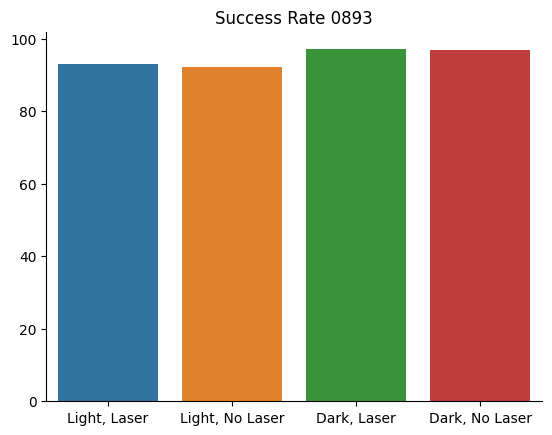

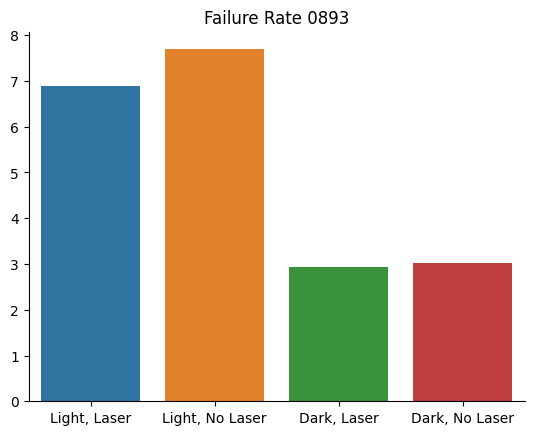

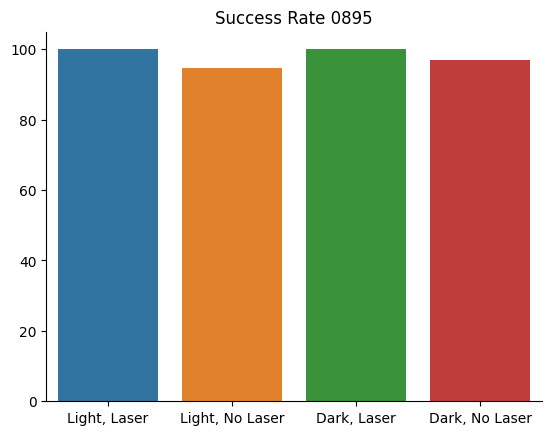

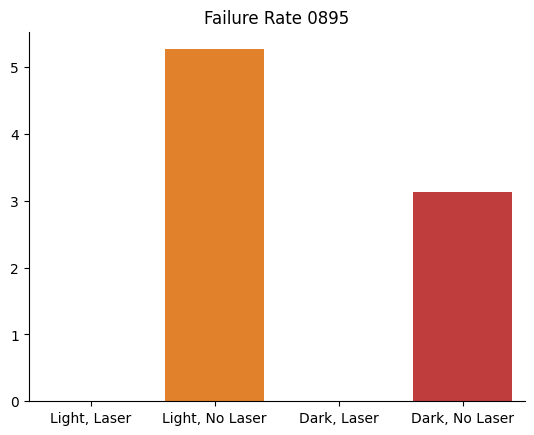

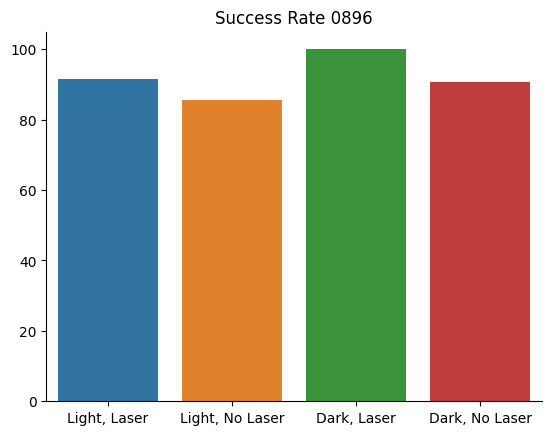

...

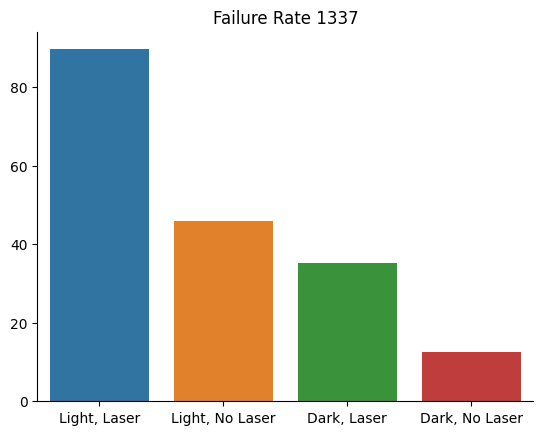

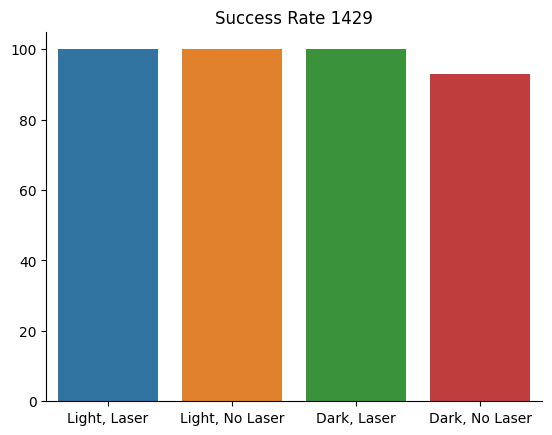

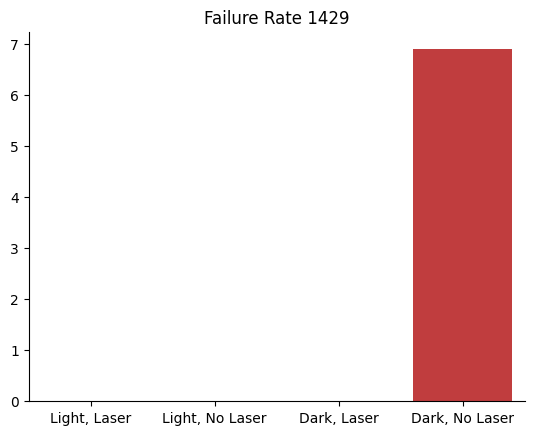

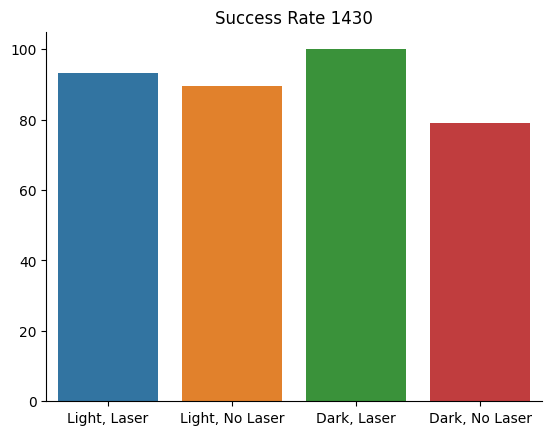

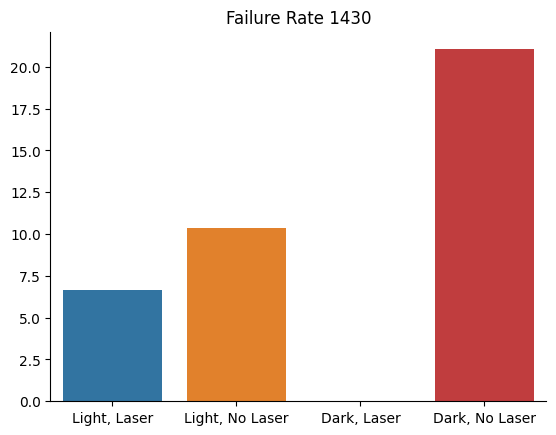

In [38]:
success_failure(conds_keep, mouse_list)

In [39]:
success0893=np.load('/Users/mollyshallow/Desktop/successes_mouse0893.npy')
success0895=np.load('/Users/mollyshallow/Desktop/successes_mouse0895.npy')
success0896=np.load('/Users/mollyshallow/Desktop/successes_mouse0896.npy')
success0897=np.load('/Users/mollyshallow/Desktop/successes_mouse0897.npy')
success0898=np.load('/Users/mollyshallow/Desktop/successes_mouse0898.npy')
success1337=np.load('/Users/mollyshallow/Desktop/successes_mouse1337.npy')
success1429=np.load('/Users/mollyshallow/Desktop/successes_mouse1429.npy')
success1430=np.load('/Users/mollyshallow/Desktop/successes_mouse1430.npy')


In [40]:
np.shape(success0893)

(4,)

In [71]:
allsuccess_1337=np.stack((success0893,success0895,success0896,success0897,success0898,success1429,success1430))

In [42]:
failure0893=np.load('/Users/mollyshallow/Desktop/failures_mouse0893.npy')
failure0895=np.load('/Users/mollyshallow/Desktop/failures_mouse0895.npy')
failure0896=np.load('/Users/mollyshallow/Desktop/failures_mouse0896.npy')
failure0897=np.load('/Users/mollyshallow/Desktop/failures_mouse0897.npy')
failure0898=np.load('/Users/mollyshallow/Desktop/failures_mouse0898.npy')
failure1337=np.load('/Users/mollyshallow/Desktop/failures_mouse1337.npy')
failure1429=np.load('/Users/mollyshallow/Desktop/failures_mouse1429.npy')
failure1430=np.load('/Users/mollyshallow/Desktop/failures_mouse1430.npy')


In [72]:
allfailure_1337=np.stack((failure0893,failure0895,failure0896,failure0897,failure0898,failure1429,failure1430))

In [49]:
allsuccess

array([[ 93.10344828,  92.30769231,  97.05882353,  96.96969697],
       [100.        ,  94.73684211, 100.        ,  96.875     ],
       [ 91.42857143,  85.71428571, 100.        ,  90.69767442],
       [100.        , 100.        ,  97.36842105, 100.        ],
       [100.        , 100.        , 100.        , 100.        ],
       [ 10.34482759,  54.16666667,  64.70588235,  87.5       ],
       [100.        , 100.        , 100.        ,  93.10344828],
       [ 93.33333333,  89.65517241, 100.        ,  78.94736842]])

In [50]:
np.shape(allsuccess)

(8, 4)

In [68]:
successmeans=np.mean(allsuccess, axis=0)
failuremeans=np.mean(allfailure, axis=0)
sem=stats.sem(allsuccess, axis=0)

In [70]:
print(successmeans)
print(failuremeans)

[86.02627258 89.5725824  94.89164087 93.01164851]
[13.97372742 10.4274176   5.10835913  6.98835149]


In [73]:
successmeans_1337=np.mean(allsuccess_1337, axis=0)
failuremeans_1337=np.mean(allfailure_1337, axis=0)

print(successmeans_1337)
print(failuremeans_1337)

[96.83790758 94.63057036 99.20389208 93.79902687]
[3.16209242 5.36942964 0.79610792 6.20097313]


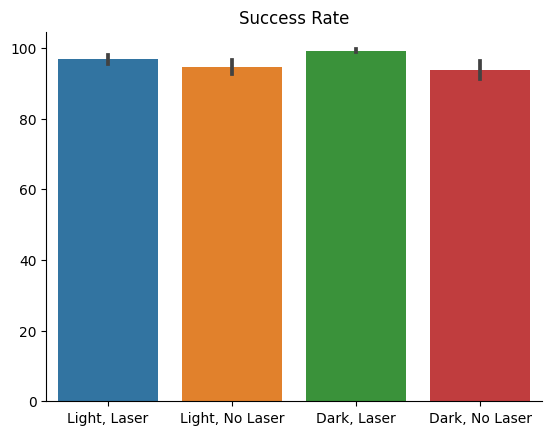

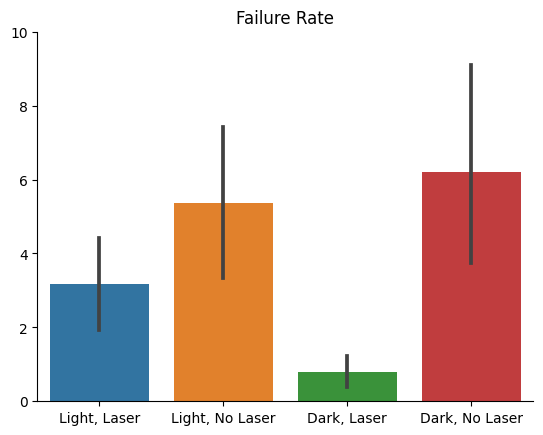

In [61]:
plt.figure()
sns.barplot(data=allsuccess, ci=68)
plt.title('Success Rate')
# plt.ylim(0,110)
plt.yticks(np.arange(0,110,20))
plt.xticks([0,1,2,3],['Light, Laser','Light, No Laser', 'Dark, Laser', 'Dark, No Laser'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/mean_success_no1337.pdf')

plt.figure()
sns.barplot(data=allfailure, ci=68)
plt.title('Failure Rate')
plt.yticks(np.arange(0,12,2))
plt.xticks([0,1,2,3],['Light, Laser','Light, No Laser', 'Dark, Laser', 'Dark, No Laser'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/mean_failures_no1337.pdf')

In [31]:
import os
os.path.isfile('/Users/mollyshallow/Desktop/successes_mouse0893.npy')

True

In [22]:
observations0893=cdc(df0893)
observations0893=observations0893[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations0893['absoluteintercept']=observations0893['cricketdrop']+observations0893['interceptframe']

cleaned_observations0893= observations0893[observations0893['capduration'].notna()]

observations0895=cdc(df0895)
observations0895=observations0895[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations0895['absoluteintercept']=observations0895['cricketdrop']+observations0895['interceptframe']

cleaned_observations0895= observations0895[observations0895['capduration'].notna()]

observations0896=cdc(df0896)
observations0896=observations0896[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations0896['absoluteintercept']=observations0896['cricketdrop']+observations0896['interceptframe']

cleaned_observations0896= observations0896[observations0896['capduration'].notna()]

observations0897=cdc(df0897)
observations0897=observations0897[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations0897['absoluteintercept']=observations0897['cricketdrop']+observations0897['interceptframe']

cleaned_observations0897= observations0897[observations0897['capduration'].notna()]

observations0898=cdc(df0898)
observations0898=observations0898[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations0898['absoluteintercept']=observations0898['cricketdrop']+observations0898['interceptframe']

cleaned_observations0898= observations0898[observations0898['capduration'].notna()]

observations1337=cdc(df1337)
observations1337=observations1337[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations1337['absoluteintercept']=observations1337['cricketdrop']+observations1337['interceptframe']

cleaned_observations1337= observations1337[observations1337['capduration'].notna()]

observations1429=cdc(df1429)
observations1429=observations1429[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations1429['absoluteintercept']=observations1429['cricketdrop']+observations1429['interceptframe']

cleaned_observations1429= observations1429[observations1429['capduration'].notna()]

observations1430=cdc(df1430)
observations1430=observations1430[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
observations1430['absoluteintercept']=observations1430['cricketdrop']+observations1430['interceptframe']

cleaned_observations1430= observations1430[observations1430['capduration'].notna()]

In [23]:
cond10893=observations0893.iloc[np.where(observations0893['condition']=='1')]
cond1_laser0893=cond10893.iloc[np.where(cond10893['laser_value']==1)]
cond1_nolaser0893=cond10893.iloc[np.where(cond10893['laser_value']==0)]

cond20893=observations0893.iloc[np.where(observations0893['condition']=='2')]
cond2_laser0893=cond20893.iloc[np.where(cond20893['laser_value']==1)]
cond2_nolaser0893=cond20893.iloc[np.where(cond20893['laser_value']==0)]

cond10895=observations0895.iloc[np.where(observations0895['condition']=='1')]
cond1_laser0895=cond10895.iloc[np.where(cond10895['laser_value']==1)]
cond1_nolaser0895=cond10895.iloc[np.where(cond10895['laser_value']==0)]

cond20895=observations0895.iloc[np.where(observations0895['condition']=='2')]
cond2_laser0895=cond20895.iloc[np.where(cond20895['laser_value']==1)]
cond2_nolaser0895=cond20895.iloc[np.where(cond20895['laser_value']==0)]

cond10896=observations0896.iloc[np.where(observations0896['condition']=='1')]
cond1_laser0896=cond10896.iloc[np.where(cond10896['laser_value']==1)]
cond1_nolaser0896=cond10896.iloc[np.where(cond10896['laser_value']==0)]

cond20896=observations0896.iloc[np.where(observations0896['condition']=='2')]
cond2_laser0896=cond20896.iloc[np.where(cond20896['laser_value']==1)]
cond2_nolaser0896=cond20896.iloc[np.where(cond20896['laser_value']==0)]

cond10898=observations0898.iloc[np.where(observations0898['condition']=='1')]
cond1_laser0898=cond10898.iloc[np.where(cond10898['laser_value']==1)]
cond1_nolaser0898=cond10898.iloc[np.where(cond10898['laser_value']==0)]

cond20898=observations0898.iloc[np.where(observations0898['condition']=='2')]
cond2_laser0898=cond20898.iloc[np.where(cond20898['laser_value']==1)]
cond2_nolaser0898=cond20898.iloc[np.where(cond20898['laser_value']==0)]

cond11337=observations1337.iloc[np.where(observations1337['condition']=='1')]
cond1_laser1337=cond11337.iloc[np.where(cond11337['laser_value']==1)]
cond1_nolaser1337=cond11337.iloc[np.where(cond11337['laser_value']==0)]

cond21337=observations1337.iloc[np.where(observations1337['condition']=='2')]
cond2_laser1337=cond21337.iloc[np.where(cond21337['laser_value']==1)]
cond2_nolaser1337=cond21337.iloc[np.where(cond21337['laser_value']==0)]

cond11429=observations1429.iloc[np.where(observations1429['condition']=='1')]
cond1_laser1429=cond11429.iloc[np.where(cond11429['laser_value']==1)]
cond1_nolaser1429=cond11429.iloc[np.where(cond11429['laser_value']==0)]

cond21429=observations1429.iloc[np.where(observations1429['condition']=='2')]
cond2_laser1429=cond21429.iloc[np.where(cond21429['laser_value']==1)]
cond2_nolaser1429=cond21429.iloc[np.where(cond21429['laser_value']==0)]

cond11430=observations1430.iloc[np.where(observations1430['condition']=='1')]
cond1_laser1430=cond11430.iloc[np.where(cond11430['laser_value']==1)]
cond1_nolaser1430=cond11430.iloc[np.where(cond11430['laser_value']==0)]

cond21430=observations1430.iloc[np.where(observations1430['condition']=='2')]
cond2_laser1430=cond21430.iloc[np.where(cond21430['laser_value']==1)]
cond2_nolaser1430=cond21430.iloc[np.where(cond21430['laser_value']==0)]



In [119]:
def success_failure(df,mouse_list):
    ## read in whole df and segment to what you would want in terms of conditions, removing too long trials etc
    ## for now run this with conds_keep already generated, this would mean it relies on something else, but things are cleaned up

    ##separate out into different mouse specific dfs and make successrate plots
    for i in mouse_list:
        mousedf=df[df['filename'].str.contains('{}'.format(i))]
        
        observations=cdc(mousedf)
        observations=observations[['filename', 'condition', 'laser_value','dist','cricket_spd', 'mouse_spd', 'az', 'captureframe','cricketdrop','interceptframe', 'capduration']]
        observations['absoluteintercept']=observations['cricketdrop']+observations['interceptframe']
        
        cond1=observations.iloc[np.where(observations['condition']=='1')]
        cond1_laser=cond1.iloc[np.where(cond1['laser_value']==1)]
        cond1_nolaser=cond1.iloc[np.where(cond1['laser_value']==0)]

        cond2=observations.iloc[np.where(observations['condition']=='2')]
        cond2_laser=cond2.iloc[np.where(cond2['laser_value']==1)]
        cond2_nolaser=cond2.iloc[np.where(cond2['laser_value']==0)]
        
        
        total_c1l=len(cond1_laser['capduration'])
        failures_c1l=cond1_laser['capduration'].isna().sum()
        successes_c1l=cond1_laser['capduration'].notna().sum()

        total_c1nl=len(cond1_nolaser['capduration'])
        failures_c1nl=cond1_nolaser['capduration'].isna().sum()
        successes_c1nl=cond1_nolaser['capduration'].notna().sum()

        total_c2l=len(cond2_laser['capduration'])
        failures_c2l=cond2_laser['capduration'].isna().sum()
        successes_c2l=cond2_laser['capduration'].notna().sum()

        total_c2nl=len(cond2_nolaser['capduration'])
        failures_c2nl=cond2_nolaser['capduration'].isna().sum()
        successes_c2nl=cond2_nolaser['capduration'].notna().sum()

        successrate_c1l=(successes_c1l/total_c1l)*100
        # print(type(successrate_c1l))
        successrate_c1l=np.asarray(successrate_c1l)
        # print(successrate_c1l)
        successrate_c1nl=(successes_c1nl/total_c1nl)*100
        successrate_c1nl=np.asarray(successrate_c1nl)
        # print(successrate_c1nl)
        successrate_c2l=(successes_c2l/total_c2l)*100
        successrate_c2l=np.asarray(successrate_c2l)
        # print(successrate_c2l)
        successrate_c2nl=(successes_c2nl/total_c2nl)*100
        successrate_c2nl=np.asarray(successrate_c2nl)
        # print(successrate_c2nl)
        
        successes=successrate_c1l,successrate_c1nl,successrate_c2l,successrate_c2nl
        # print(successes)
        # print(type(successes))
        np.save('/Users/mollyshallow/Desktop/successes_mouse{}.npy'.format(i), successes)
        plt.figure()
        sns.barplot(data=successes)
        plt.title('Success Rate {}'.format(i))
        plt.xticks([0,1,2,3],['Light, Laser','Light, No Laser', 'Dark, Laser', 'Dark, No Laser'])
        sns.despine()



        failurerate_c1l=(failures_c1l/total_c1l)*100
        failurerate_c1l=np.asarray(failurerate_c1l)
        
        failurerate_c1nl=(failures_c1nl/total_c1nl)*100
        failurerate_c1nl=np.asarray(failurerate_c1nl)
        
        failurerate_c2l=(failures_c2l/total_c2l)*100
        failurerate_c2l=np.asarray(failurerate_c2l)
        
        failurerate_c2nl=(failures_c2nl/total_c2nl)*100
        failurerate_c2nl=np.asarray(failurerate_c2nl)
        
        failures=failurerate_c1l,failurerate_c1nl,failurerate_c2l,failurerate_c2nl
        # print(failures)
        # print(type(failures))
        np.save('/Users/mollyshallow/Desktop/failures_mouse{}.npy'.format(i), failures)
        plt.figure()
        sns.barplot(data=failures)
        plt.title('Failure Rate {}'.format(i))
        plt.xticks([0,1,2,3],['Light, Laser','Light, No Laser', 'Dark, Laser', 'Dark, No Laser'])
        sns.despine()


In [114]:
mouse_list=[893, 895, 896, 897, 898, 1337, 1429, 1430]

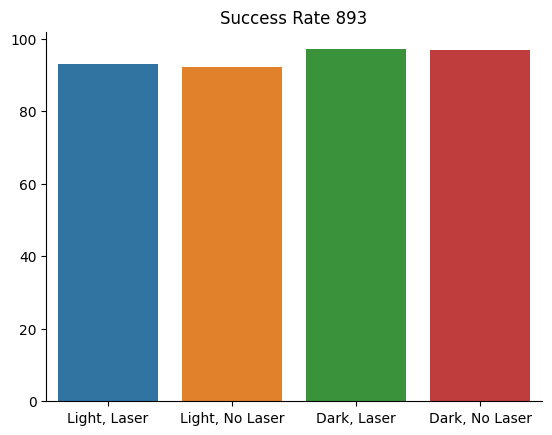

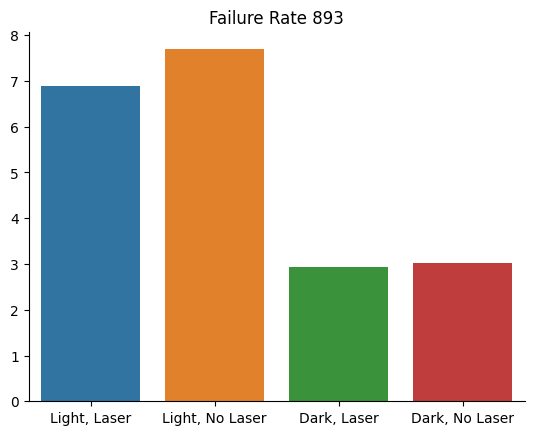

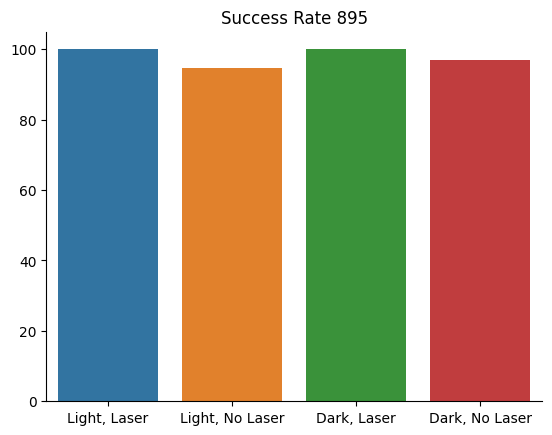

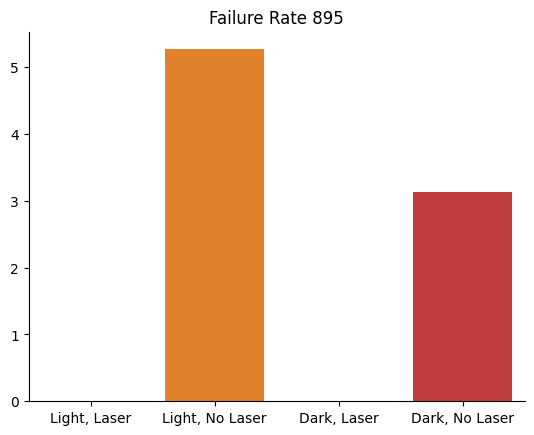

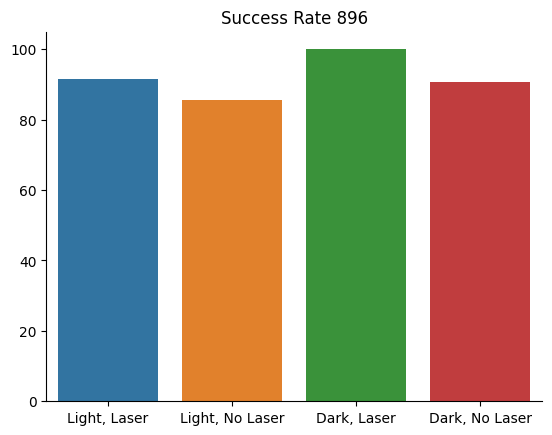

...

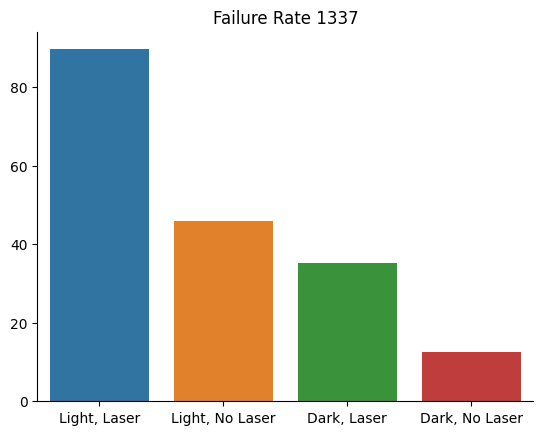

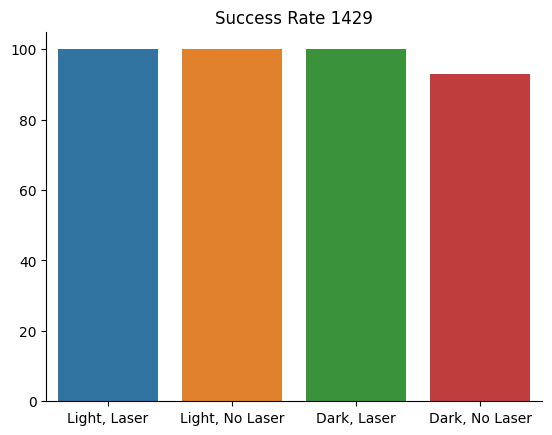

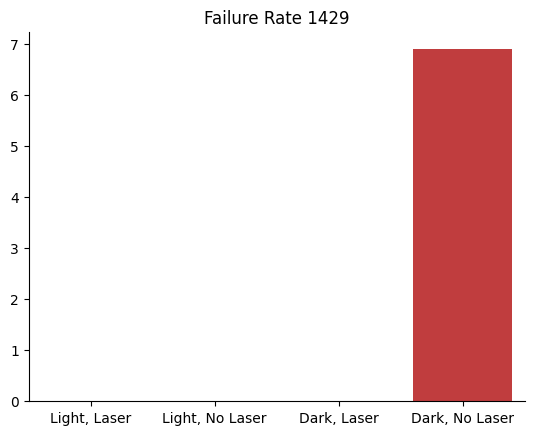

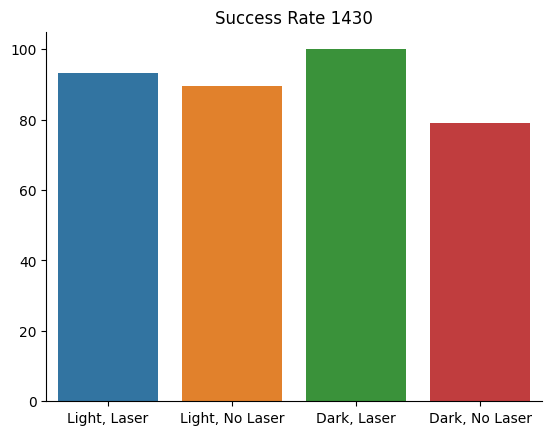

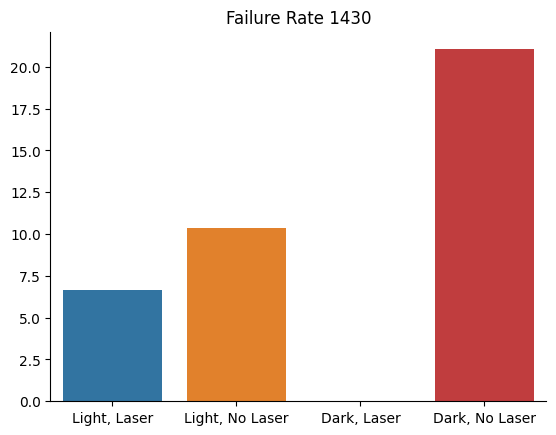

In [115]:
success_failure(conds_keep, mouse_list)

In [116]:
mouse0893=np.load('Users/mollyshallow/Desktop/successes_mouse893.npy')
# mouse0895=np.load('Users/mollyshallow/Desktop/successes_mouse0895.npy')
# mouse0896=np.load('Users/mollyshallow/Desktop/successes_mouse0896.npy')
# mouse0897=np.load('Users/mollyshallow/Desktop/successes_mouse0897.npy')
# mouse0898=np.load('Users/mollyshallow/Desktop/successes_mouse0898.npy')
# mouse1337=np.load('Users/mollyshallow/Desktop/successes_mouse1337.npy')
# mouse1429=np.load('Users/mollyshallow/Desktop/successes_mouse1429.npy')
# mouse1430=np.load('Users/mollyshallow/Desktop/successes_mouse1430.npy')


# mouse0893=np.load('Users/mollyshallow/Desktop/failures_mouse0893.npy')
# mouse0895=np.load('Users/mollyshallow/Desktop/failures_mouse0895.npy')
# mouse0896=np.load('Users/mollyshallow/Desktop/failures_mouse0896.npy')
# mouse0897=np.load('Users/mollyshallow/Desktop/failures_mouse0897.npy')
# mouse0898=np.load('Users/mollyshallow/Desktop/failures_mouse0898.npy')
# mouse1337=np.load('Users/mollyshallow/Desktop/failures_mouse1337.npy')
# mouse1429=np.load('Users/mollyshallow/Desktop/failures_mouse1429.npy')
# mouse1430=np.load('Users/mollyshallow/Desktop/failures_mouse1430.npy')



FileNotFoundError: [Errno 2] No such file or directory: 'Users/mollyshallow/Desktop/successes_mouse893.npy'

In [118]:
import os
# i=893
# test='/Users/mollyshallow/Desktop/successes_mouse{}.npy'.format(i)
# test

os.path.isfile('Users/mollyshallow/Desktop/successes_mouse893.npy')

False

In [168]:
baseline_l=observations.iloc[np.where(observations['condition']=='baseline_l')]
baseline_d=observations.iloc[np.where(observations['condition']=='baseline_d')]

71.4859437751004
82.93650793650794
28.514056224899598
17.063492063492063


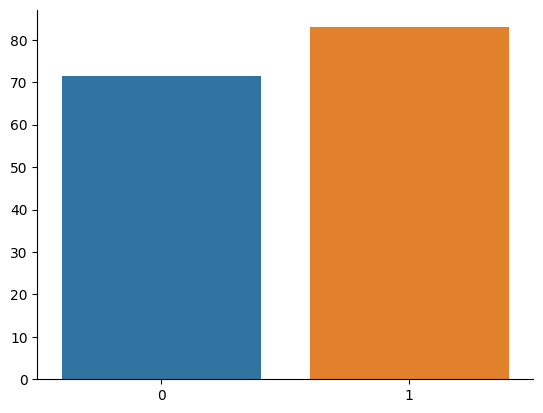

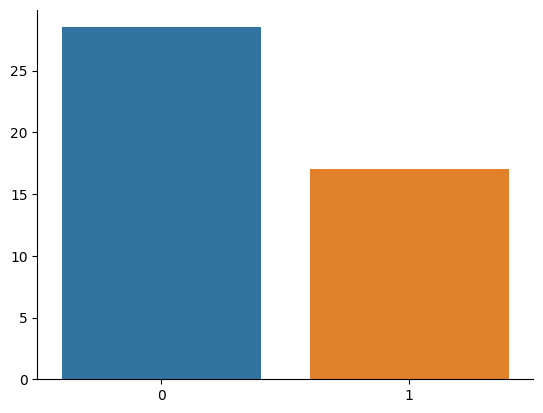

In [169]:
total_baseline_l=len(baseline_l['capduration'])
# print(total_c1l)
failures_baseline_l=baseline_l['capduration'].isna().sum()
# print(failures_c1l)
successes_baseline_l=baseline_l['capduration'].notna().sum()
# print(successes_c1l)

total_baseline_d=len(baseline_d['capduration'])
# print(total_c1nl)
failures_baseline_d=baseline_d['capduration'].isna().sum()
# print(failures_c1nl)
successes_baseline_d=baseline_d['capduration'].notna().sum()
# print(successes_c1nl)


successrate_baseline_l=(successes_baseline_l/total_baseline_l)*100
successrate_baseline_l=np.asarray(successrate_baseline_l)
print(successrate_baseline_l)
successrate_baseline_d=(successes_baseline_d/total_baseline_d)*100
successrate_baseline_d=np.asarray(successrate_baseline_d)
print(successrate_baseline_d)

plt.figure()
sns.barplot(data=[successrate_baseline_l,successrate_baseline_d])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/NCB021423/baseline_successrate.pdf')


failurerate_baseline_l=(failures_baseline_l/total_baseline_l)*100
failurerate_baseline_l=np.asarray(failurerate_baseline_l)
print(failurerate_baseline_l)
failurerate_baseline_d=(failures_baseline_d/total_baseline_d)*100
failurerate_baseline_d=np.asarray(failurerate_baseline_d)
print(failurerate_baseline_d)

plt.figure()
sns.barplot(data=[failurerate_baseline_l,failurerate_baseline_d])
sns.despine()
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/NCB021423/baseline_failurerate.pdf')

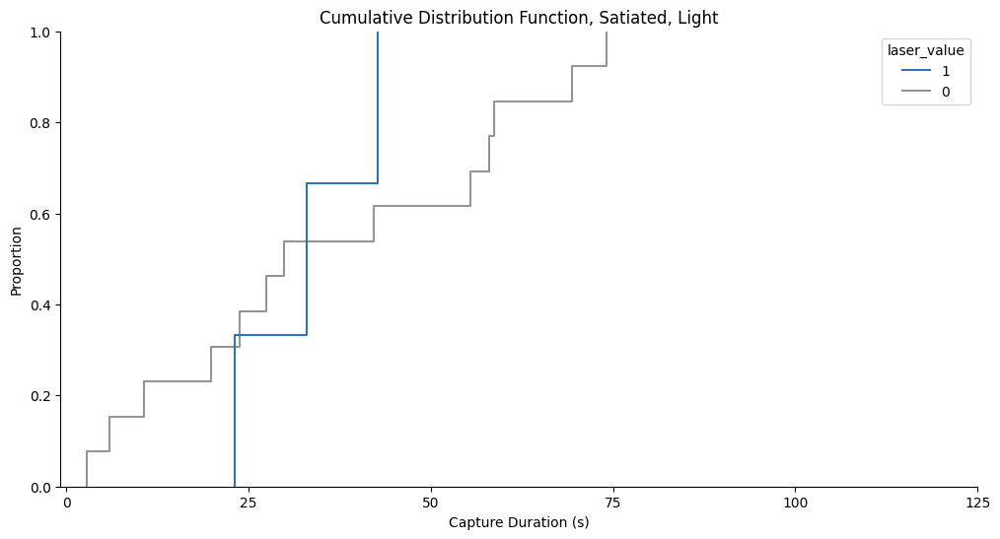

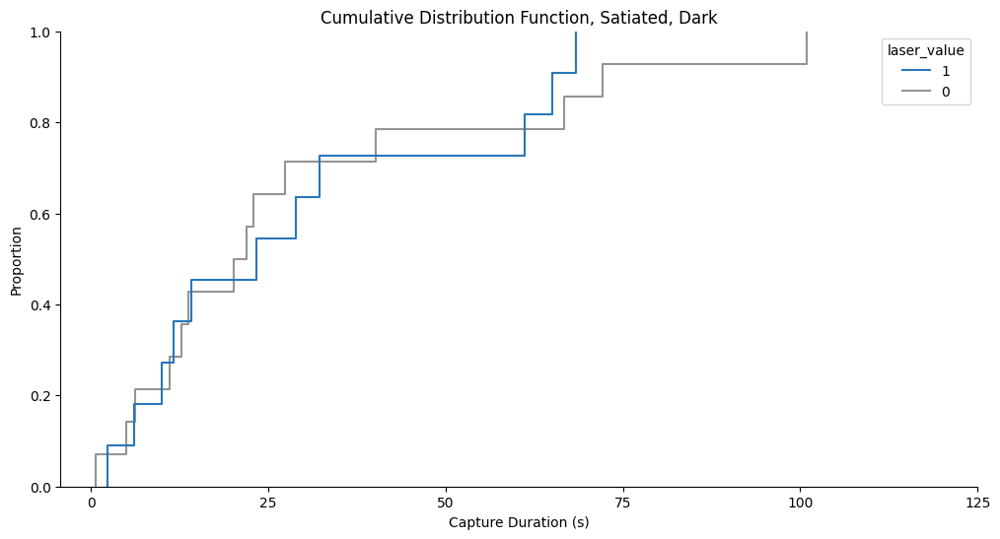

In [170]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=df1337.iloc[np.where(df1337['condition']=='1')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Light')
plt.xticks(np.arange(0, 150,25))
sns.despine()

fig2= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=df1337.iloc[np.where(df1337['condition']=='2')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette)
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark')
plt.xticks(np.arange(0, 150,25))
sns.despine()

In [171]:
df1430=observations[observations['filename'].str.contains('1430')]

cond1=df1430.iloc[np.where(df1430['condition']=='1')]
cond1_laser=cond1.iloc[np.where(cond1['laser_value']==1)]
cond1_nolaser=cond1.iloc[np.where(cond1['laser_value']==0)]

cond2=df1430.iloc[np.where(df1430['condition']=='2')]
cond2_laser=cond2.iloc[np.where(cond2['laser_value']==1)]
cond2_nolaser=cond2.iloc[np.where(cond2['laser_value']==0)]

/var/folders/l5/1kgct62n6sj5__7b7_13bmkm0000gn/T/ipykernel_73222/1049284176.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,8))


Error in callback <function _draw_all_if_interactive at 0x7febce928790> (for post_execute):


KeyboardInterrupt: 

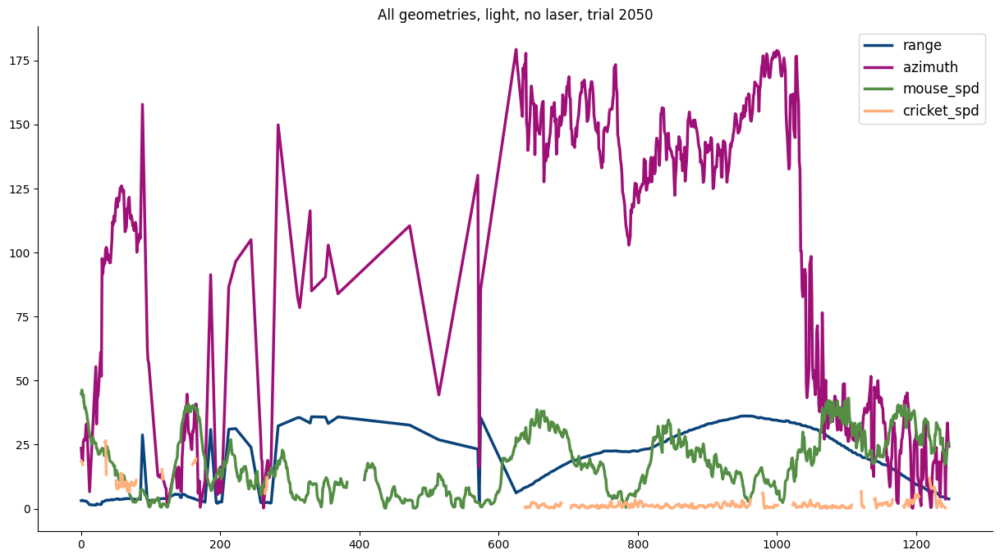

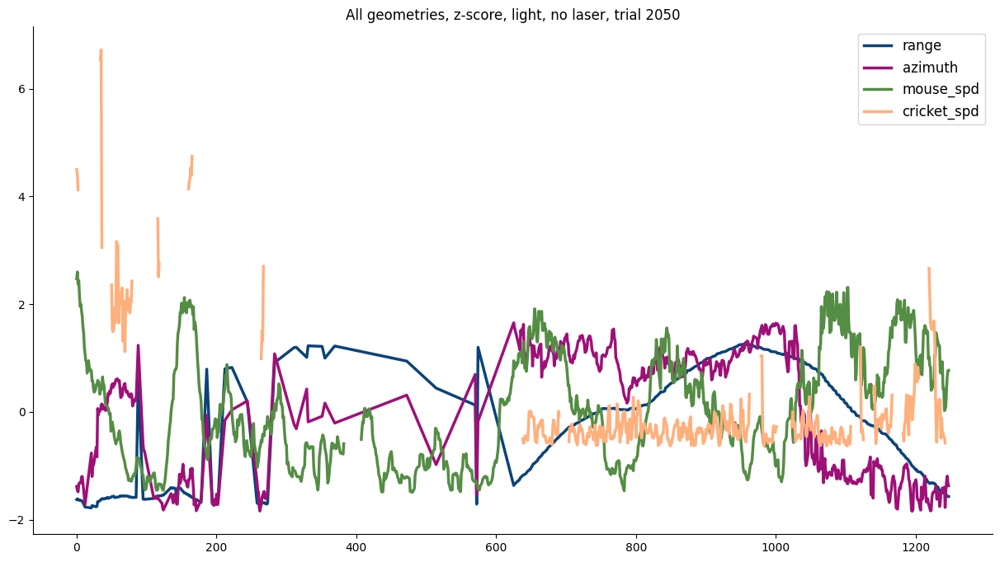

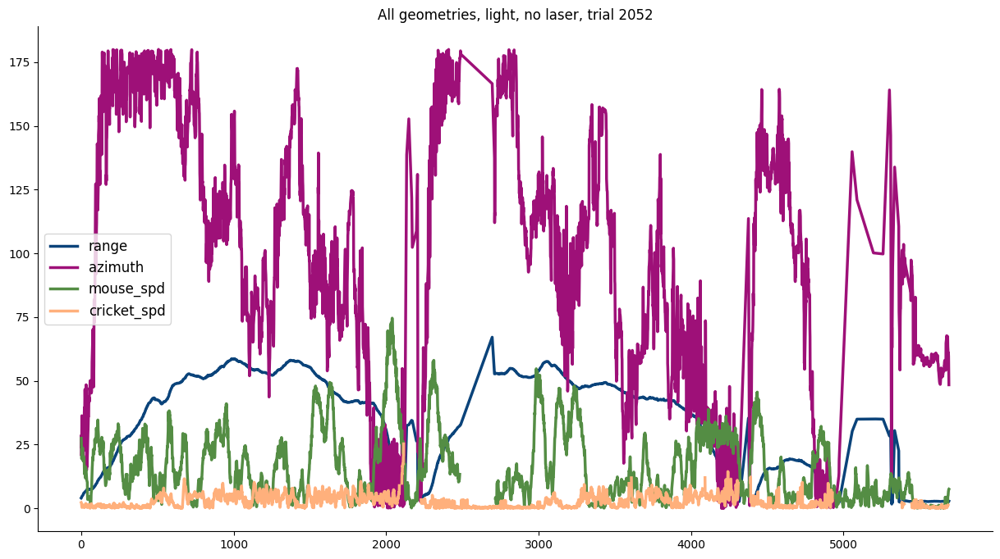

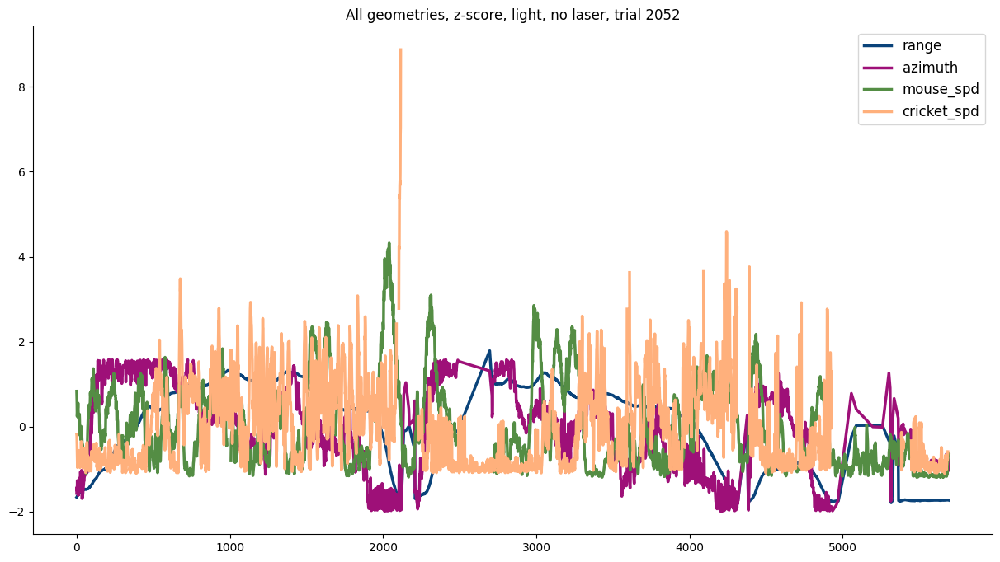

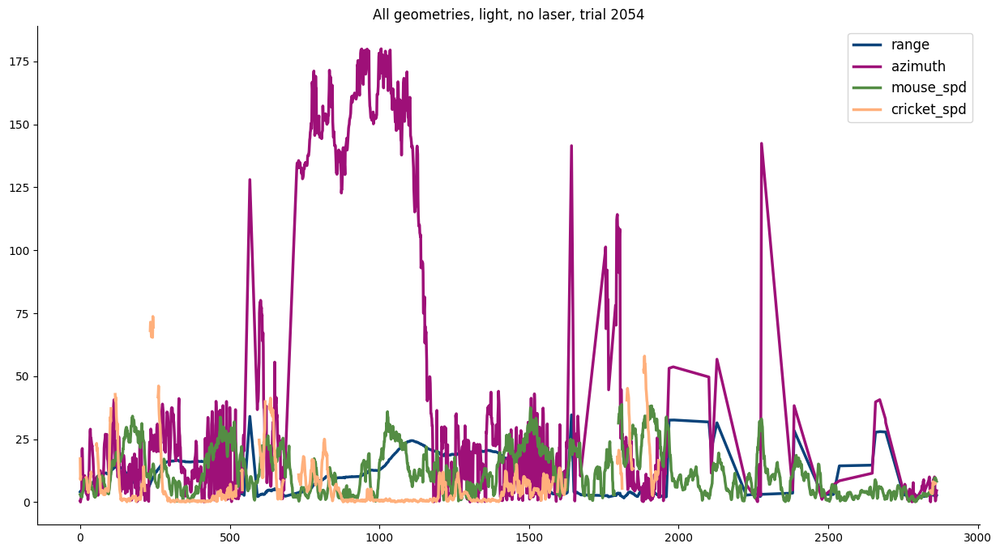

...

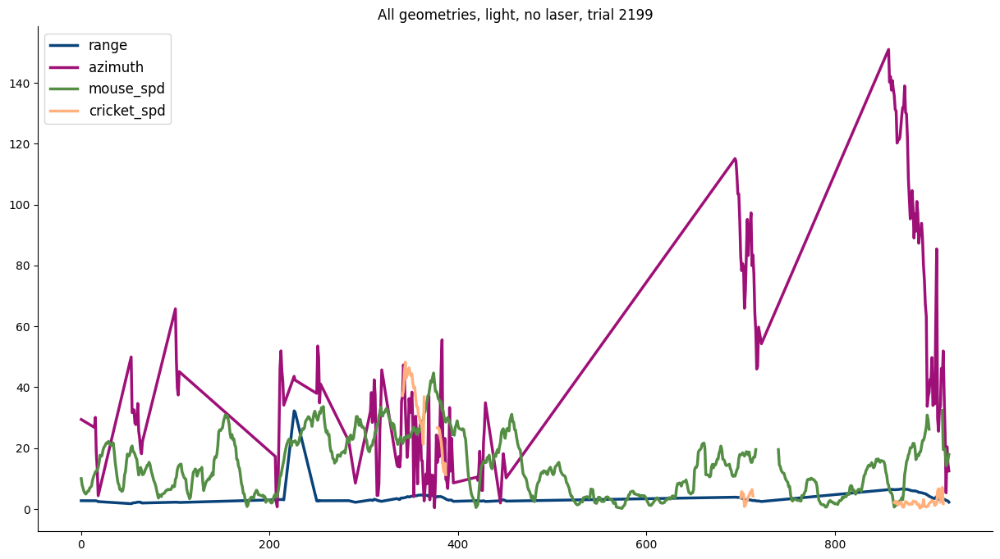

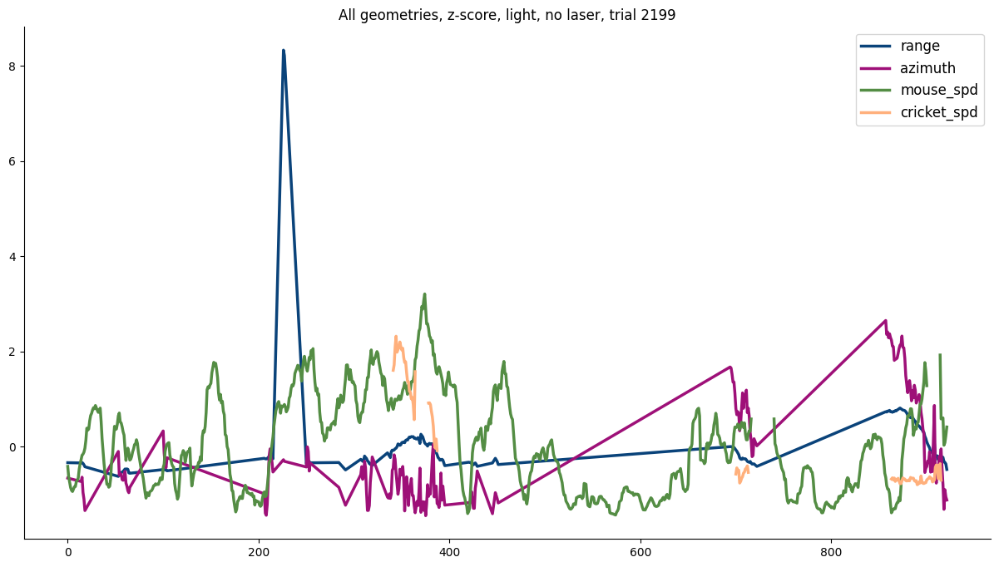

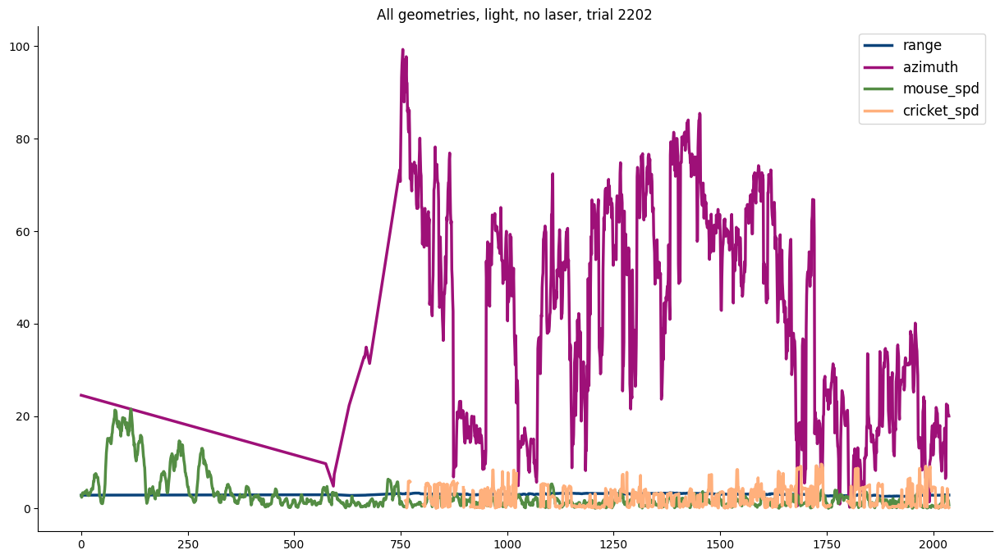

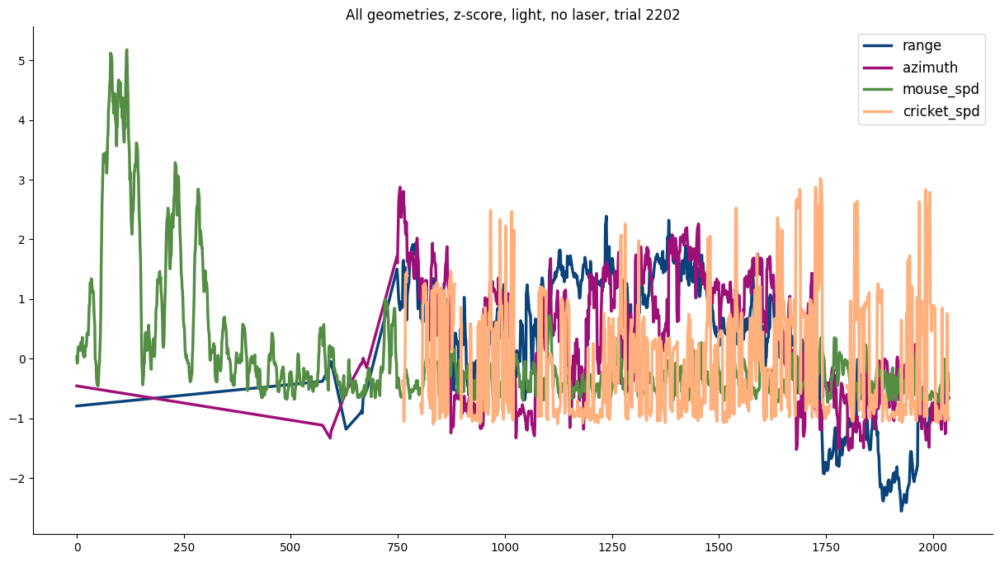

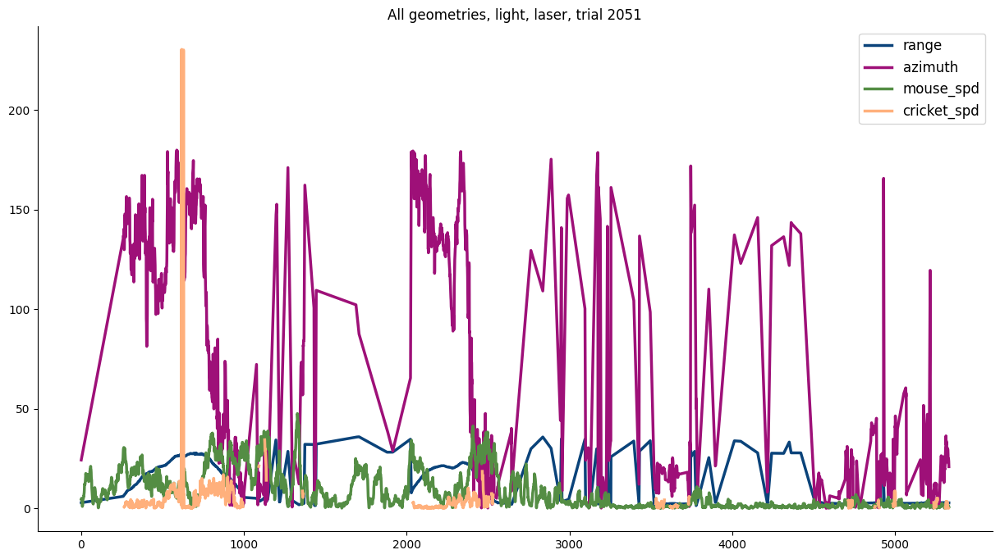

Error in callback <function flush_figures at 0x7fe84cfd65e0> (for post_execute):


KeyboardInterrupt: 

In [172]:
indices=np.asarray(cond1_nolaser.index)
# indices=[109]
for i in indices:
    drop=int(np.asarray([cond1_nolaser['cricketdrop'][i]])[0])
    intercept=int(np.asarray([cond1_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_nolaser['captureframe'][i]])[0])
   
    dist=cond1_nolaser['dist'][i]
    clip_dist=dist[intercept:capture]
    clip_dist=clip_dist.astype(float)
    z_clip_dist=stats.zscore(clip_dist, nan_policy='omit')
    
    az=cond1_nolaser['az'][i]
    clip_az=az[intercept:capture]
    clip_az=clip_az.astype(float)
    z_clip_az=stats.zscore(clip_az, nan_policy='omit')
    
    spd=cond1_nolaser['mouse_spd'][i]
    clip_spd=spd[intercept:capture]
    clip_spd=clip_spd.astype(float)
    z_clip_spd=stats.zscore(clip_spd, nan_policy='omit')
    
    cricket=cond1_nolaser['cricket_spd'][i]
    clip_cricket=cricket[intercept:capture]
    clip_cricket=clip_cricket.astype(float)
    z_clip_cricket=stats.zscore(clip_cricket, nan_policy='omit')
    
    labels=['range','azimuth', 'mouse_spd', 'cricket_spd']
    plt.figure(figsize=(15,8))

    plt.plot(clip_dist, color='#0a437a', linestyle='-', lw=2.5)
    plt.plot(clip_az, color='#9e1078', linestyle='-', lw=2.5)
    plt.plot(clip_spd, color='#548d44',linestyle='-', lw=2.5)
    plt.plot(clip_cricket, color='#ffb07c', linestyle='-', lw=2.5)

    plt.legend(labels=labels, fontsize='large')
    sns.despine()
    plt.title('All geometries, light, no laser, trial {}'.format(i))
    # plt.savefig('/Users/mollyshallow/Desktop/ZIPlots/trial_geometryplots/light_nl_trial{}.pdf'.format(i))
    plt.figure(figsize=(15,8))

    plt.plot(z_clip_dist, color='#0a437a', linestyle='-', lw=2.5)
    plt.plot(z_clip_az, color='#9e1078', linestyle='-', lw=2.5)
    plt.plot(z_clip_spd, color='#548d44',linestyle='-', lw=2.5)
    plt.plot(z_clip_cricket, color='#ffb07c', linestyle='-', lw=2.5)

    plt.legend(labels=labels, fontsize='large')
    # plt.ylim(-3,7)
    # plt.yticks(np.arange(-3,8,1))
    sns.despine()
    
    plt.title('All geometries, z-score, light, no laser, trial {}'.format(i))
    # plt.savefig('/Users/mollyshallow/Desktop/ZIPlots/trial_geometryplots/zscore_light_nl_trial{}.pdf'.format(i))

indices=np.asarray(cond1_laser.index)
# indices=[85]
for i in indices:
    drop=int(np.asarray([cond1_laser['cricketdrop'][i]])[0])
    intercept=int(np.asarray([cond1_laser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond1_laser['captureframe'][i]])[0])
   
    dist=cond1_laser['dist'][i]
    clip_dist=dist[intercept:capture]
    clip_dist=clip_dist.astype(float)
    z_clip_dist=stats.zscore(clip_dist, nan_policy='omit')
    
    az=cond1_laser['az'][i]
    clip_az=az[intercept:capture]
    clip_az=clip_az.astype(float)
    z_clip_az=stats.zscore(clip_az, nan_policy='omit')
    
    spd=cond1_laser['mouse_spd'][i]
    clip_spd=spd[intercept:capture]
    clip_spd=clip_spd.astype(float)
    z_clip_spd=stats.zscore(clip_spd, nan_policy='omit')
    
    cricket=cond1_laser['cricket_spd'][i]
    clip_cricket=cricket[intercept:capture]
    clip_cricket=clip_cricket.astype(float)
    z_clip_cricket=stats.zscore(clip_cricket, nan_policy='omit')
    
    labels=['range','azimuth', 'mouse_spd', 'cricket_spd']
    plt.figure(figsize=(15,8))

    plt.plot(clip_dist, color='#0a437a', linestyle='-', lw=2.5)
    plt.plot(clip_az, color='#9e1078', linestyle='-', lw=2.5)
    plt.plot(clip_spd, color='#548d44',linestyle='-', lw=2.5)
    plt.plot(clip_cricket, color='#ffb07c', linestyle='-', lw=2.5)

    plt.legend(labels=labels, fontsize='large')
    sns.despine()

    plt.title('All geometries, light, laser, trial {}'.format(i))
    # plt.savefig('/Users/mollyshallow/Desktop/ZIPlots/trial_geometryplots/light_l_trial{}.pdf'.format(i))
    
    plt.figure(figsize=(15,8))

    plt.plot(z_clip_dist, color='#0a437a', linestyle='-', lw=2.5)
    plt.plot(z_clip_az, color='#9e1078', linestyle='-', lw=2.5)
    plt.plot(z_clip_spd, color='#548d44',linestyle='-', lw=2.5)
    plt.plot(z_clip_cricket, color='#ffb07c', linestyle='-', lw=2.5)

    plt.legend(labels=labels, fontsize='large')
    # plt.ylim(-3,7)
    # plt.yticks(np.arange(-3,8,1))
    sns.despine()
    
    plt.title('All geometries, z-score, light, laser, trial {}'.format(i))
    # plt.savefig('/Users/mollyshallow/Desktop/ZIPlots/trial_geometryplots/zscore_light_l_trial{}.pdf'.format(i))

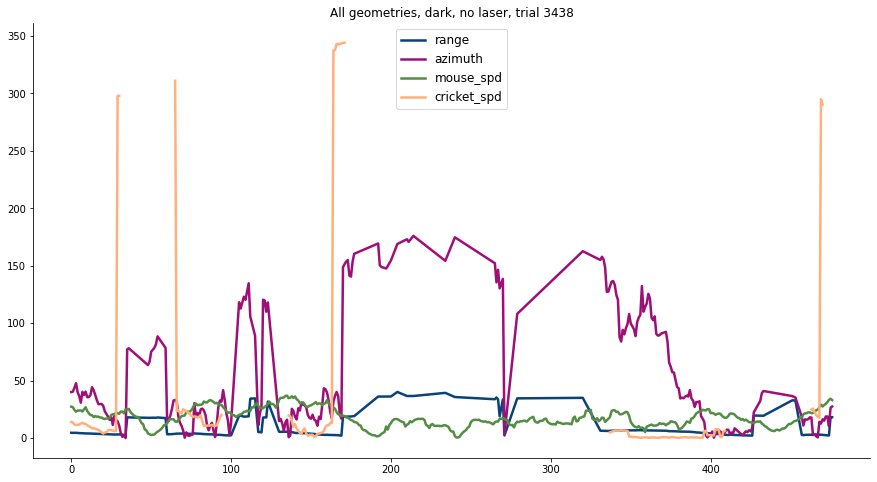

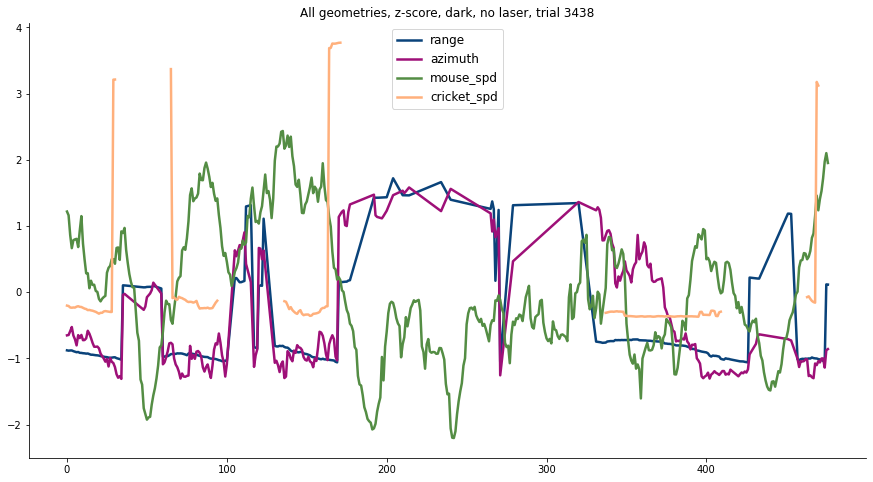

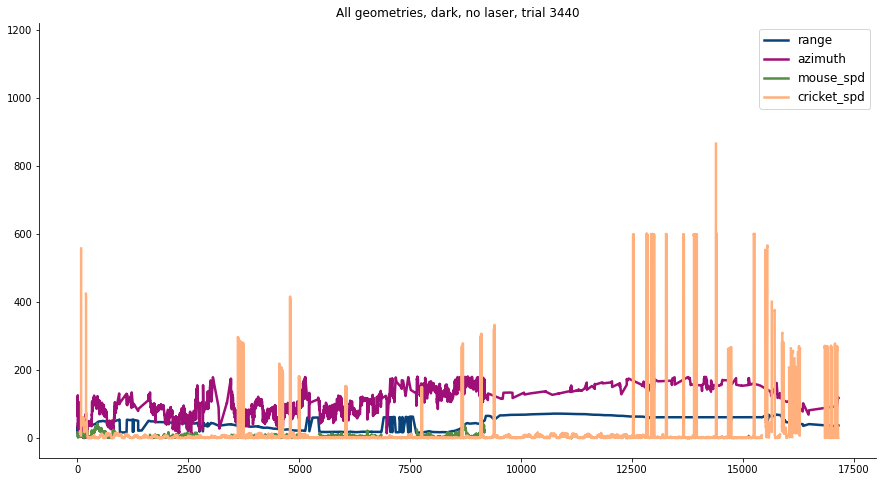

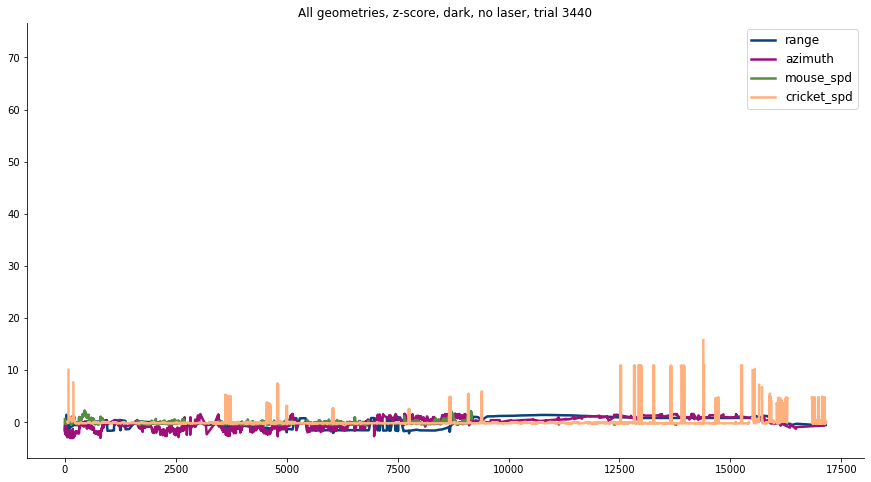

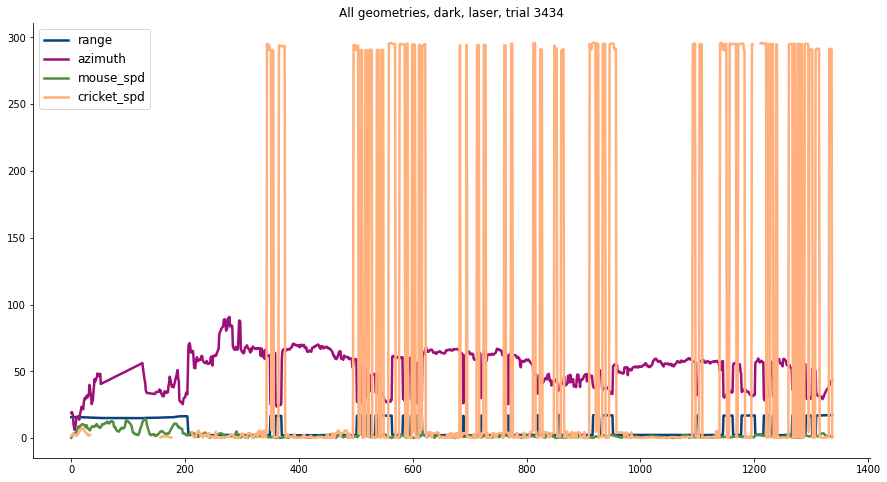

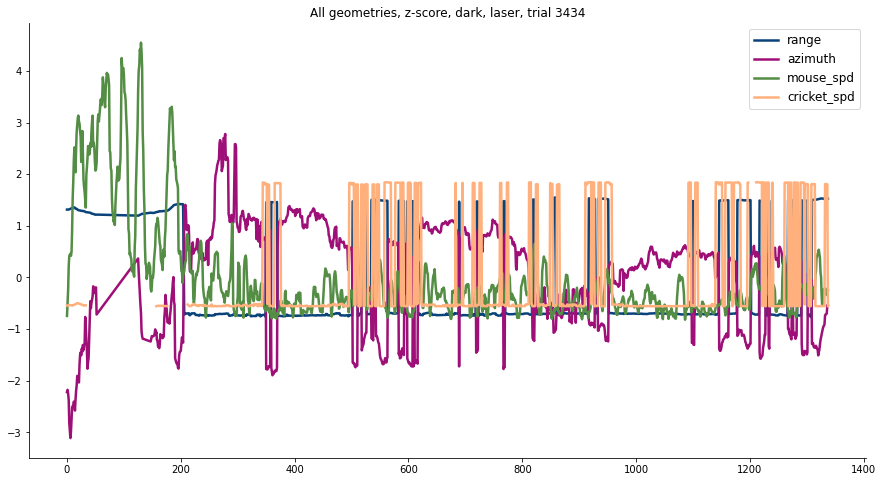

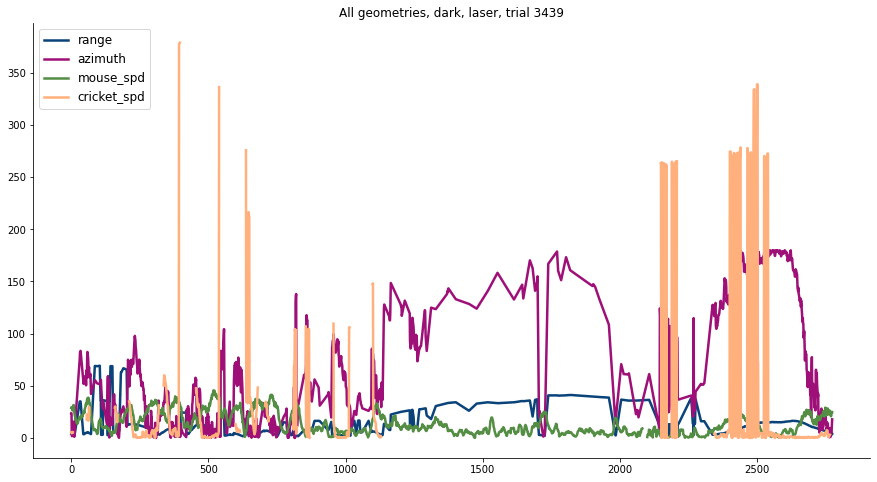

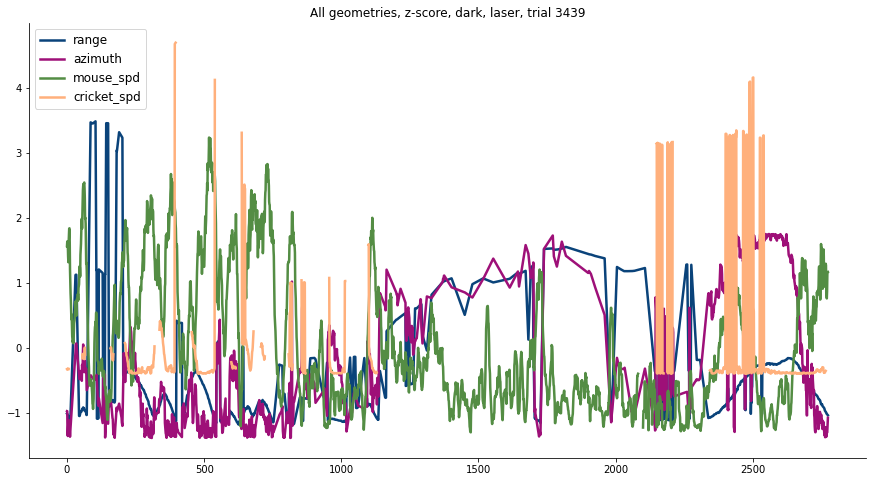

In [82]:
indices=np.asarray(cond2_nolaser.index)
# indices=[431]
for i in indices:
    drop=int(np.asarray([cond2_nolaser['cricketdrop'][i]])[0])
    intercept=int(np.asarray([cond2_nolaser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_nolaser['captureframe'][i]])[0])
   
    dist=cond2_nolaser['dist'][i]
    clip_dist=dist[intercept:capture]
    clip_dist=clip_dist.astype(float)
    z_clip_dist=stats.zscore(clip_dist, nan_policy='omit')
    
    az=cond2_nolaser['az'][i]
    clip_az=az[intercept:capture]
    clip_az=clip_az.astype(float)
    z_clip_az=stats.zscore(clip_az, nan_policy='omit')
    
    spd=cond2_nolaser['mouse_spd'][i]
    clip_spd=spd[intercept:capture]
    clip_spd=clip_spd.astype(float)
    z_clip_spd=stats.zscore(clip_spd, nan_policy='omit')
    
    cricket=cond2_nolaser['cricket_spd'][i]
    clip_cricket=cricket[intercept:capture]
    clip_cricket=clip_cricket.astype(float)
    z_clip_cricket=stats.zscore(clip_cricket, nan_policy='omit')
    
    labels=['range','azimuth', 'mouse_spd', 'cricket_spd']
    plt.figure(figsize=(15,8))

    plt.plot(clip_dist, color='#0a437a', linestyle='-', lw=2.5)
    plt.plot(clip_az, color='#9e1078', linestyle='-', lw=2.5)
    plt.plot(clip_spd, color='#548d44',linestyle='-', lw=2.5)
    plt.plot(clip_cricket, color='#ffb07c', linestyle='-', lw=2.5)

    plt.legend(labels=labels, fontsize='large')
    sns.despine()

    plt.title('All geometries, dark, no laser, trial {}'.format(i))
    # plt.savefig('/Users/mollyshallow/Desktop/ZIPlots/trial_geometryplots/dark_nl_trial{}.pdf'.format(i))
    
    plt.figure(figsize=(15,8))

    plt.plot(z_clip_dist, color='#0a437a', linestyle='-', lw=2.5)
    plt.plot(z_clip_az, color='#9e1078', linestyle='-', lw=2.5)
    plt.plot(z_clip_spd, color='#548d44',linestyle='-', lw=2.5)
    plt.plot(z_clip_cricket, color='#ffb07c', linestyle='-', lw=2.5)

    plt.legend(labels=labels, fontsize='large')
    # plt.ylim(-3,7)
    # plt.yticks(np.arange(-3,8,1))
    sns.despine()
    
    plt.title('All geometries, z-score, dark, no laser, trial {}'.format(i))
    # plt.savefig('/Users/mollyshallow/Desktop/ZIPlots/trial_geometryplots/zscore_dark_nl_trial{}.pdf'.format(i))

indices=np.asarray(cond2_laser.index)
# indices=[583]
for i in indices:
    drop=int(np.asarray([cond2_laser['cricketdrop'][i]])[0])
    intercept=int(np.asarray([cond2_laser['absoluteintercept'][i]])[0])
    capture=int(np.asarray([cond2_laser['captureframe'][i]])[0])
   
    dist=cond2_laser['dist'][i]
    clip_dist=dist[intercept:capture]
    clip_dist=clip_dist.astype(float)
    z_clip_dist=stats.zscore(clip_dist, nan_policy='omit')
    
    az=cond2_laser['az'][i]
    clip_az=az[intercept:capture]
    clip_az=clip_az.astype(float)
    z_clip_az=stats.zscore(clip_az, nan_policy='omit')
    
    spd=cond2_laser['mouse_spd'][i]
    clip_spd=spd[intercept:capture]
    clip_spd=clip_spd.astype(float)
    z_clip_spd=stats.zscore(clip_spd, nan_policy='omit')
    
    cricket=cond2_laser['cricket_spd'][i]
    clip_cricket=cricket[intercept:capture]
    clip_cricket=clip_cricket.astype(float)
    z_clip_cricket=stats.zscore(clip_cricket, nan_policy='omit')
    
    labels=['range','azimuth', 'mouse_spd', 'cricket_spd']
    plt.figure(figsize=(15,8))

    plt.plot(clip_dist, color='#0a437a', linestyle='-', lw=2.5)
    plt.plot(clip_az, color='#9e1078', linestyle='-', lw=2.5)
    plt.plot(clip_spd, color='#548d44',linestyle='-', lw=2.5)
    plt.plot(clip_cricket, color='#ffb07c', linestyle='-', lw=2.5)

    plt.legend(labels=labels, fontsize='large')
    sns.despine()

    plt.title('All geometries, dark, laser, trial {}'.format(i))
    # plt.savefig('/Users/mollyshallow/Desktop/ZIPlots/trial_geometryplots/dark_l_trial{}.pdf'.format(i))    
    plt.figure(figsize=(15,8))

    plt.plot(z_clip_dist, color='#0a437a', linestyle='-', lw=2.5)
    plt.plot(z_clip_az, color='#9e1078', linestyle='-', lw=2.5)
    plt.plot(z_clip_spd, color='#548d44',linestyle='-', lw=2.5)
    plt.plot(z_clip_cricket, color='#ffb07c', linestyle='-', lw=2.5)

    plt.legend(labels=labels, fontsize='large')
    # plt.ylim(-3,7)
    # plt.yticks(np.arange(-3,8,1))
    sns.despine()
    
    plt.title('All geometries, z-score, dark, laser, trial {}'.format(i))
    # plt.savefig('/Users/mollyshallow/Desktop/ZIPlots/trial_geometryplots/zscore_dark_l_trial{}.pdf'.format(i))

In [83]:
error_csv="/Users/mollyshallow/Desktop/20230207_failed_mice.csv"

In [84]:
errors=pd.read_csv(error_csv)

In [85]:
errors

,Unnamed: 0,0,1
0,0,2022-02-07_12-35-48_mouse-0894,/Volumes/Projects/PreyCapture/ZIActivation/202...
1,1,2022-02-08_11-34-52_mouse-0894,/Volumes/Projects/PreyCapture/ZIActivation/202...
2,2,2022-02-09_15-35-05_mouse-0894,/Volumes/Projects/PreyCapture/ZIActivation/202...
3,3,2022-02-10_10-03-48_mouse-0897,/Volumes/Projects/PreyCapture/ZIActivation/202...
4,4,2022-02-10_10-09-13_mouse-0897,/Volumes/Projects/PreyCapture/ZIActivation/202...
...,...,...,...
684,684,2023-01-20_10-30-14_mouse-1337,/Volumes/Projects/PreyCapture/ZIActivation/202...
685,685,2023-01-20_11-35-18_mouse-1336,/Volumes/Projects/PreyCapture/ZIActivation/202...
686,686,2023-01-20_9-12-42_mouse-1429,/Volumes/Projects/PreyCapture/ZIActivation/202...
687,687,2023-01-20_9-56-17_mouse-1430,/Volumes/Projects/PreyCapture/ZIActivation/202...


92

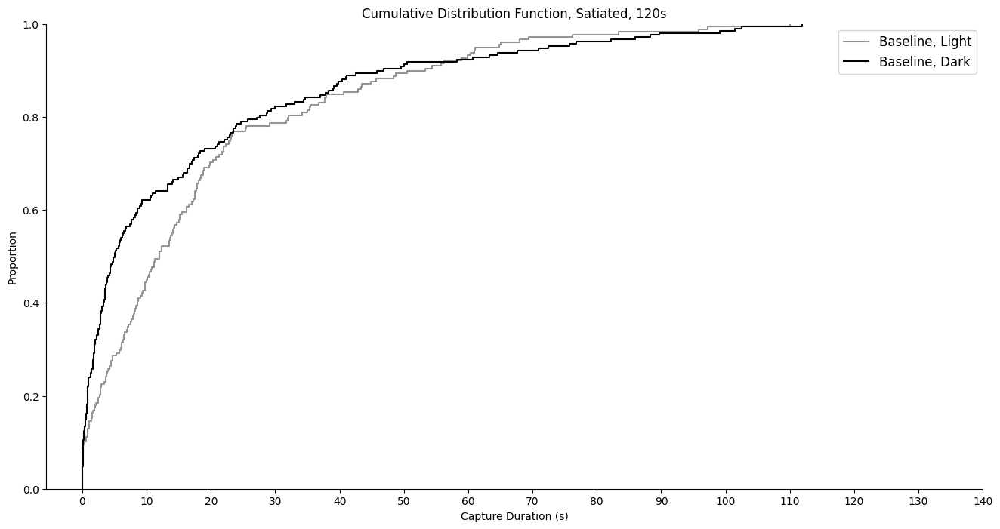

In [174]:
darkpalette=['#030aa7','#000000']
labels=['Baseline, Light', 'Baseline, Dark']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='baseline_l')], x='capduration', hue='laser_value',hue_order=hue_order, palette=palette, legend=True)
ax1=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='baseline_d')], x='capduration', hue='laser_value',hue_order=hue_order, palette=darkpalette)
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Satiated, 120s')
plt.xticks(np.arange(0, 150,10))
sns.despine()

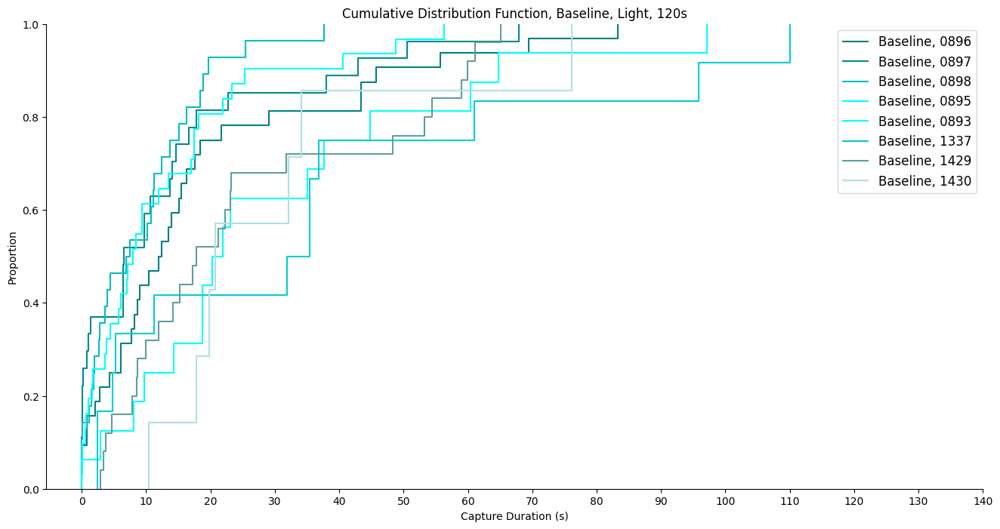

In [175]:
# pallet=plt.style.use('seaborn-dark-palette')
labels=['Baseline, 0896', 'Baseline, 0897','Baseline, 0898','Baseline, 0895','Baseline, 0893','Baseline, 1337', 'Baseline, 1429','Baseline, 1430']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=df0896.iloc[np.where(df0896['condition']=='baseline_l')], x='capduration', color='teal',  legend=True)
ax1=sns.ecdfplot(data=df0897.iloc[np.where(df0897['condition']=='baseline_l')], x='capduration', color='darkcyan')
ax2=sns.ecdfplot(data=df0898.iloc[np.where(df0898['condition']=='baseline_l')], x='capduration', color='c')
ax3=sns.ecdfplot(data=df0895.iloc[np.where(df0895['condition']=='baseline_l')], x='capduration', color='aqua')
ax4=sns.ecdfplot(data=df0893.iloc[np.where(df0893['condition']=='baseline_l')], x='capduration', color='cyan')
ax5=sns.ecdfplot(data=df1337.iloc[np.where(df1337['condition']=='baseline_l')], x='capduration', color='darkturquoise')
ax6=sns.ecdfplot(data=df1429.iloc[np.where(df1429['condition']=='baseline_l')], x='capduration', color='cadetblue')
ax7=sns.ecdfplot(data=df1430.iloc[np.where(df1430['condition']=='baseline_l')], x='capduration', color='powderblue')
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Baseline, Light, 120s')
plt.xticks(np.arange(0, 150,10))
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/NCB021423/distriblight_indbaselines.pdf')

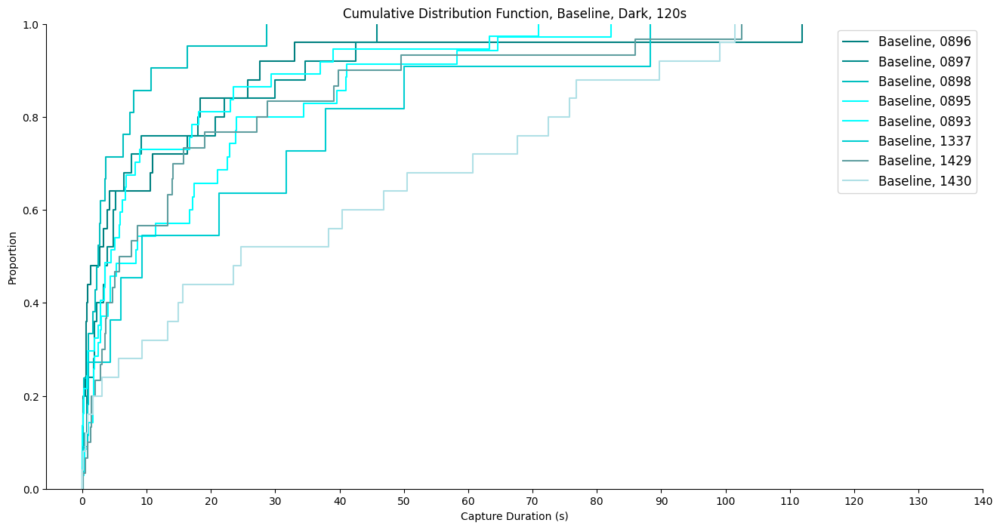

In [176]:
labels=['Baseline, 0896', 'Baseline, 0897','Baseline, 0898','Baseline, 0895','Baseline, 0893','Baseline, 1337', 'Baseline, 1429','Baseline, 1430']
fig1= plt.figure(figsize=(16,8))
ax=sns.ecdfplot(data=df0896.iloc[np.where(df0896['condition']=='baseline_d')], x='capduration', color='teal',  legend=True)
ax1=sns.ecdfplot(data=df0897.iloc[np.where(df0897['condition']=='baseline_d')], x='capduration', color='darkcyan')
ax2=sns.ecdfplot(data=df0898.iloc[np.where(df0898['condition']=='baseline_d')], x='capduration', color='c')
ax3=sns.ecdfplot(data=df0895.iloc[np.where(df0895['condition']=='baseline_d')], x='capduration', color='aqua')
ax4=sns.ecdfplot(data=df0893.iloc[np.where(df0893['condition']=='baseline_d')], x='capduration', color='cyan')
ax5=sns.ecdfplot(data=df1337.iloc[np.where(df1337['condition']=='baseline_d')], x='capduration', color='darkturquoise')
ax6=sns.ecdfplot(data=df1429.iloc[np.where(df1429['condition']=='baseline_d')], x='capduration', color='cadetblue')
ax7=sns.ecdfplot(data=df1430.iloc[np.where(df1430['condition']=='baseline_d')], x='capduration', color='powderblue')
ax.legend(labels=labels, fontsize='large')
plt.xlabel('Capture Duration (s)')
plt.title('Cumulative Distribution Function, Baseline, Dark, 120s')
plt.xticks(np.arange(0, 150,10))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/NCB021423/distribdark_indbaselines.pdf')

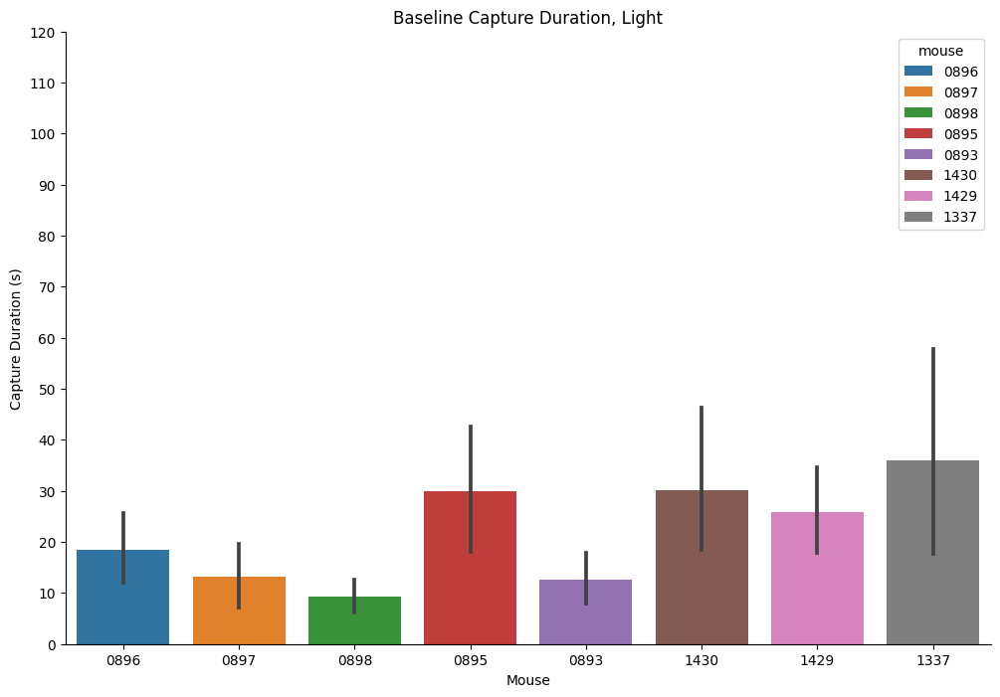

In [182]:
fig1= plt.figure(figsize=(12,8))
ax=sns.barplot(data=conds_keep.iloc[np.where(conds_keep['condition']=='baseline_l')], x='mouse', y='capduration', hue='mouse', dodge=False)
# ax1=sns.barplot(data=conds_keep.iloc[np.where(conds_keep['condition']=='baseline_d')], x='mouse', y='capduration', hue='mouse', alpha=0.5, dodge=True)

plt.ylabel('Capture Duration (s)')
plt.xlabel('Mouse')
plt.title('Baseline Capture Duration, Light')
plt.yticks(np.arange(0, 130,10))
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/NCB021423/light_indbaselines.pdf')

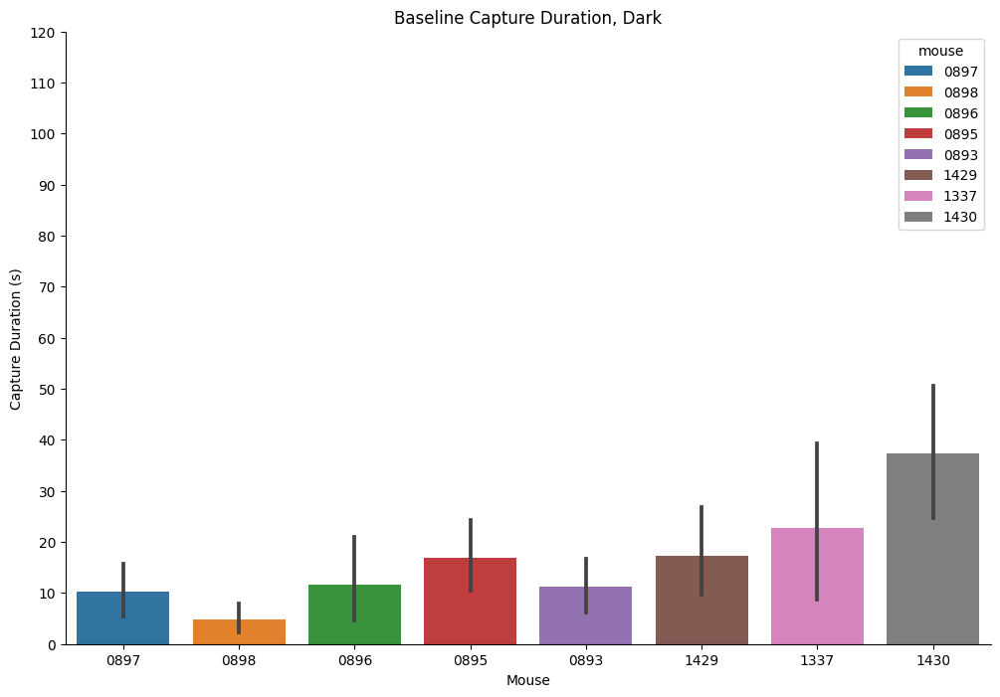

In [183]:
fig1= plt.figure(figsize=(12,8))
ax=sns.barplot(data=conds_keep.iloc[np.where(conds_keep['condition']=='baseline_d')], x='mouse', y='capduration', hue='mouse', dodge=False)
plt.ylabel('Capture Duration (s)')
plt.xlabel('Mouse')
plt.title('Baseline Capture Duration, Dark')
plt.yticks(np.arange(0, 130,10))
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/NCB021423/dark_indbaselines.pdf')

In [179]:
conds_keep['folder_path']=conds_keep['folder_path'].astype('str')
# mousenum=conds_keep['folder_path'][3771][-4:]

/var/folders/l5/1kgct62n6sj5__7b7_13bmkm0000gn/T/ipykernel_73222/2897292589.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conds_keep['folder_path']=conds_keep['folder_path'].astype('str')


In [94]:
mousenum

'1337'

In [180]:
indices=np.asarray(conds_keep.index)
mousenum=[]
for i in indices:
    value=conds_keep['folder_path'][i][-4:]
    mousenum=np.append(mousenum, value)
conds_keep['mouse']=mousenum

/var/folders/l5/1kgct62n6sj5__7b7_13bmkm0000gn/T/ipykernel_73222/1543370561.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conds_keep['mouse']=mousenum


In [181]:
conds_keep

,filename,folder_path,condition,laser_value,dist,cricket_spd,mouse_spd,az,captureT,cricketdrop,...,timetoapproach,prob_inter,prob_capture,timetointercept,interceptframe,c_length,capduration,trials_to_drop,timestamps,mouse
51,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-00-06_mouse-0896,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.7409957277682093, 1.8043564226373539, 1.943...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",4.960,2786.0,...,0.955,0.250000,1.000000,4.160,832.0,10.98650,0.800,NaN,2022-02-10 10:00:06,0896
52,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-15-31_mouse-0897,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.2736812180669475, 5.538678124903959, 5.8628...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",9.155,2033.0,...,0.830,1.000000,0.333333,2.690,538.0,9.82625,6.465,NaN,2022-02-10 10:15:31,0897
53,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-17-24_mouse-0897,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.6607266263611489, 1.9237976743785534, 2.717...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.900,1771.0,...,8.905,0.714286,0.200000,13.150,2630.0,11.94925,9.750,NaN,2022-02-10 10:17:24,0897
54,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-19-26_mouse-0897,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.6852905966486629, 0.9424460568841765, 1.084...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",39.285,2269.0,...,0.535,0.750000,0.111111,1.300,260.0,12.92725,37.985,NaN,2022-02-10 10:19:26,0897
55,/Volumes/Projects/PreyCapture/ZIActivation/202...,2022-02-10_10-22-02_mouse-0897,baseline_l,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[6.055302407961652, 6.673316263909858, 7.59725...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.955,2515.0,...,2.235,0.333333,1.000000,6.915,1383.0,12.73900,0.040,NaN,2022-02-10 10:22:02,0897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2435,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-25-16_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[4.686184402668794, 5.375521759637996, 7.19742...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",22.525,1805.0,...,1.945,0.666667,0.250000,6.905,1381.0,9.36850,15.620,left_only,2023-01-29 13:25:16,1430
2436,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-27-15_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.593484666671011, 1.7669192009721417, 1.8651...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",12.125,1513.0,...,0.250,0.200000,1.000000,11.625,2325.0,10.74700,0.500,left_only,2023-01-29 13:27:15,1430
2437,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-29-34_mouse-1430,2,1.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[13.55084575241241, 15.911738188176692, 18.134...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",6.740,1766.0,...,6.185,1.000000,1.000000,6.720,1344.0,10.24200,0.020,left_only,2023-01-29 13:29:34,1430
2438,/Volumes/Projects/PreyCapture/ZIActivation/202...,2023-01-29_13-30-57_mouse-1430,2,0.0,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[5.6081144264218015, 6.058750344073401, 6.2490...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,1494.0,...,8.170,0.263158,0.100000,27.820,5564.0,7.58625,NaN,left_only,2023-01-29 13:30:57,1430


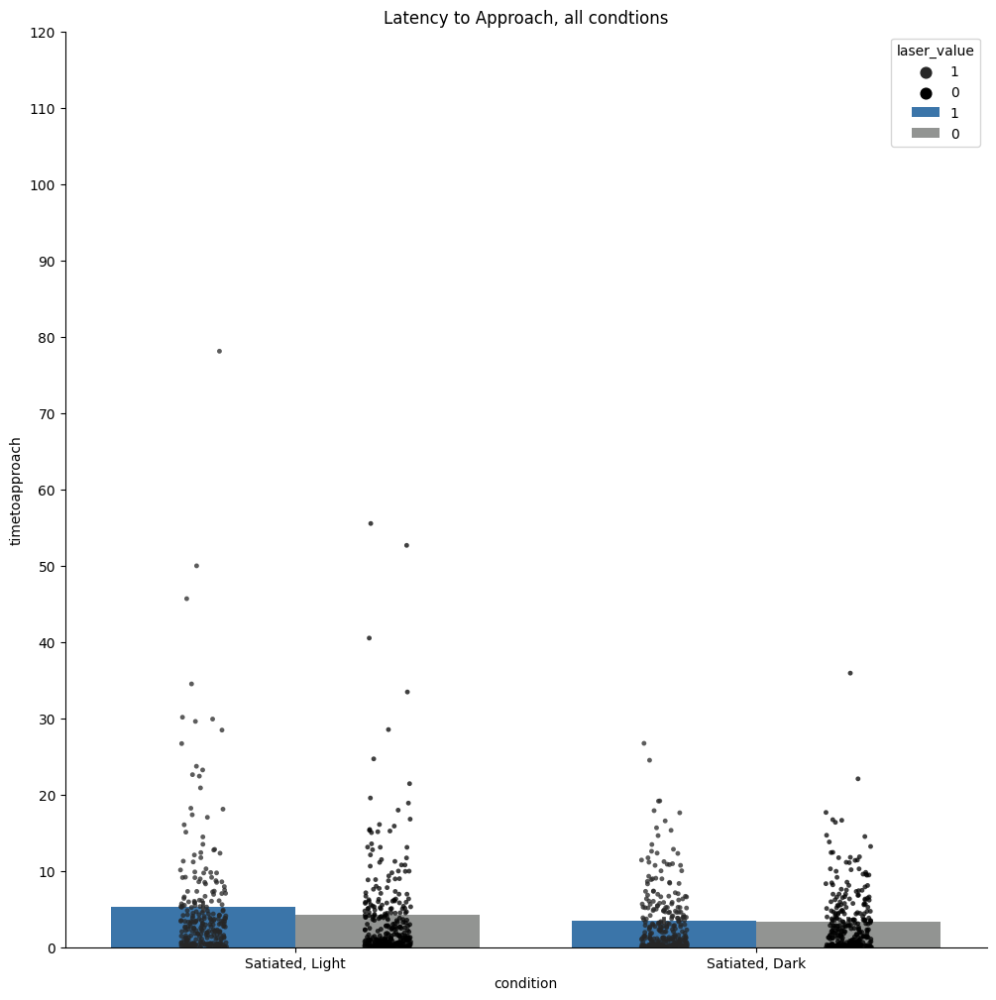

In [209]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='timetoapproach', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='timetoapproach', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Latency to Approach, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light',  'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/time2approach.pdf')

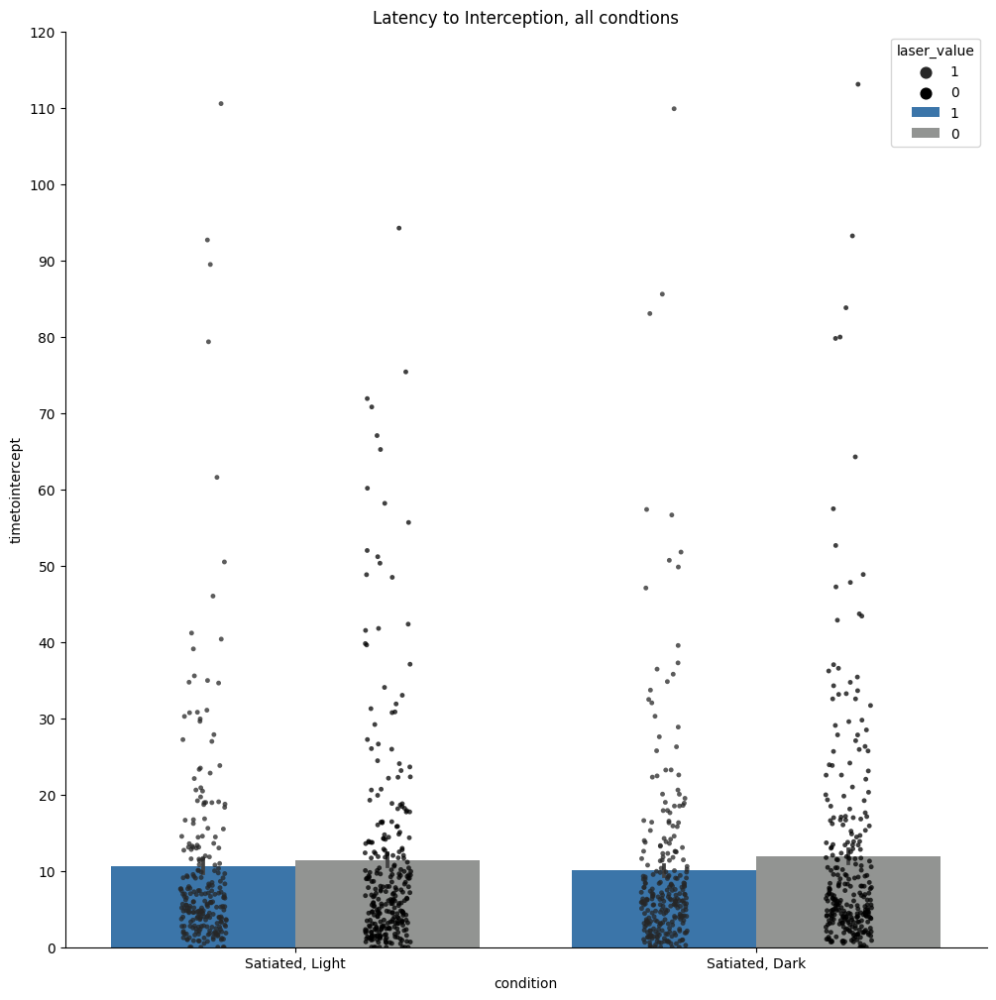

In [210]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='timetointercept', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='timetointercept', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Latency to Interception, all condtions')
plt.ylim(0,120)
plt.yticks(np.arange(0,130,10))
plt.xticks([0,1],['Satiated, Light',  'Satiated, Dark'])
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/time2intercept.pdf')

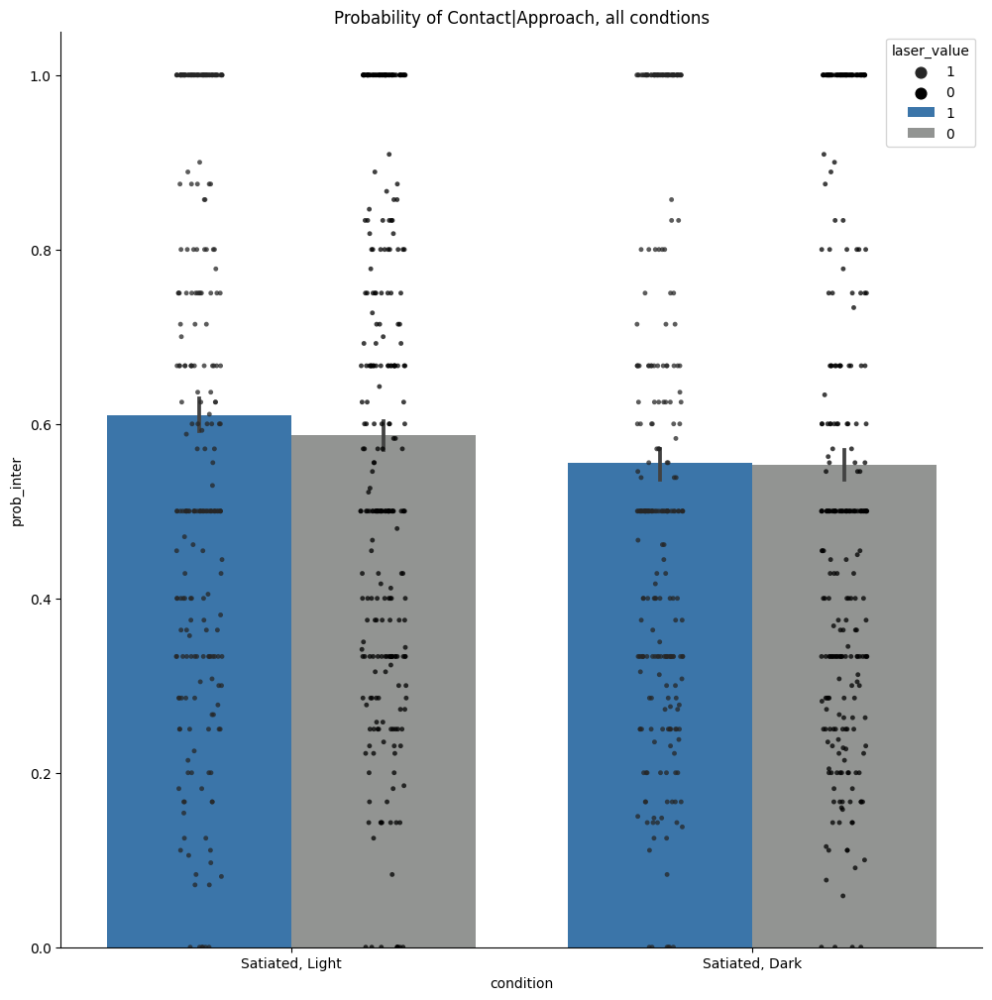

In [191]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='prob_inter', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='prob_inter', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Probability of Contact|Approach, all condtions')
# plt.ylim(0,10)
# plt.yticks(np.arange(0,15,1))
plt.xticks([0,1],['Satiated, Light',  'Satiated, Dark'])
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/probinter.pdf')

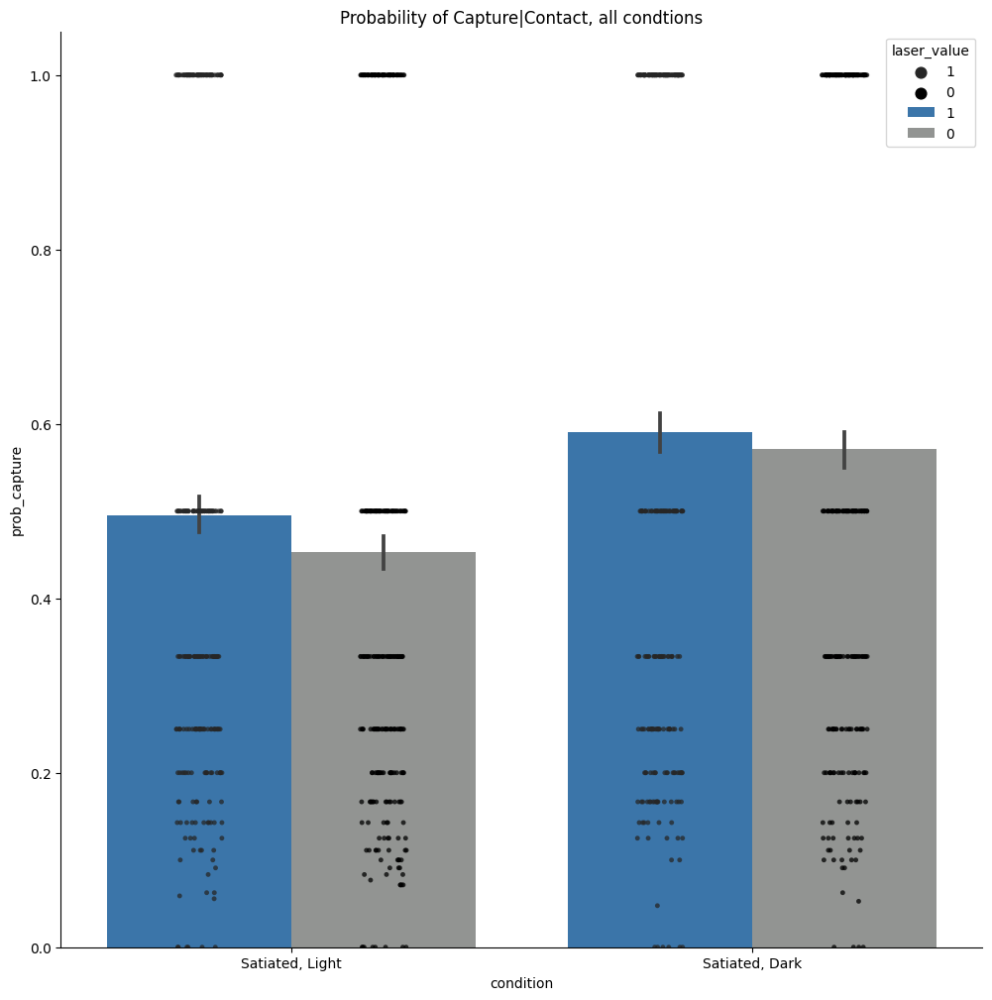

In [192]:
plt.figure(figsize=(12,12))
ax=sns.barplot(data=conds_keep, x='condition', y='prob_capture', hue='laser_value', ci=68, palette=palette, hue_order=hue_order)
ax= sns.stripplot(x='condition', y='prob_capture', hue='laser_value',dodge=True, data=conds_keep, color='black', size=3.5, alpha=0.75, hue_order=hue_order)
plt.title('Probability of Capture|Contact, all condtions')
# plt.ylim(0,10)
# plt.yticks(np.arange(0,15,1))
plt.xticks([0,1],['Satiated, Light',  'Satiated, Dark'])
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/probcapture.pdf')

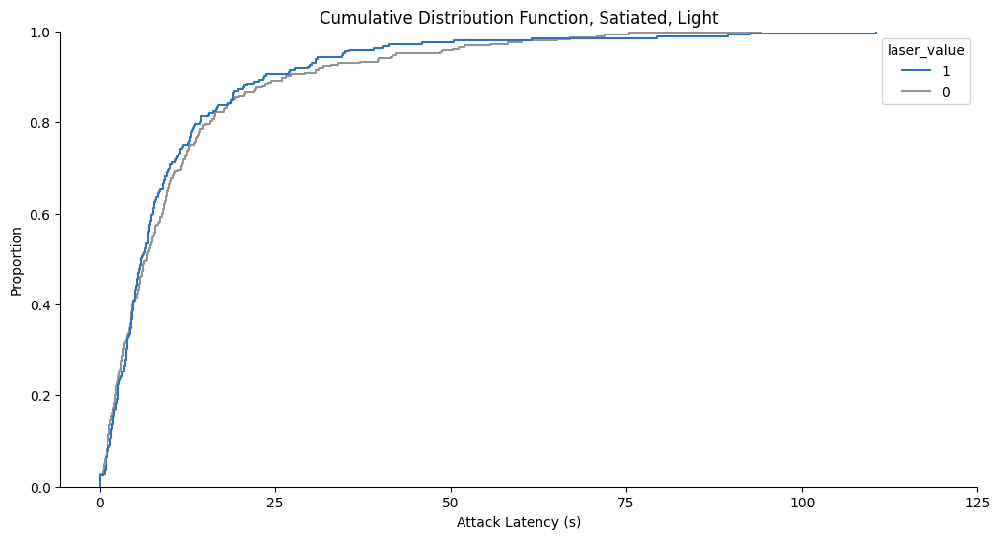

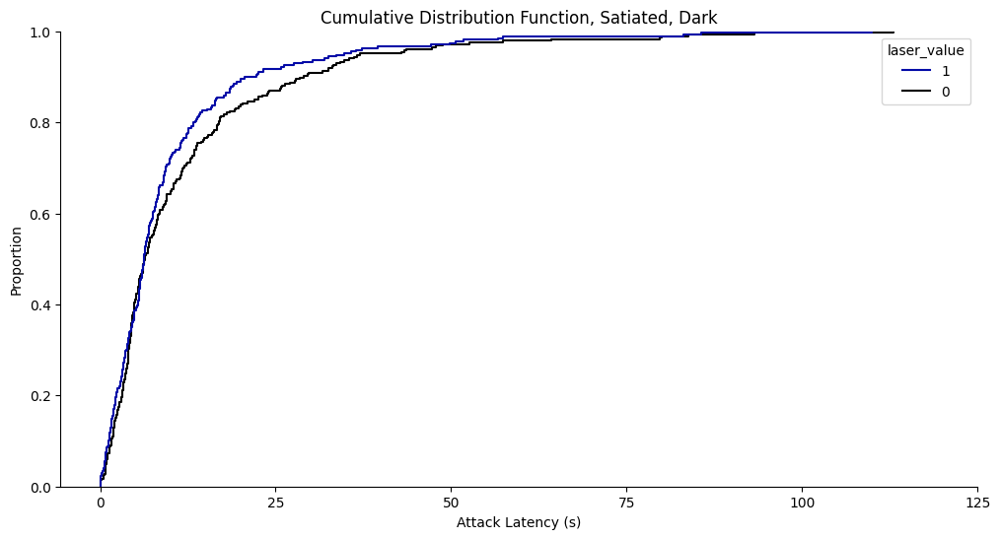

In [205]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='timetointercept', hue='laser_value',hue_order=hue_order, palette=palette)
plt.xlabel('Attack Latency (s)')
plt.title('Cumulative Distribution Function, Satiated, Light')
plt.xticks(np.arange(0, 150,25))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/attacklatency_distriblight_allmice.pdf')

fig2= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='timetointercept', hue='laser_value',hue_order=hue_order, palette=darkpalette)
plt.xlabel('Attack Latency (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark')
plt.xticks(np.arange(0, 150,25))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/attacklatency_distribdark_allmice.pdf')

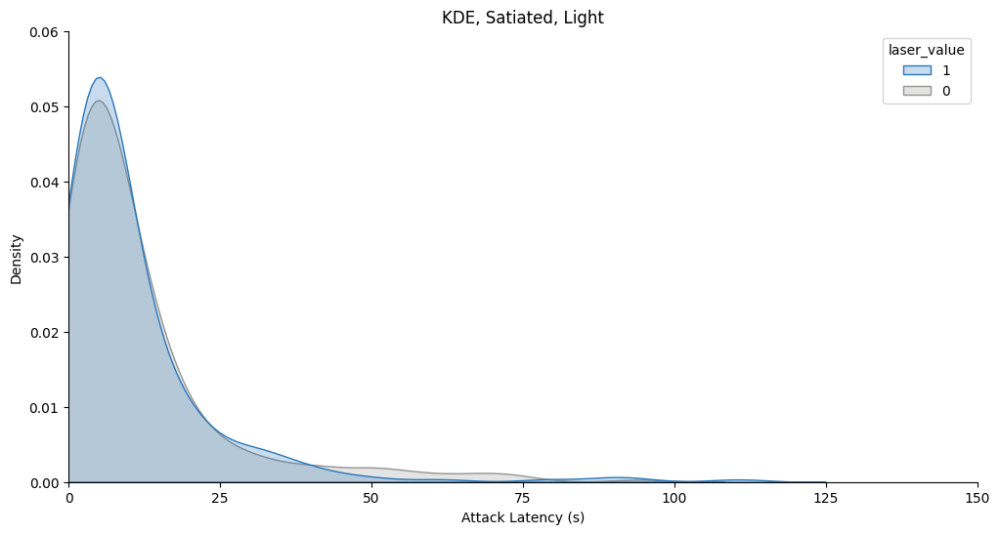

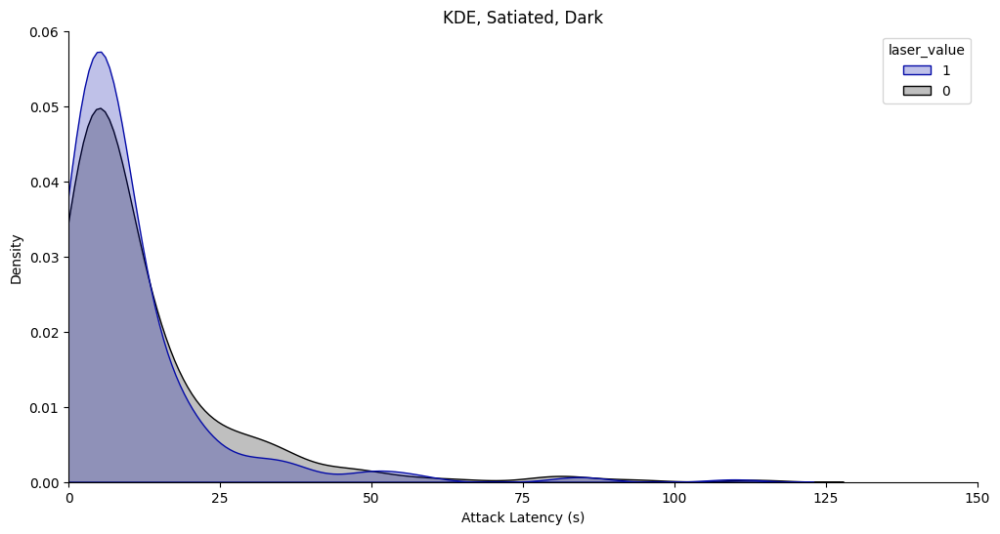

In [81]:
fig1= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=conds_keep.iloc[np.where(conds_keep['condition']=='1')], x='timetointercept', hue='laser_value',hue_order=hue_order, palette=palette, fill=True, common_norm=False)
plt.xlabel('Attack Latency (s)')
plt.title('KDE, Satiated, Light')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.06)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/attacklatency_kdelight_allmice_nonorm_clip.pdf')

fig2= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=conds_keep.iloc[np.where(conds_keep['condition']=='2')], x='timetointercept', hue='laser_value',hue_order=hue_order, palette=darkpalette, fill=True, common_norm=False)
plt.xlabel('Attack Latency (s)')
plt.title('KDE, Satiated, Dark')
plt.xticks(np.arange(0, 175,25))
plt.xlim(0, 150)
plt.ylim(0, 0.06)
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/attacklatency_kdedark_allmice_nonorm_clip.pdf')

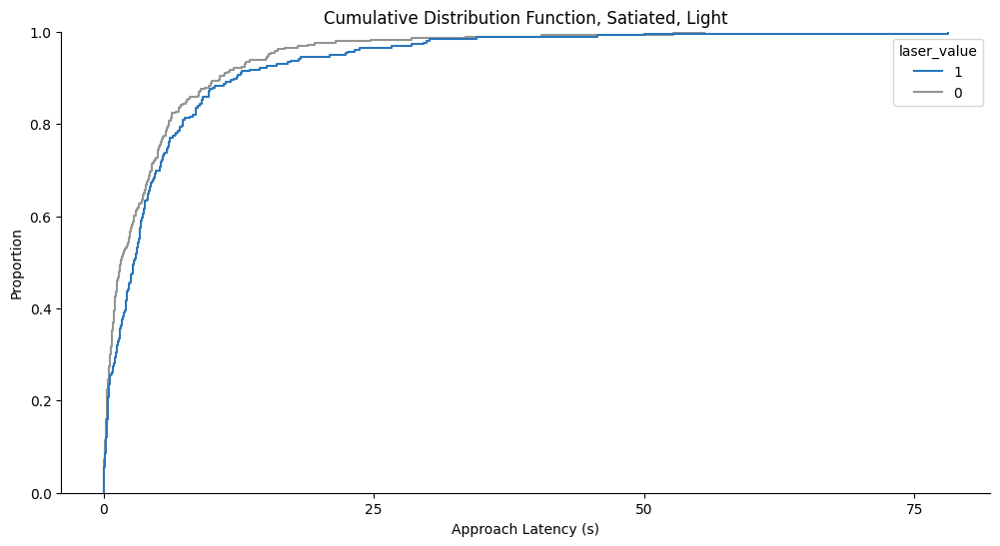

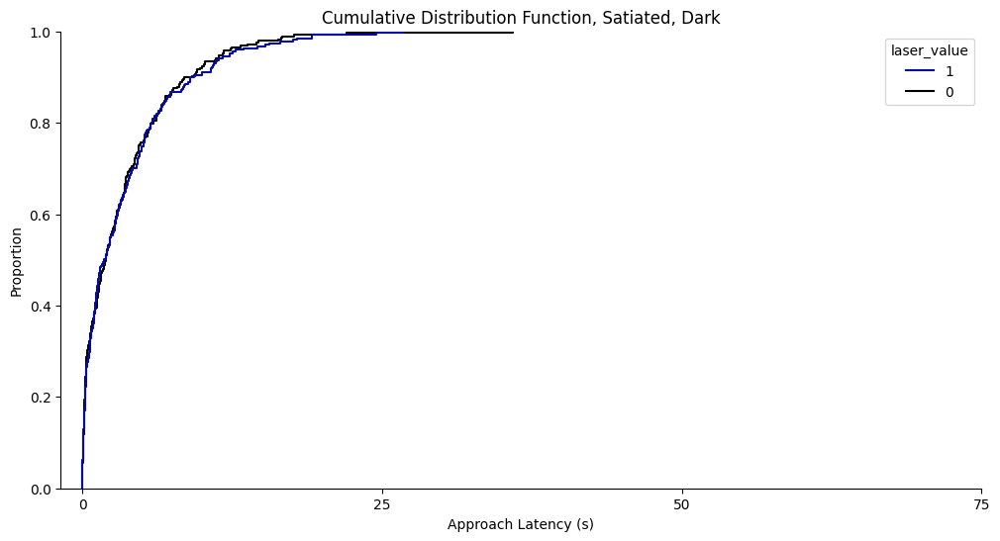

In [207]:
fig1= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='1')], x='timetoapproach', hue='laser_value',hue_order=hue_order, palette=palette)
plt.xlabel('Approach Latency (s)')
plt.title('Cumulative Distribution Function, Satiated, Light')
plt.xticks(np.arange(0, 100,25))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/approachlatency_distriblight_allmice.pdf')

fig2= plt.figure(figsize=(12,6))
ax=sns.ecdfplot(data=test_nandf.iloc[np.where(test_nandf['condition']=='2')], x='timetoapproach', hue='laser_value',hue_order=hue_order, palette=darkpalette)
plt.xlabel('Approach Latency (s)')
plt.title('Cumulative Distribution Function, Satiated, Dark')
plt.xticks(np.arange(0, 100,25))
sns.despine()
plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/approachlatency_distribdark_allmice.pdf')


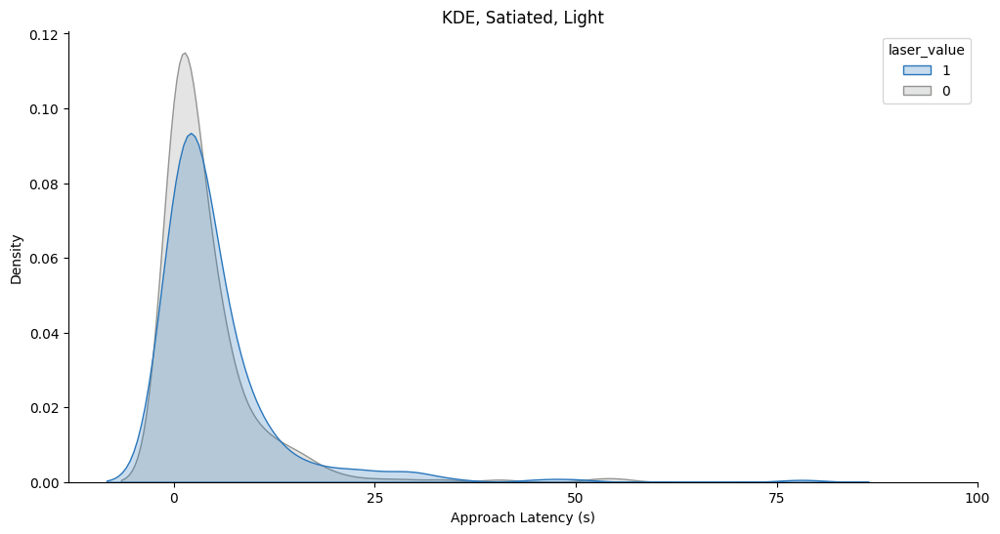

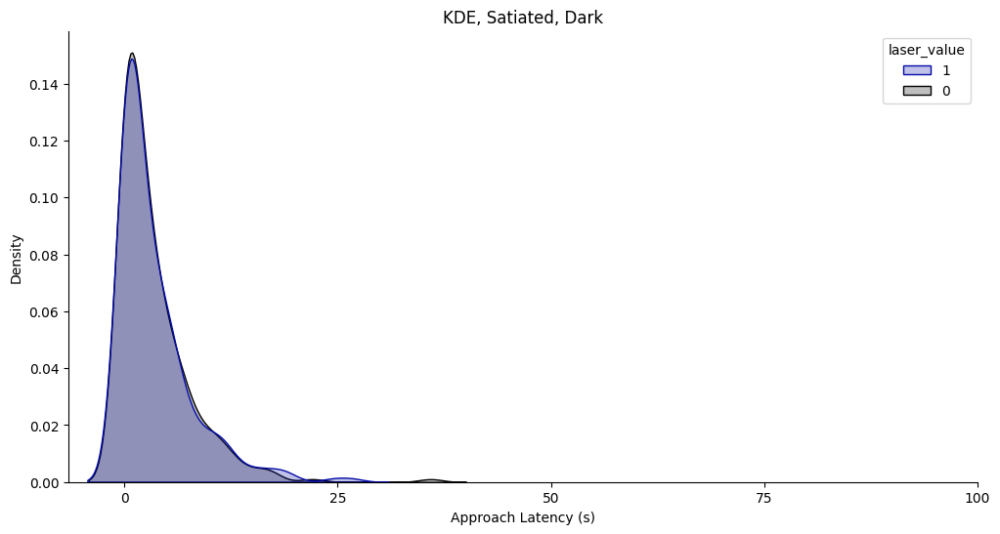

In [283]:
fig1= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=conds_keep.iloc[np.where(conds_keep['condition']=='1')], x='timetoapproach', hue='laser_value',hue_order=hue_order, palette=palette, fill=True, common_norm=False)
plt.xlabel('Approach Latency (s)')
plt.title('KDE, Satiated, Light')
plt.xticks(np.arange(0, 125,25))
# plt.xlim(0,100)
# plt.ylim(0,0.08)
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/approachlatency_kdelight_allmice.pdf')


fig2= plt.figure(figsize=(12,6))
ax=sns.kdeplot(data=conds_keep.iloc[np.where(conds_keep['condition']=='2')], x='timetoapproach', hue='laser_value',hue_order=hue_order, palette=darkpalette, fill=True,common_norm=False)
plt.xlabel('Approach Latency (s)')
plt.title('KDE, Satiated, Dark')
plt.xticks(np.arange(0, 125,25))
# plt.ylim(0,0.08)
# plt.xlim(0,100)
sns.despine()
# plt.savefig('/Users/mollyshallow/Desktop/Wehr_Lab/ZIActivationPlots/groupdata/approachlatency_kdedark_allmice.pdf')


In [47]:
df0896.groupby(['condition', 'laser_value']).mean()

captureT  cricketdrop  captureframe  freqapproach  \
condition laser_value                                                       
1         0.0          25.101528  1450.928571  13942.500000      0.145413   
          1.0          18.913750  2319.000000  11889.000000      0.141043   
2         0.0          14.387564  1411.441860   7275.046512      0.123614   
          1.0          14.259474  1746.052632   4597.947368      0.122799   

                       timetoapproach  prob_inter  prob_capture  \
condition laser_value                                             
1         0.0                3.934048    0.567113      0.373716   
          1.0                3.299143    0.681202      0.340351   
2         0.0                2.057907    0.614866      0.654278   
          1.0                2.650658    0.551566      0.702694   

                       timetointercept  interceptframe   c_length  capduration  
condition laser_value                                                           
1         0.0                11.963214     2392.642857  11.733327    14.587778  
          1.0                 6.759706     3354.685714  11.296636    12.024688  
2         0.0                 9.186860     1837.372093   9.923349     8.355128  
          1.0                 7.965263     1593.052632   9.521309     6.294211

In [56]:
(14.587778-12.024688)/14.587778

0.17570119314949822

In [57]:
(8.355128-6.294211)/8.355128	

0.24666492242847754

In [ ]:
normalized_df=(df-df.mean())/df.std()
normalized_df=(df-df.min())/(df.max()-df.min())

In [67]:
normcapT=(df0896['captureT']-df0896['captureT'].min())/(df0896['captureT'].max()-df0896['captureT'].min())

In [68]:
normcapT

140    0.155339
141    0.196677
142    0.366616
143    0.501370
144    0.275717
         ...   
687    0.079208
688    0.110757
689    0.009342
690    0.129384
691    0.086536
Name: captureT, Length: 160, dtype: float64

In [69]:
np.mean(normcapT)

0.20273874499175965

In [70]:
df0896['normcapT']=normcapT

/var/folders/l5/1kgct62n6sj5__7b7_13bmkm0000gn/T/ipykernel_83608/173904630.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df0896['normcapT']=normcapT


In [72]:
df0896.groupby(['condition', 'laser_value']).mean()

captureT  cricketdrop  captureframe  freqapproach  \
condition laser_value                                                       
1         0.0          25.101528  1450.928571  13942.500000      0.145413   
          1.0          18.913750  2319.000000  11889.000000      0.141043   
2         0.0          14.387564  1411.441860   7275.046512      0.123614   
          1.0          14.259474  1746.052632   4597.947368      0.122799   

                       timetoapproach  prob_inter  prob_capture  \
condition laser_value                                             
1         0.0                3.934048    0.567113      0.373716   
          1.0                3.299143    0.681202      0.340351   
2         0.0                2.057907    0.614866      0.654278   
          1.0                2.650658    0.551566      0.702694   

                       timetointercept  interceptframe   c_length  \
condition laser_value                                               
1         0.0                11.963214     2392.642857  11.733327   
          1.0                 6.759706     3354.685714  11.296636   
2         0.0                 9.186860     1837.372093   9.923349   
          1.0                 7.965263     1593.052632   9.521309   

                       capduration  normcapT  
condition laser_value                         
1         0.0            14.587778  0.280825  
          1.0            12.024688  0.211599  
2         0.0             8.355128  0.160962  
          1.0             6.294211  0.159529